# PP_004: HEALTH INSURANCE CROSS SELL

## Ciclo 00 - Planning - IOT Method

## Ciclo 1.0 -

## Ciclo 2.0 -

## Ciclo 3.0 -

## Ciclo 4.0 -

## Ciclo 5.0 -

## Ciclo 6.0 -

## Ciclo 7.0 -

## Ciclo 8.0 -

## Ciclo 9.0 -

## Ciclo 10.0 -

# Solution Planning (IOT)

### INPUT (ENTRADA)

1. **PROBLEMA DE NEGÓCIO**
    - A Insurance All deseja selecionar os clientes mais propensos a aceitar a oferta de um novo produto, um seguro de automóvel.
    
    
2. **CONJUNTO DE DADOS**
    - A empresa fez uma pesquisa com cerca de 380 mil clientes sobre o interesse em aderir a um novo produto de seguro de automóveis, no ano passado. Todos os clientes demonstraram interesse ou não em adquirir o seguro de automóvel e essas respostas ficaram salvas em um banco de dados junto com outros atributos dos clientes.

### OUTPUT (SAÍDA)

1. **LISTA DE CLIENTES**
 - Uma lista com a indicação das n_ésimas primeiras pessoas que serão contactadas pelo time de vendas.
    
    
2. **RELATÓRIO DE RESPOSTAS**
 - Um relatório contendo as respostas para as seguintes perguntas de negócio:
    - *Principais Insights sobre os atributos mais relevantes de clientes interessados em adquirir um seguro de automóvel.*
    - *Qual a porcentagem de clientes interessados no novo produto que o time de vendas conseguirá contatar fazendo 20.000 ligações?*
    - *E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados o time de vendas conseguirá contatar?*
    - *Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados no novo produto?*

### TASKS (TAREFAS)

***1. Principais Insights sobre os atributos mais relevantes de clientes interessados em adquirir um seguro de automóvel.***
 - Calcular 

            
***2. Qual a porcentagem de clientes interessados no novo produto que o time de vendas conseguirá contatar fazendo 20.000 ligações?***
  - Calcular 
    
    
***3. E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados o time de vendas conseguirá contatar?***
  - Calcular  
    
    
***4. Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados no novo produto?***
  - Calcular 

# 0.0 Settings

## 0.1 Imports

In [1]:
# data manipulation
import re
import numpy                   as np
import pandas                  as pd
import pickle                  as pkl
import requests

# data visutalization
import seaborn                 as sns
import scikitplot              as skplt
from   tabulate                import tabulate
from   matplotlib              import pyplot          as plt

# display settings
import warnings                as war
from   IPython.display         import HTML, Image

# metrics
from   scipy                   import stats           as st
from   sklearn                 import metrics         as mt 

# data preparation
from   imblearn.combine        import SMOTETomek
from   sklearn                 import preprocessing   as pp

# machine learning modeling
from   sklearn                 import model_selection as ms
from   sklearn                 import ensemble        as en
from   sklearn                 import neighbors       as nb
from   sklearn                 import linear_model    as lm
from   sklearn.experimental    import enable_hist_gradient_boosting
from   sklearn.naive_bayes     import GaussianNB 
from   sklearn.calibration     import CalibratedClassifierCV
from   lightgbm                import LGBMClassifier
from   xgboost                 import XGBClassifier

# feature selection
from   yellowbrick.features    import Rank1D
from   boruta                  import BorutaPy   

# fine tunig
import optuna

## 0.2 Helper Functions

In [2]:
def jupyter_settings():
    """Configure graphics and on-screen displays """
    
    %matplotlib inline
    %pylab inline
    %config InlineBackend.figure_format = 'retina'
    war.filterwarnings("ignore")
    
    #print(plt.style.available)
    plt.rcdefaults()
    plt.style.use( 'tableau-colorblind10' ) #<< ['fivethirtyeight','seaborn-pastel','ggplot','dark_background']
    
    plt.rcParams['figure.figsize'] = [20,8]
    plt.rcParams['font.size'] = 24    
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'Ubuntu'
    plt.rcParams['font.monospace'] = 'Ubuntu Mono'
    plt.rcParams['font.size'] = 12
    plt.rcParams['axes.labelsize'] = 14
    plt.rcParams['axes.labelweight'] = 'bold'
    plt.rcParams['axes.titlesize'] = 15
    plt.rcParams['xtick.labelsize'] = 10
    plt.rcParams['ytick.labelsize'] = 10
    plt.rcParams['legend.fontsize'] = 12
    plt.rcParams['legend.shadow'] = True
    plt.rcParams['figure.titlesize'] = 12
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    #pd.set_option('display.float_format', lambda x: '%.3f' % x)  
    
    sns.set_style('ticks')
    
jupyter_settings()

Populating the interactive namespace from numpy and matplotlib


In [3]:
def graphic_percentage(ax,total,title):
    """Sets graphics with percentage and titles"""
    
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2., height,
                '{:1.2f}%'.format(height/total*100),
                ha="center", weight='bold')
    ax.set_title(title, fontweight=1000)
    show;

In [4]:
def plot_gain_lift_roc(y_val, yhat_model, title):
    # Acumulative Gain | Lift Curve | ROC Curves
    fig, axs = plt.subplots(ncols = 3, figsize = (20,6))
    fig.suptitle(f'Curvas/Modelo {title}', fontsize=16, fontweight='bold')
    skplt.metrics.plot_cumulative_gain( y_val, yhat_model, ax = axs[0])
    skplt.metrics.plot_lift_curve( y_val, yhat_model, ax = axs[1]);
    skplt.metrics.plot_roc(y_val, yhat_model, ax = axs[2]);

In [5]:
def print_predict_scores(y_val,yhat1_model,rnd=4):
    print('Precision Score: '+ str(100*np.round(mt.precision_score(y_val,yhat1_model),rnd)) +'%')
    print('Recall Score: '+ str(100*np.round(mt.recall_score(y_val,yhat1_model),rnd)) +'%')
    print('Accuracy Score: '+ str(100*np.round(mt.accuracy_score(y_val,yhat1_model),rnd)) +'%')
    print('Balanced Accuracy Score: '+ str(100*np.round(mt.balanced_accuracy_score(y_val,yhat1_model),rnd)) +'%')
    
    return None

In [6]:
def statistical_metrics(num_attributes):
    """Calculates and displays statistical metrics for numeric attributes"""
    
    # supress notation
    np.set_printoptions(suppress=True)
    
    # central tendency - mean, median
    ct1 = pd.DataFrame( num_attributes.apply(np.median) ).T
    ct2 = pd.DataFrame( num_attributes.apply(np.mean) ).T
    

    # dispersion - std, min, max, range, skew, kurtosis
    d1 = pd.DataFrame( num_attributes.apply( np.min ) ).T # min
    d2 = pd.DataFrame( num_attributes.apply( np.max ) ).T # max
    d3 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min() ) ).T # range
    d4 = pd.DataFrame( num_attributes.apply( np.std ) ).T # std
    d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T # skew
    d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T # kurtosis
    d7 = pd.DataFrame( num_attributes.apply( lambda x: x.describe()['25%'] ) ).T # 25%
    d8 = pd.DataFrame( num_attributes.apply( lambda x: x.describe()['75%'] ) ).T # 75%

    # concatenate
    metrics_numerical = pd.concat( [d1, d2, d3, d7, ct1, d8, ct2, d4, d5, d6] ).T.reset_index()
    metrics_numerical.columns = ['attributes','min','max','range','25%','median','75%','mean','std','skew','kurtosis']
    print(metrics_numerical)
    
    return None

In [7]:
def cramer_v(x,y):
    """Cramer’s V is used to understand the strength of the relationship between two variables"""
    
    cm = pd.crosstab(x,y).values
    n = cm.sum()
    r,k = cm.shape
    
    chi2 = st.chi2_contingency(cm)[0]
    chi2corr = max(0,chi2 - (k-1)*(r-1)/(n-1))
    
    kcorr=k - (k-1)**2/(n-1) 
    rcorr=r - (r-1)**2/(n-1) 
    
    v = np.sqrt( (chi2corr/n) / (min (kcorr-1,rcorr-1)))
    
    return v 

In [8]:
def corr_cramer_v(categorical_attributes):
    """    
    You want to know the relationship between two variables
    Your variables of interest are categorical
    You have two or more unique values per category
    """
    cat_attributes_list = categorical_attributes.columns.tolist()

    corr_dict={}

    for i in range(len(cat_attributes_list)):
        corr_list=[]
        for j in range(len(cat_attributes_list)):
            ref=cat_attributes_list[i]
            feat=cat_attributes_list[j]
            corr = cramer_v(categorical_attributes[ref],categorical_attributes[feat])
            corr_list.append(corr)
        corr_dict[ref]= corr_list
        
    return corr_dict

In [9]:
def cross_validation(model, x_train, y_train, kfolds, data, Verbose = False, k=20000, rnd=4):
    # create kfolds to validation
    kfold = ms.StratifiedKFold(n_splits=kfolds, shuffle=True, random_state=42)
    
    # list of metrics
    precision_list = []
    recall_list = []
    accuracy_list = []
    balanced_acc_list = []
    precision_k_list = []
    recall_k_list = []
    i=1

    for train_cv, val_cv in kfold.split(x_train, y_train):
        
        if Verbose == True:
            
            print(f'Fold Number {i}/{kfolds}')
            
        else:
            pass
        
        # seaparate train and validation folds
        x_train_fold = x_train.iloc[train_cv]
        y_train_fold = y_train.iloc[train_cv]
        x_val_fold = x_train.iloc[val_cv]
        y_val_fold = y_train.iloc[val_cv]
        
        # fit model for each kfold, get predict values
        model_fit = model.fit(x_train_fold, y_train_fold.values.ravel())
        yhat = model.predict_proba(x_val_fold)
        yhat_1 = model.predict(x_val_fold)
        
        # create response, score columns, sorts from highest to lowest value 
        data = x_val_fold.copy()
        data['response'] = y_val_fold.copy()
        data['score'] = yhat[:, 1].tolist()
        data = data.sort_values('score', ascending=False)

        # calculate precision at k position
        precision_k = precision_at_k(data, k)
        precision_k_list.append(precision_k)
        
        # calculate recall at k position
        recall_k = recall_at_k(data, k)
        recall_k_list.append(recall_k)
        
        #precision_score, recall_score, accuracy_score, balanced_accuracy_score
        precision = mt.precision_score(y_val_fold, yhat_1)
        precision_list.append(precision)
        
        recall = mt.recall_score(y_val_fold, yhat_1)
        recall_list.append(recall)

        accuracy = mt.accuracy_score(y_val_fold, yhat_1)
        accuracy_list.append(accuracy)
        
        balanced_acc = mt.balanced_accuracy_score(y_val_fold, yhat_1)
        balanced_acc_list.append(balanced_acc)
        
        i+=1
        
    # create resume dataframe with metrics    
    df = pd.DataFrame({'Model Name': type(model).__name__,
                       'Precision Mean': np.mean(precision_list).round(rnd),
                       'Precision STD': np.std(precision_list).round(rnd),
                       'Recall Mean': np.mean(recall_list).round(rnd),
                       'Recall STD': np.std(recall_list).round(rnd),
                       'Accuracy Mean': np.mean(accuracy_list).round(rnd),
                       'Balanced Accuracy Mean': np.mean(balanced_acc_list).round(rnd),
                       'Precision@K Mean': np.mean(precision_k_list).round(rnd), 
                       'Precision@K STD': np.std(precision_k_list).round(rnd),
                       'Recall@K Mean': np.mean(recall_k_list).round(rnd), 
                       'Recall@K STD': np.std(recall_k_list).round(rnd)}, index = [0])

    return df

In [10]:
# for feature engeneering specific

def premium_weight_map(premium):
    if premium < 20000:
        return 0.5 #*np.cbrt(premium)
    if 20000 <= premium <= 30000:
        return 2.5 #*np.cbrt(premium)
    elif 30000 < premium <= 40000:
        return 3 #*np.cbrt(premium)
    elif 40000 < premium <= 50000:
        return 2 #*np.cbrt(premium)
    elif 50000 < premium <= 60000:
        return 1.5 #*np.cbrt(premium)
    elif 60000 < premium <= 70000:
        return 1 #*np.cbrt(premium)
    elif 70000 < premium:
        return 0.5#*np.cbrt(premium)

    return 0


def premium_range_map(premium):
    if premium < 20000:
        return 1
    if 20000 <= premium < 30000:
        return 2 
    elif 30000 <= premium < 40000:
        return 3 
    elif 40000 <= premium < 50000:
        return 4 
    elif 50000 <= premium < 60000:
        return 5 
    elif 60000 <= premium < 70000:
        return 6 
    elif 70000 <= premium < 80000:
        return 7 
    elif 80000 <= premium:
        return 8 

    return 0


def age_weight_map(age):
    if 20 <= age < 30:
        return 2
    elif 30 <= age < 40:
        return 3
    elif 40 <= age < 50:
        return 4
    elif 50 <= age < 60:
        return 3
    elif 60 <= age < 70:
        return 2
    elif 70 <= age:
        return 1

    return 0


def age_range_map(age):
    if 20 <= age < 30:
        return 1
    elif 30 <= age < 40:
        return 2
    elif 40 <= age < 50:
        return 3
    elif 50 <= age < 60:
        return 4
    elif 60 <= age < 70:
        return 5
    elif 70 <= age:
        return 6

    return 0


def vintage_range_map(vintage):
    if vintage < 60:
        return 1
    elif 60 <= vintage < 120:
        return 2
    elif 120 <= vintage < 180:
        return 3
    elif 180 <= vintage < 240:
        return 4
    elif 240 <= vintage:
        return 5

    return 0


def vehicle_age_map(vehicle_age):
    if vehicle_age == '< 1 Year':
        return 1
    elif vehicle_age == '1-2 Year':
        return 1.5
    else:
        return 2


def damage_map(damage):
    if damage == 'Yes':
        return 1
    else:
        return 0
    
    
def gender_weight_map(gender):
    if gender == 'Male':
        return 0.6
    else:
        return 0.4

In [11]:
def precision_at_k_model( data, yhat_model, k=20000):
    # copy data
    df = data.copy()
    
    # create propensity score
    df.loc[:,'score'] = yhat_model[:,1].tolist()
    
    # sort clients by propensity score
    df = df.sort_values('score',ascending=False).reset_index(drop=True)
    
    # create ranking order
    df.loc[:,'ranking'] = df.index + 1 
    
    # compute precision at k
    df.loc[:,'precision_at_k'] = df['response'].cumsum() / df['ranking'] 
    
    # precision
    precision_at_k =  df.loc[k-1, 'precision_at_k']
    
    del df
    
    return precision_at_k

In [12]:
def recall_at_k_model( data, yhat_model, k=20000):
    # copy data
    df = data.copy()
    
    # create propensity score
    df.loc[:,'score'] = yhat_model[:,1].tolist()
    
    # sort clients by propensity score
    df = df.sort_values('score',ascending=False).reset_index(drop=True)
    
    # create ranking order
    df.loc[:,'ranking'] = df.index + 1 
    
    # compute precision at k
    df.loc[:,'recall_at_k'] = df['response'].cumsum() / df['response'].sum() 
    
    # precision
    precision_at_k =  df.loc[k-1, 'recall_at_k']
    
    del df
    
    return precision_at_k

In [13]:
def precision_at_k(data, k=20000):
    # reset index
    data = data.reset_index(drop=True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['precision_at_k'] = data['response'].cumsum() / data['ranking']

    return data.loc[k, 'precision_at_k']

In [14]:
def recall_at_k(data, k=20000):
    # reset index
    data = data.reset_index(drop=True)

    # create ranking order
    data['ranking'] = data.index + 1

    data['recall_at_k'] = data['response'].cumsum() / data['response'].sum()

    return data.loc[k, 'recall_at_k']

## 0.3 Loading Dataset

In [15]:
# load data
df_raw = pd.read_csv('../data/raw/train.csv')

In [16]:
df_raw.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


# 1.0 Data Description

In [87]:
#security copy
df1 = df_raw.copy()

**O conjunto de dados inclui as seguintes informações:**
  - **Id:** identificador único do cliente.
  - **Gender:** gênero do cliente.
  - **Age:** idade do cliente.
  - **Driving License:** 0, o cliente não tem permissão para dirigir e 1, o cliente tem permissão para dirigir
  - **Region Code:** código da região do cliente.
  - **Previously Insured:** 0, o cliente não tem seguro de automóvel e 1, o cliente já tem seguro de automóvel.
  - **Vehicle Age:** idade do veículo.
  - **Vehicle Damage:** 0, cliente nunca teve seu veículo danificado no passado e 1, cliente já teve seu veículo danificado no passado.
  - **Anual Premium:** quantidade que o cliente pagou à empresa pelo seguro de saúde anual.
  - **Policy sales channel:** código anônimo para o canal de contato com o cliente.
  - **Vintage:** número de dias que o cliente se associou à empresa através da compra do seguro de saúde.
  - **Response:** 0, o cliente não tem interesse e 1, o cliente tem interesse.

## 1.1 Rename Columns

In [88]:
df1.columns = df1.columns.str.lower()

In [89]:
df1.head()

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


## 1.2 Data Dimensions

In [90]:
print('Number of rows: {}'.format(df1.shape[0]))
print('Number of cols: {}'.format(df1.shape[1]))

Number of rows: 381109
Number of cols: 12


## 1.3 Data Types

In [91]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int64  
 3   driving_license       381109 non-null  int64  
 4   region_code           381109 non-null  float64
 5   previously_insured    381109 non-null  int64  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  float64
 10  vintage               381109 non-null  int64  
 11  response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


In [92]:
# Change Data Types
df1['id']                   = df1['id'].astype( 'int32' )
df1['age']                  = df1['age'].astype( int16 )
df1['driving_license']      = df1['driving_license'].astype( uint8 )
df1['region_code']          = df1['region_code'].astype( int16 )
df1['previously_insured']   = df1['previously_insured'].astype( uint8 )
df1['policy_sales_channel'] = df1['policy_sales_channel'].astype( int16 )
df1['vintage']              = df1['vintage'].astype( uint8 )
df1['response']             = df1['response'].astype( uint8 )

In [93]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int32  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int16  
 3   driving_license       381109 non-null  uint8  
 4   region_code           381109 non-null  int16  
 5   previously_insured    381109 non-null  uint8  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  int16  
 10  vintage               381109 non-null  uint8  
 11  response              381109 non-null  uint8  
dtypes: float64(1), int16(3), int32(1), object(3), uint8(4)
memory usage: 16.7+ MB


## 1.4 Check NA

In [25]:
df1.isna().sum()

id                      0
gender                  0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
dtype: int64

## 1.5 Check Balance Data

In [23]:
balance = df1['response'].value_counts(normalize=True)

In [24]:
print(f'Apenas {100*balance[1]:.2f}% dos clientes demonstraram interesse em adquirir o seguro de automóvel')

Apenas 12.26% dos clientes demonstraram interesse em adquirir o seguro de automóvel


## 1.6 Descriptive Statistics

In [25]:
# num_attributes = df1.select_dtypes( include=['int64','float64'])
# cat_attributes = df1.select_dtypes( exclude=['int64','float64'])

num_attributes = df1.select_dtypes( include=['uint8','int16','int32','float64'])
cat_attributes = df1.select_dtypes( exclude=['uint8','int16','int32','float64'])

### 1.6.1 Numerical Attributes

In [26]:
statistical_metrics(num_attributes)

             attributes      min        max      range       25%     median        75%       mean        std    skew  kurtosis
0                    id    1.000 381109.000 381108.000 95278.000 190555.000 285832.000 190555.000 110016.692   0.000    -1.200
1                   age   20.000     85.000     65.000    25.000     36.000     49.000     38.823     15.512   0.673    -0.566
2       driving_license    0.000      1.000      1.000     1.000      1.000      1.000      0.998      0.046 -21.595   464.354
3           region_code    0.000     52.000     52.000    15.000     28.000     35.000     26.389     13.230  -0.115    -0.868
4    previously_insured    0.000      1.000      1.000     0.000      0.000      1.000      0.458      0.498   0.168    -1.972
5        annual_premium 2630.000 540165.000 537535.000 24405.000  31669.000  39400.000  30564.390  17213.132   1.766    34.005
6  policy_sales_channel    1.000    163.000    162.000    29.000    133.000    152.000    112.034     54.204  -

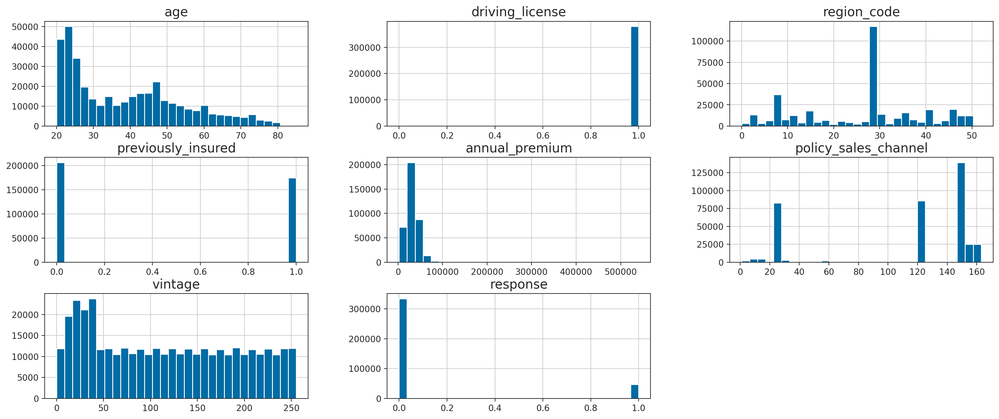

In [92]:
num_attributes.drop(columns = ['id'], inplace = True)
num_attributes.hist(bins=30);

### 1.6.2 Categorical Attributes

In [34]:
cat_attributes.describe()

,gender,vehicle_age,vehicle_damage
count,381109,381109,381109
unique,2,3,2
top,Male,1-2 Year,Yes
freq,206089,200316,192413


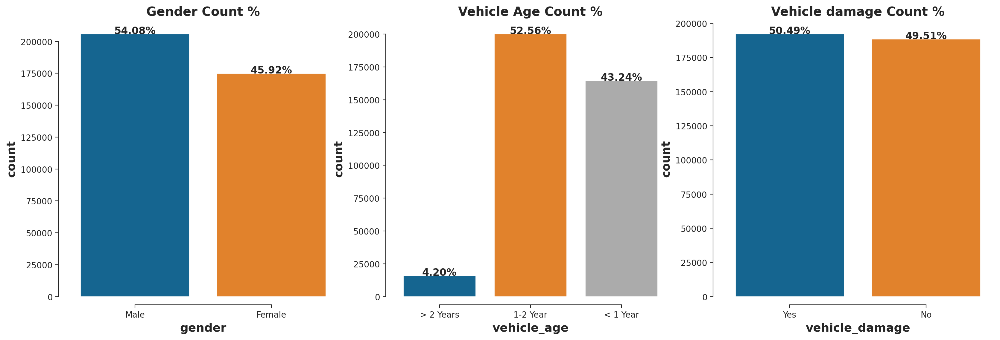

In [161]:
# categorical
plt.figure(figsize=[20,6])

# Distribuição por Gender
plt.subplot( 1, 3, 1 )
ax=sns.countplot(cat_attributes['gender'])
total=len(cat_attributes['gender'])
graphic_percentage(ax,total,'Gender Count %')
sns.despine(offset = 10, trim = True)

# Distribuição por Vehicle Age
plt.subplot( 1, 3, 2 )
ax=sns.countplot(cat_attributes['vehicle_age'])
total=len(cat_attributes['vehicle_age'])
graphic_percentage(ax,total,'Vehicle Age Count %')
sns.despine(offset = 10, trim = True)

# Distribuição por Vehicle Damage
plt.subplot( 1, 3, 3 )
ax=sns.countplot(cat_attributes['vehicle_damage'])
total=len(cat_attributes['vehicle_damage'])
graphic_percentage(ax,total,'Vehicle damage Count %')
sns.despine(offset = 10, trim = True)

# 2.0 Feature Engineering

In [24]:
#security copy
df2 = df1.copy()

In [25]:
# vehicle_age
df2['vehicle_age'] = df2['vehicle_age'].map(vehicle_age_map) 

# vehicle_damage
df2['vehicle_damage'] = df2['vehicle_damage'].map(damage_map).astype( uint8 ) 

# potential
# Calculus
potential =  (df2['gender'].map(gender_weight_map) + 
              df2['annual_premium'].apply(premium_weight_map) + 
              df2['age'].apply(age_weight_map) +
              df2['driving_license']) 

# insert column
df2.insert(loc=len(df2.columns)-1, column='potential', value=potential)

# historical
# Calculus
historical = (df2['vehicle_age']**2 + 
              df2['vehicle_damage'] + 
              df2['previously_insured'])

# insert column
df2.insert(loc=len(df2.columns)-1, column='historical', value=historical)

In [26]:
df2.head(10)

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,potential,historical,response
0,1,Male,44,1,28,0,2.0,1,40454.0,26,217,7.6,5.00,1
1,2,Male,76,1,3,0,1.5,0,33536.0,26,183,5.6,2.25,0
2,3,Male,47,1,28,0,2.0,1,38294.0,26,27,8.6,5.00,1
3,4,Male,21,1,11,1,1.0,0,28619.0,152,203,6.1,2.00,0
4,5,Female,29,1,41,1,1.0,0,27496.0,152,39,5.9,2.00,0
5,6,Female,24,1,33,0,1.0,1,2630.0,160,176,3.9,2.00,0
6,7,Male,23,1,11,0,1.0,1,23367.0,152,249,6.1,2.00,0
7,8,Female,56,1,28,0,1.5,1,32031.0,26,72,7.4,3.25,1
8,9,Female,24,1,3,1,1.0,0,27619.0,152,28,5.9,2.00,0
9,10,Female,32,1,6,1,1.0,0,28771.0,152,80,6.9,2.00,0


In [27]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int32  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int16  
 3   driving_license       381109 non-null  uint8  
 4   region_code           381109 non-null  int16  
 5   previously_insured    381109 non-null  uint8  
 6   vehicle_age           381109 non-null  float64
 7   vehicle_damage        381109 non-null  uint8  
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  int16  
 10  vintage               381109 non-null  uint8  
 11  potential             381109 non-null  float64
 12  historical            381109 non-null  float64
 13  response              381109 non-null  uint8  
dtypes: float64(4), int16(3), int32(1), object(1), uint8(

## 2.1 Hypothesis MindMap 

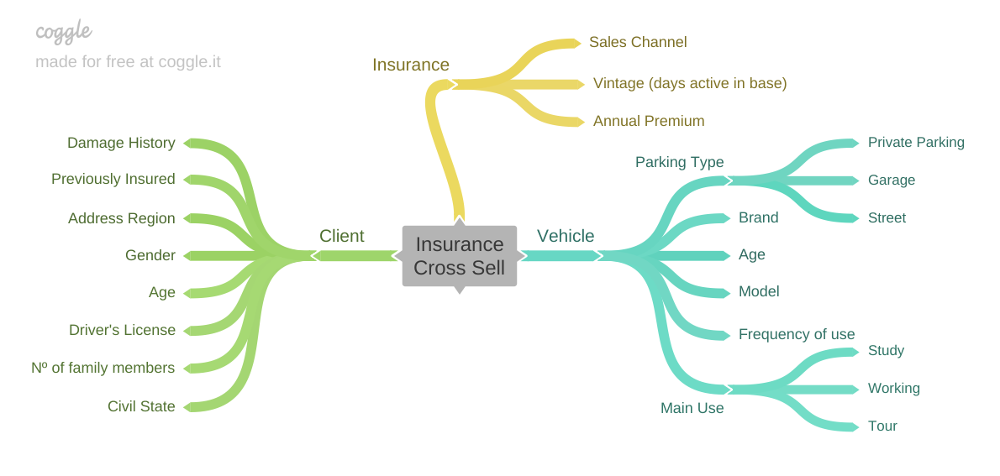

In [42]:
Image('../references/Insurance.png')

## 2.2 Business Hypothesis

**H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.   
**H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos.  
**H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
**H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos.  
**H5** - Clientes acima de 30 anos são mais interessados em adquirir seguro de veículos.   
**H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.  
**H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.  
**H8** - Apenas 10 canais de venda concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.  
**H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.

# 3.0 Data Filtering

In [28]:
#security copy
df3 = df2.copy()

# 4.0 EDA (Exploratory Data Analysis)

In [29]:
#security copy
df4 = df3.copy()

## 4.1 Univariate Analysis

### Response

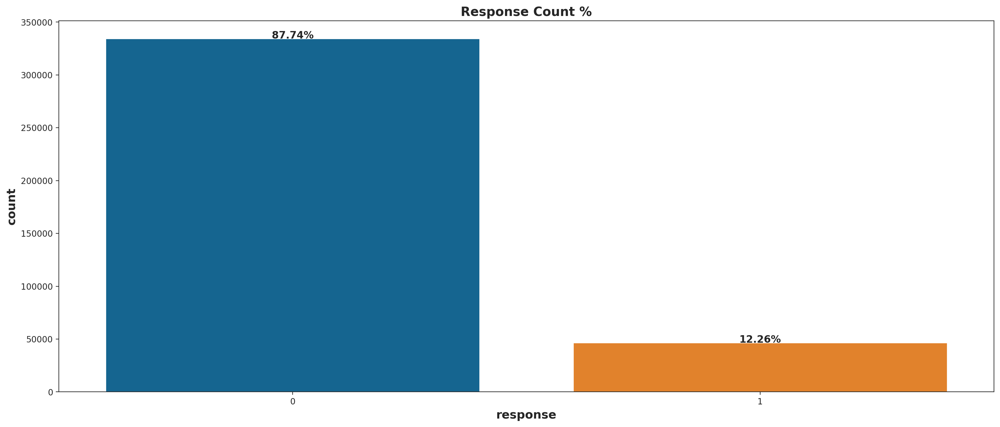

In [95]:
## response
ax=sns.countplot(df4['response'])
total=len(df4['response'])
graphic_percentage(ax,total,'Response Count %')

In [96]:
balance = df4['response'].value_counts(normalize=True)
print(f'Apenas {100*balance[1]:.2f}% dos clientes demonstraram interesse em adquirir o seguro de automóvel')

Apenas 12.26% dos clientes demonstraram interesse em adquirir o seguro de automóvel


## 4.2 Bivariate Analysis

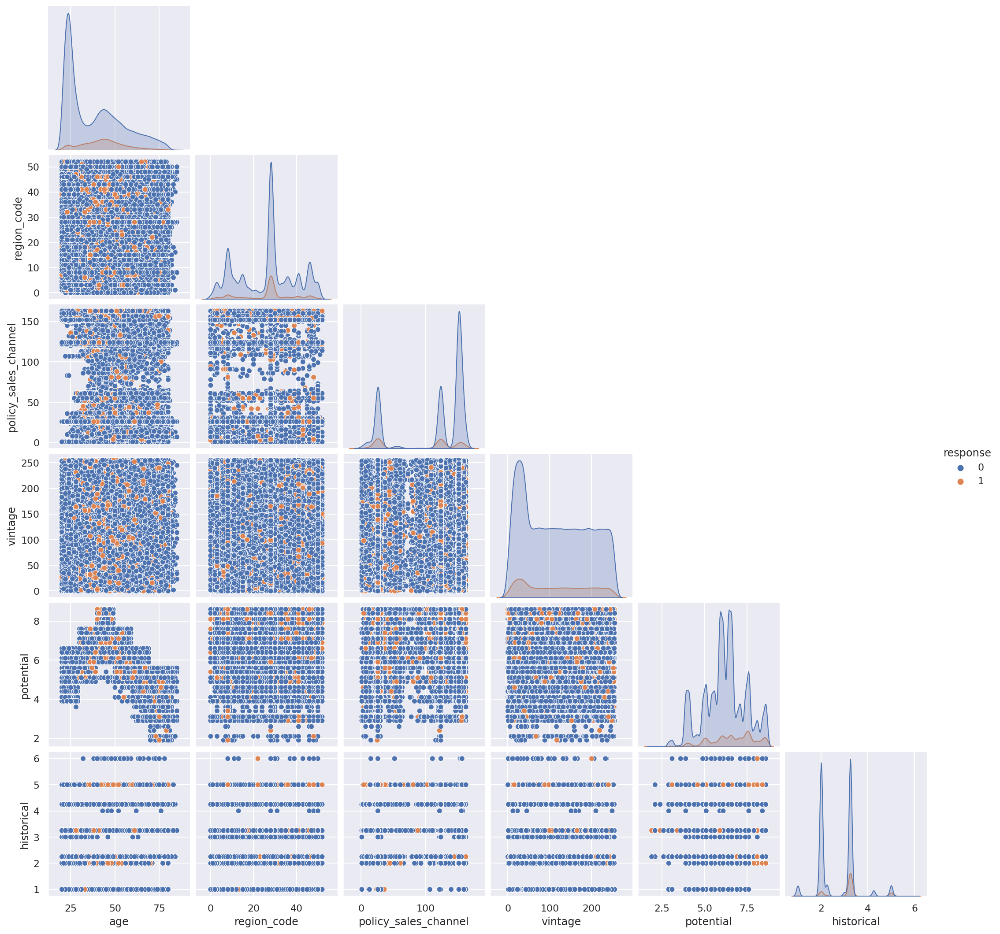

In [202]:
# pairplot
sns.pairplot(df4.drop(columns=['id'],axis=1), 
             x_vars=['age','region_code','policy_sales_channel', 'vintage', 'potential', 'historical'],
             y_vars=['age','region_code','policy_sales_channel', 'vintage', 'potential', 'historical'],
             hue='response', corner=True);

### Gender

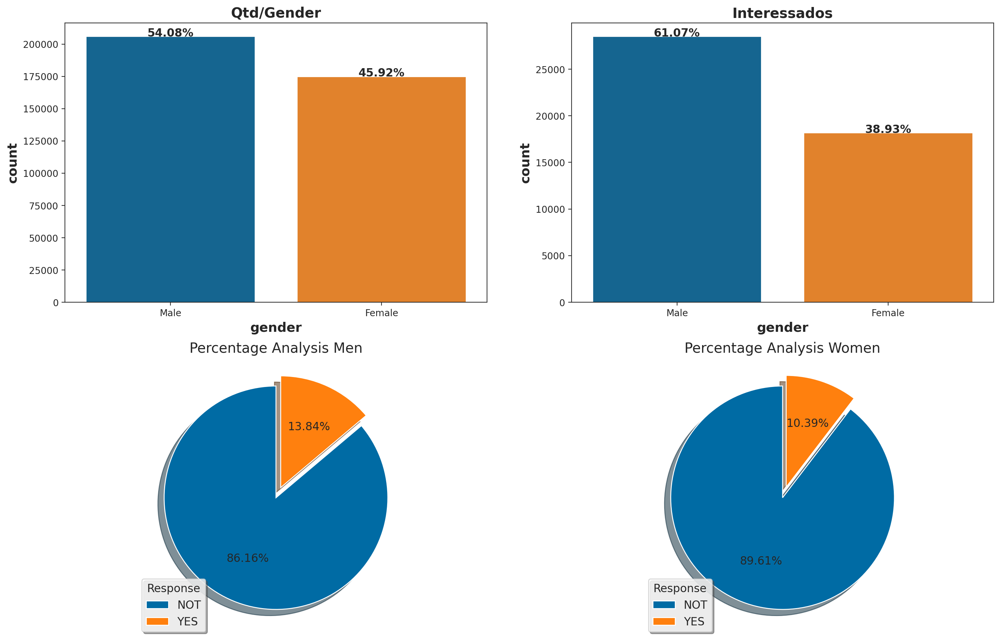

gender,Female,Male,Female,Male
response,,,,
NOT,156835,177564,0.896,0.862
YES,18185,28525,0.104,0.138


In [97]:
## gender
aux = pd.crosstab(df4['gender'], df4['response'])#.apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux = aux.T
aux = aux.rename(index={0: 'NOT', 1:'YES'})

aux2 = pd.crosstab(df4['gender'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux2 = aux2.T
aux2 = aux2.rename(index={0: 'NOT', 1:'YES'})

plt.figure(figsize=[18,12])

# Distribuição por Gênero
plt.subplot(2,2,1)
ax=sns.countplot(df4['gender'])
total=len(df4['gender'])
graphic_percentage(ax,total,'Qtd/Gender')

# Distribuição de Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['response']==1,'gender'])
total=len(df4.loc[df4['response']==1,'gender'])
graphic_percentage(ax,total,'Interessados')

# PiePlot Male
plt.subplot(2,2,3)
plt.pie(aux['Male'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Men')

# PiePlot Female
plt.subplot(2,2,4)
plt.pie(aux['Female'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Women')
plt.show()

# cross tab
pd.concat([aux,aux2], axis=1)

### Age

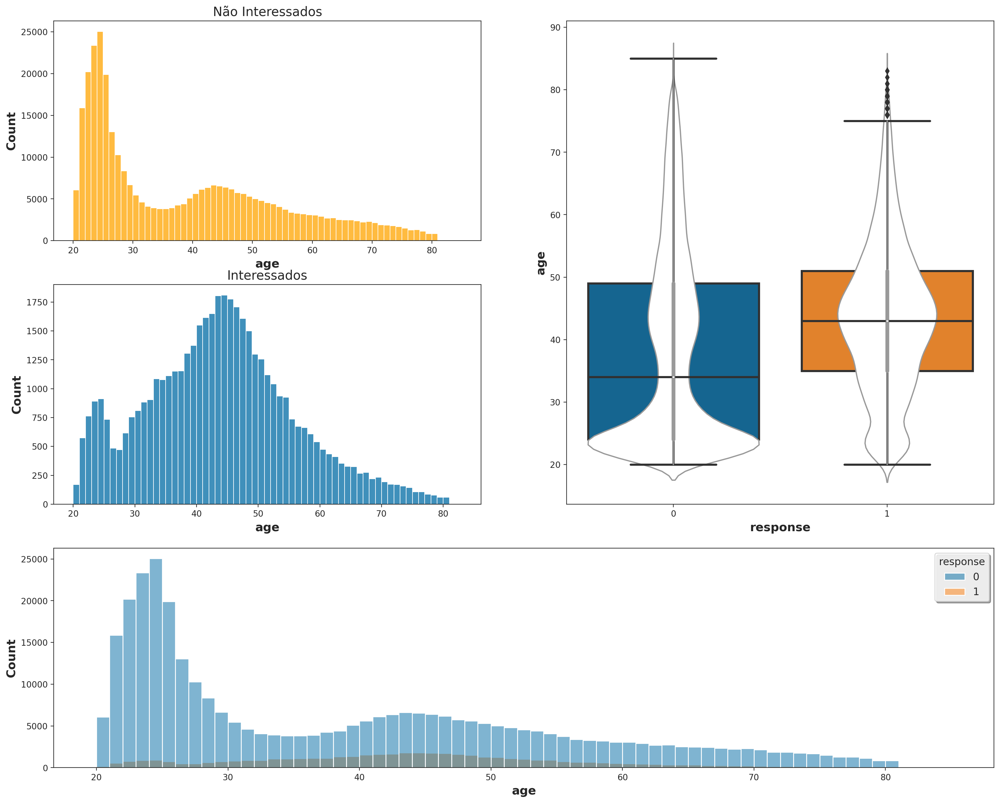

In [139]:
## age
plt.figure(figsize=[20,16])

# Distribuição de Não Interessados
plt.subplot(3,2,1)
sns.histplot(df4.loc[df4['response']==0,'age'], binwidth=1, color='orange');
plt.title('Não Interessados')

# Distribuição de Interessados
plt.subplot(3,2,3)
sns.histplot(df4.loc[df4['response']==1,'age'], binwidth=1);
plt.title('Interessados')

# Boxplot/Violinplot
plt.subplot(3,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['age'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['age'], color="white", edgecolor="gray");

# Sobreposição das distribuições
plt.subplot(3,2,(5,6))
sns.histplot(df4, x='age', hue='response', binwidth=1);

### Driving License

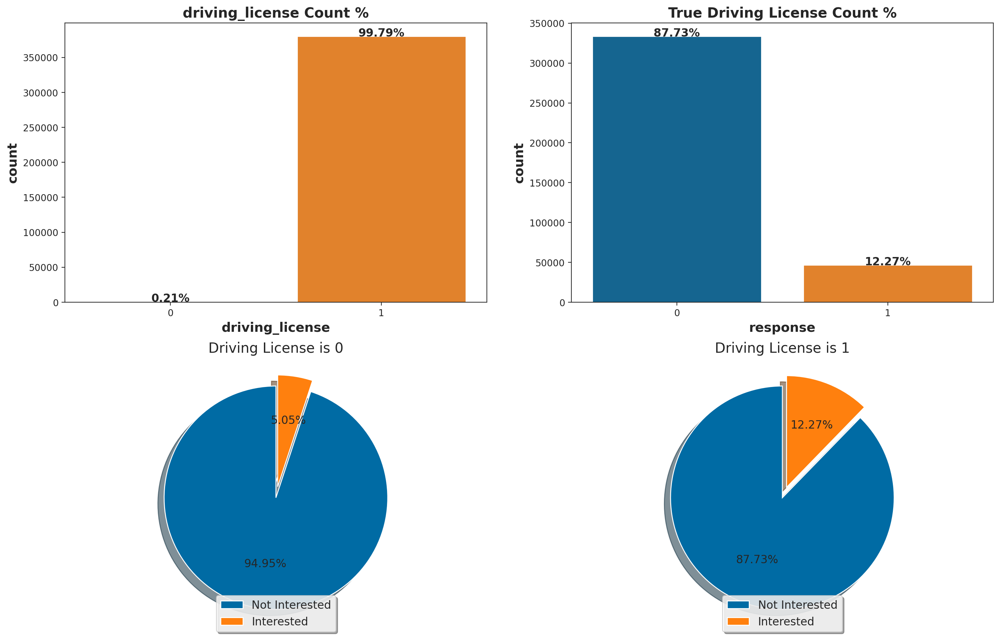

response,0,1,0,1
driving_license,,,,
0,771,41,0.950,0.050
1,333628,46669,0.877,0.123


In [101]:
## driving_license
# cross tab
df_aux_n = pd.crosstab(df4['driving_license'], df4['response'])
df_aux_p = pd.crosstab(df4['driving_license'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição por Driving License
plt.subplot(2,2,1)
ax=sns.countplot(df4['driving_license'])
total=len(df4['driving_license'])
graphic_percentage(ax,total,'driving_license Count %')

# Distribuição dos Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['driving_license']==1,'response'])
total=len(df4.loc[df4['driving_license']==1,'response'])
graphic_percentage(ax,total,'True Driving License Count %')

# Pieplot Driving License is 0
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 0')
plt.legend(loc=8);

# Pieplot Driving License is 1
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 1')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Region Code

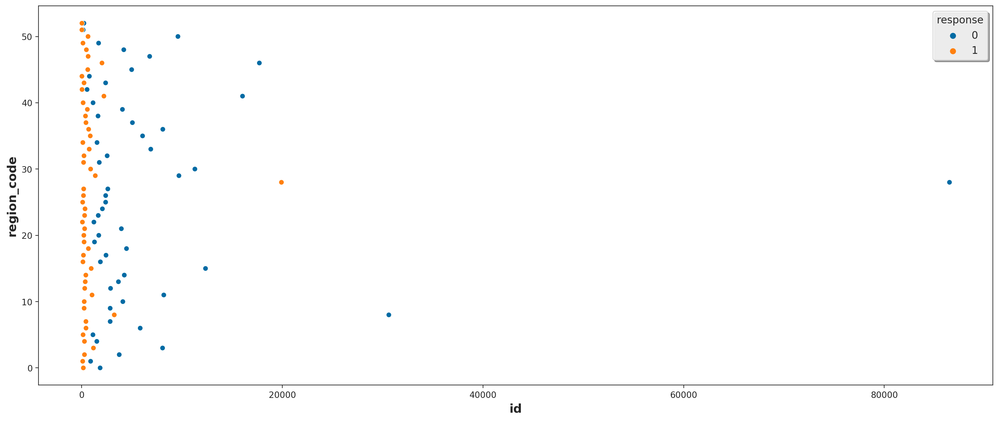

In [168]:
## region_code
aux1 = df4[['id','region_code','response']].groupby(['region_code','response']).count().reset_index()

sns.scatterplot(y=aux1.region_code, x=aux1.id, hue=aux1.response);

### Previously Insured

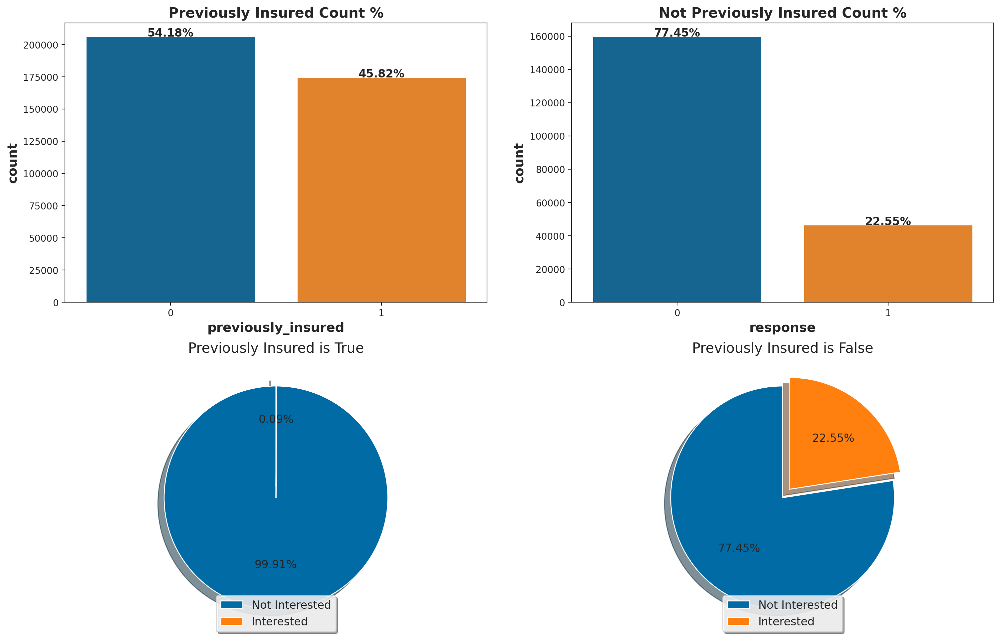

response,0,1,0,1
previously_insured,,,,
0,159929,46552,0.775,0.225
1,174470,158,0.999,0.001


In [103]:
## previously_insured
# cross tab
df_aux_n = pd.crosstab(df4['previously_insured'], df4['response'])
df_aux_p = pd.crosstab(df4['previously_insured'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

plt.subplot(2,2,1)
ax=sns.countplot(df4['previously_insured'])
total=len(df4['previously_insured'])
graphic_percentage(ax,total,'Previously Insured Count %')

plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['previously_insured']==0,'response'])
total=len(df4.loc[df4['previously_insured']==0,'response'])
graphic_percentage(ax,total,'Not Previously Insured Count %')

plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Previously Insured is True')
plt.legend(loc=8);

plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Previously Insured is False')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Vehicle Age

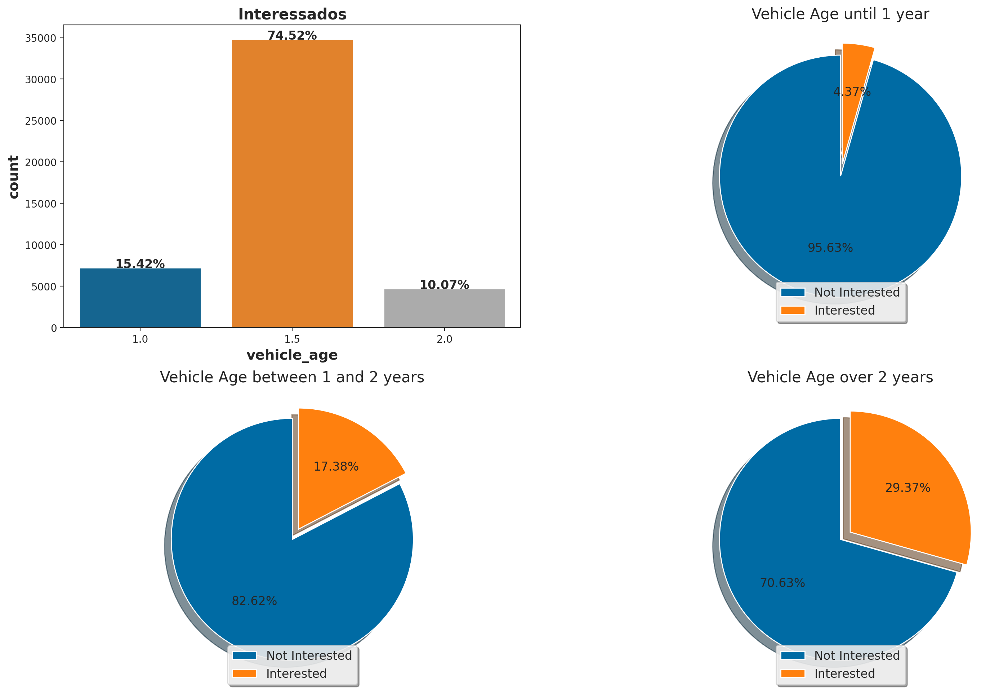

response,0,1,0,1
vehicle_age,,,,
1.000,157584,7202,0.956,0.044
1.500,165510,34806,0.826,0.174
2.000,11305,4702,0.706,0.294


In [104]:
## vehicle_age
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_age'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_age'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
ax=sns.countplot(df4.loc[df4['response']==1,'vehicle_age'])
total=len(df4.loc[df4['response']==1,'vehicle_age'])
graphic_percentage(ax,total,'Interessados')

# Pieplot Vehicle Age until 1 year
plt.subplot(2,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age until 1 year')
plt.legend(loc=8);

# Pieplot Vehicle Age between 1 and 2 years
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[1.5,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age between 1 and 2 years')
plt.legend(loc=8);

# Pieplot Vehicle Age over 2 years
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[2,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age over 2 years')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Vehicle Damage

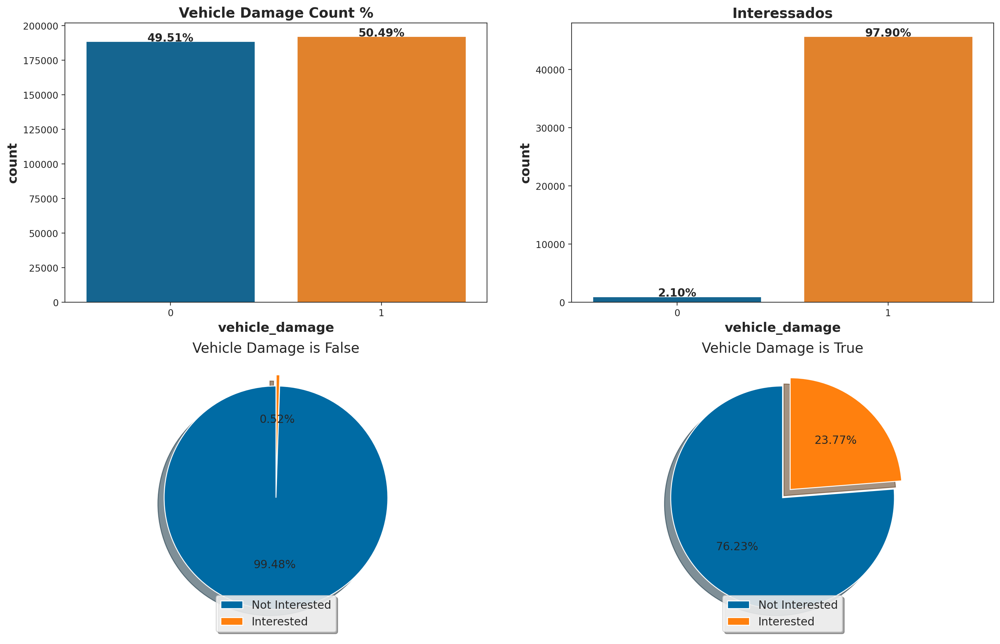

response,0,1,0,1
vehicle_damage,,,,
0,187714,982,0.995,0.005
1,146685,45728,0.762,0.238


In [105]:
# vehicle_damage
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_damage'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_damage'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Distribuição por Vehicle Damage
plt.subplot(2,2,1)
ax=sns.countplot(df4['vehicle_damage'])
total=len(df4['vehicle_damage'])
graphic_percentage(ax,total,'Vehicle Damage Count %')

# Distribuição de Interessados
plt.subplot(2,2,2)
ax=sns.countplot(df4.loc[df4['response']==1,'vehicle_damage'])
total=len(df4.loc[df4['response']==1,'vehicle_damage'])
graphic_percentage(ax,total,'Interessados')

# Pieplot Vehicle Damage is False
plt.subplot(2,2,3)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is False')
plt.legend(loc=8);

# Pieplot Vehicle Damage is True
plt.subplot(2,2,4)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is True')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

### Annual Premium

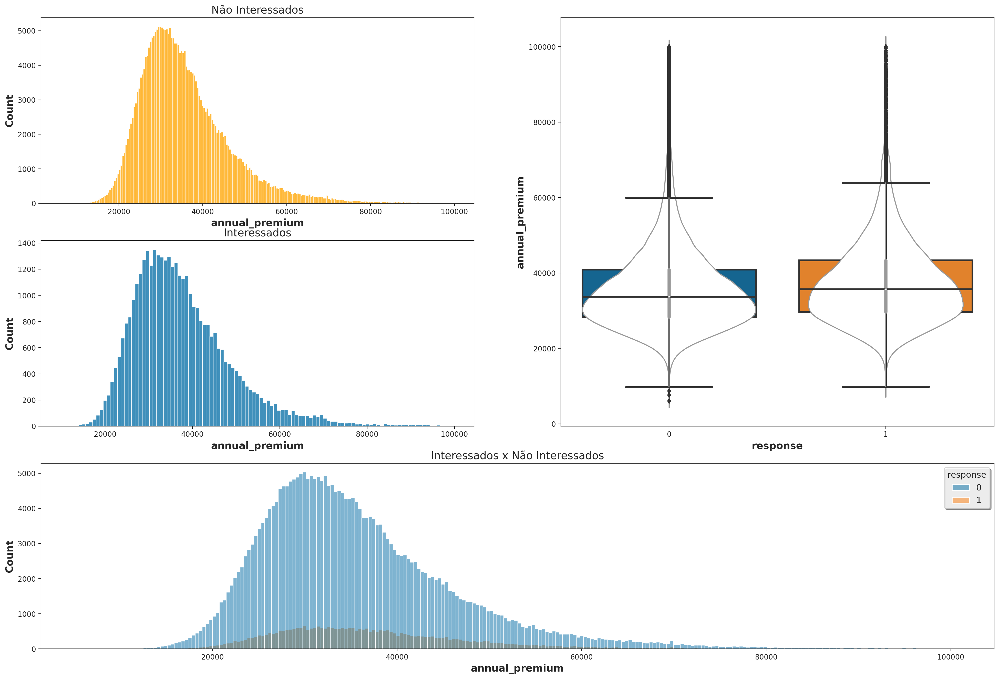

In [107]:
## annual_premium
aux01 = df4[(df4['annual_premium'] > 3000) & (df4['annual_premium'] < 100000)]
aux02 = aux01.loc[aux01['response'] == 0, 'annual_premium']

aux03 = df4[(df4['annual_premium'] > 3000) & (df4['annual_premium'] < 100000)]
aux04 = aux03.loc[aux01['response'] == 1, 'annual_premium']

aux05 = df4.loc[(df4['annual_premium']>3000)&(df4['annual_premium']<100000), 'annual_premium']

plt.figure(figsize=[24,16])

# Distribuição de Não Interessados
plt.subplot(3,2,1)
sns.histplot(aux02, color = 'orange')
plt.title('Não Interessados')

# Distribuição de Interessados
plt.subplot(3,2,3)
sns.histplot(aux04)
plt.title('Interessados')

# Boxplot/Violinplot
plt.subplot(3,2,(2,4))
sns.boxplot(x=df4['response'], y=aux01.annual_premium, linewidth=2.5);
sns.violinplot(x=df4['response'], y=aux01.annual_premium, color="white", edgecolor="gray");

# Sobreposição das distribuições
plt.subplot(3,2,(5,6))
sns.histplot(aux01, x = 'annual_premium', hue = 'response');
plt.title('Interessados x Não Interessados');

### Policy Sales Channel

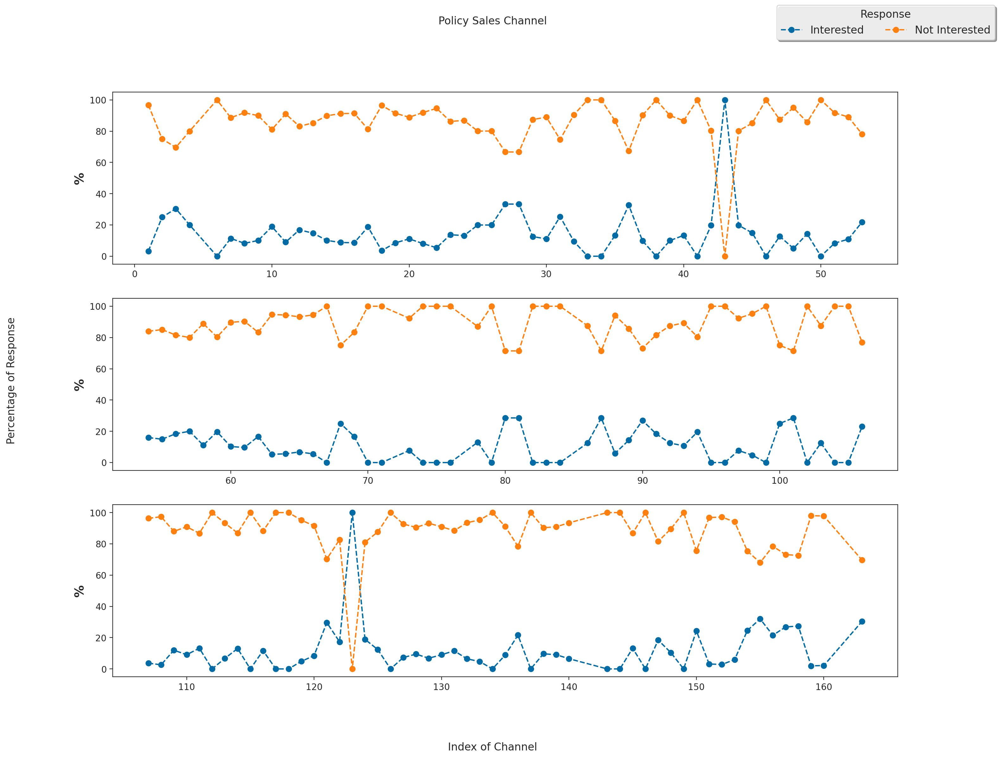

In [108]:
## policy_sales_channel
aux_index = df4['policy_sales_channel'].unique()
aux = pd.DataFrame({'yes':[1],'not':[0]}, index=aux_index)

aux['yes']= df4.groupby('policy_sales_channel')['response'].sum()
aux['not']= df4.groupby('policy_sales_channel')['response'].count()-aux['yes']

aux.index.names = ['psc']
aux = aux.sort_values('psc',ascending=True)

# separate classes
aux01 = aux[(aux.index>=0)&(aux.index<=53)]
aux02 = aux[(aux.index>53)&(aux.index<=106)]
aux03 = aux[aux.index>106]

# stacked data
stacked_data_01 = aux01.apply(lambda x: x*100/sum(x), axis=1)
stacked_data_02 = aux02.apply(lambda x: x*100/sum(x), axis=1)
stacked_data_03 = aux03.apply(lambda x: x*100/sum(x), axis=1)

# plot
fig = plt.figure(figsize=(16,12))
fig.suptitle('Policy Sales Channel')
fig.supxlabel('Index of Channel')
fig.supylabel('Percentage of Response')

ax1 = fig.add_subplot(3, 1, 1, ylabel='%')
ax1.plot(stacked_data_01, marker='o', linestyle='--', label=['Interested','Not Interested']);
ax2 = fig.add_subplot(3, 1, 2, ylabel='%')
ax2.plot(stacked_data_02, marker='o', linestyle='--');
ax3 = fig.add_subplot(3, 1, 3, ylabel='%')
ax3.plot(stacked_data_03, marker='o', linestyle='--');

fig.legend(title='Response', ncol=2);

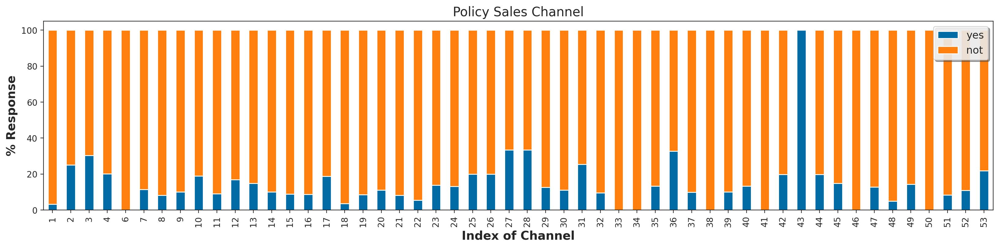

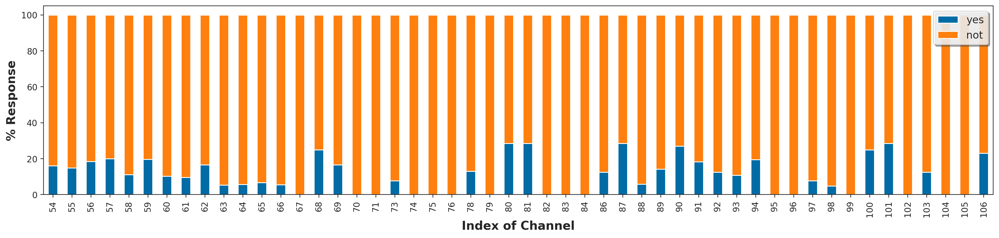

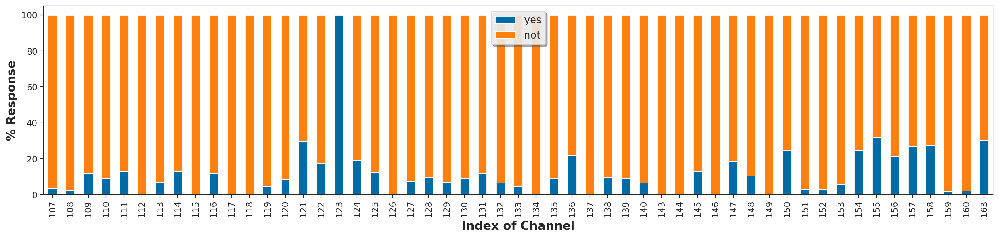

In [109]:
# 100% stacked bar
stacked_data_01.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel').set_title('Policy Sales Channel');
stacked_data_02.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel');
stacked_data_03.plot(kind="bar", stacked=True, figsize=(20,4), ylabel='% Response', xlabel='Index of Channel');

### Vintage

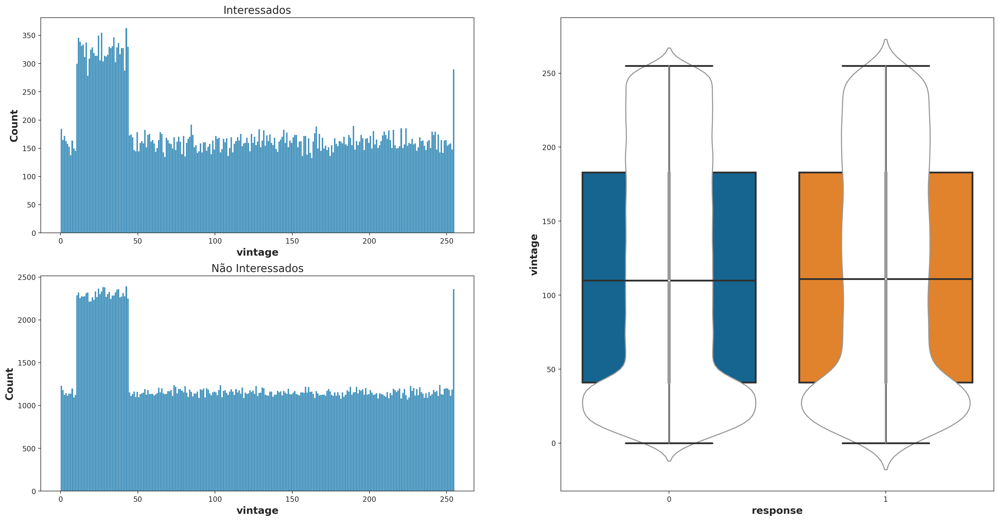

In [110]:
## vintage
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
sns.histplot(df4.loc[df4['response']==1,'vintage'], binwidth=1);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
sns.histplot(df4.loc[df4['response']==0,'vintage'], binwidth=1);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['vintage'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['vintage'], color="white", edgecolor="gray");

### Potential

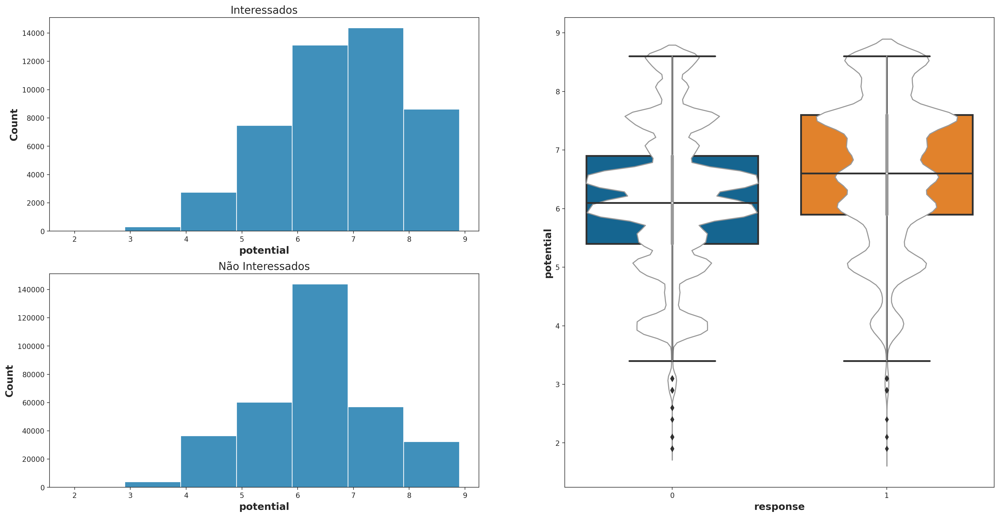

In [111]:
## potential
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
sns.histplot(df4.loc[df4['response']==1,'potential'], binwidth=1);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
sns.histplot(df4.loc[df4['response']==0,'potential'], binwidth=1);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['potential'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['potential'], color="white", edgecolor="gray");

### Historical

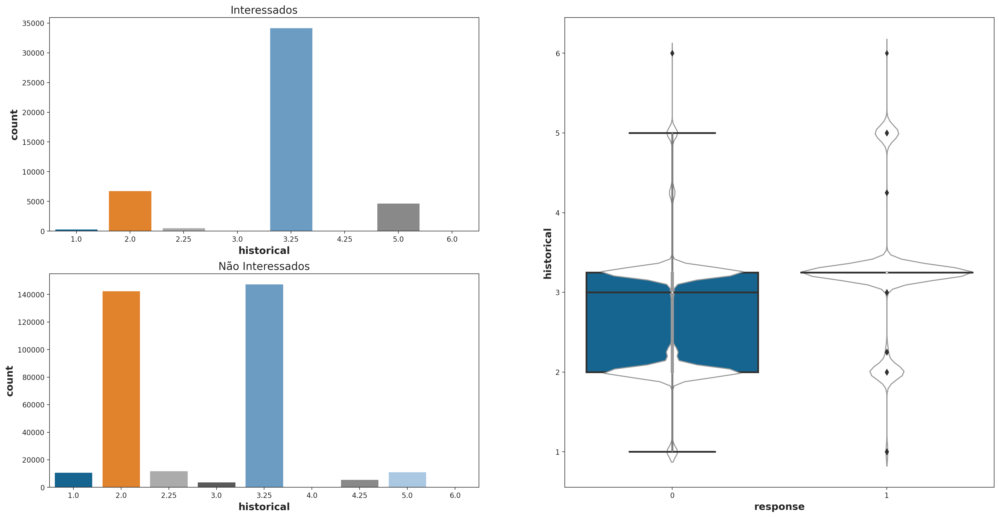

In [112]:
## historical
plt.figure(figsize=[24,12])

# Distribuição de Interessados
plt.subplot(2,2,1)
#sns.histplot(df4.loc[df4['response']==1,'historical'], binwidth=1);
sns.countplot(df4.loc[df4['response']==1,'historical']);
plt.title('Interessados')

# Distribuição de Não Interessados
plt.subplot(2,2,3)
#sns.histplot(df4.loc[df4['response']==0,'historical'], binwidth=1);
sns.countplot(df4.loc[df4['response']==0,'historical']);
plt.title('Não Interessados')

# Boxplot/Violinplot
plt.subplot(2,2,(2,4))
sns.boxplot(x=df4['response'], y=df4['historical'], linewidth=2.5);
sns.violinplot(x=df4['response'], y=df4['historical'], color="white", edgecolor="gray");

## 4.3 Multivariate Analysis

### 4.3.1 Numerical Attributes

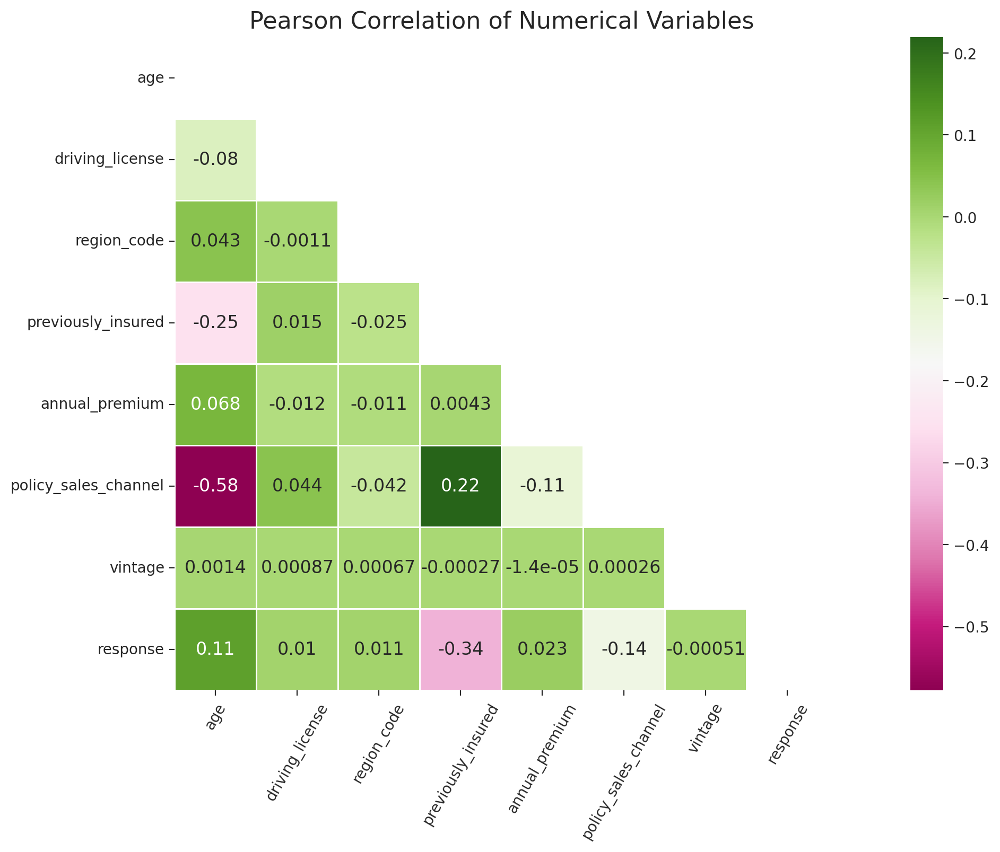

In [143]:
# correlation
corr = num_attributes.corr(method = 'pearson')

# Creating a with mask for the superior triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("ticks"):
    # Creating the chart with mask
    plt.figure(figsize(20,8))
    ax = sns.heatmap(corr, mask=mask, annot = True, linewidths=.5, square=True, cmap="PiYG")
    plt.xticks(size = 10, rotation=60)
    plt.yticks(size = 10)
    plt.title("Pearson Correlation of Numerical Variables", size=16);

### 4.3.2 Categorical Attributes

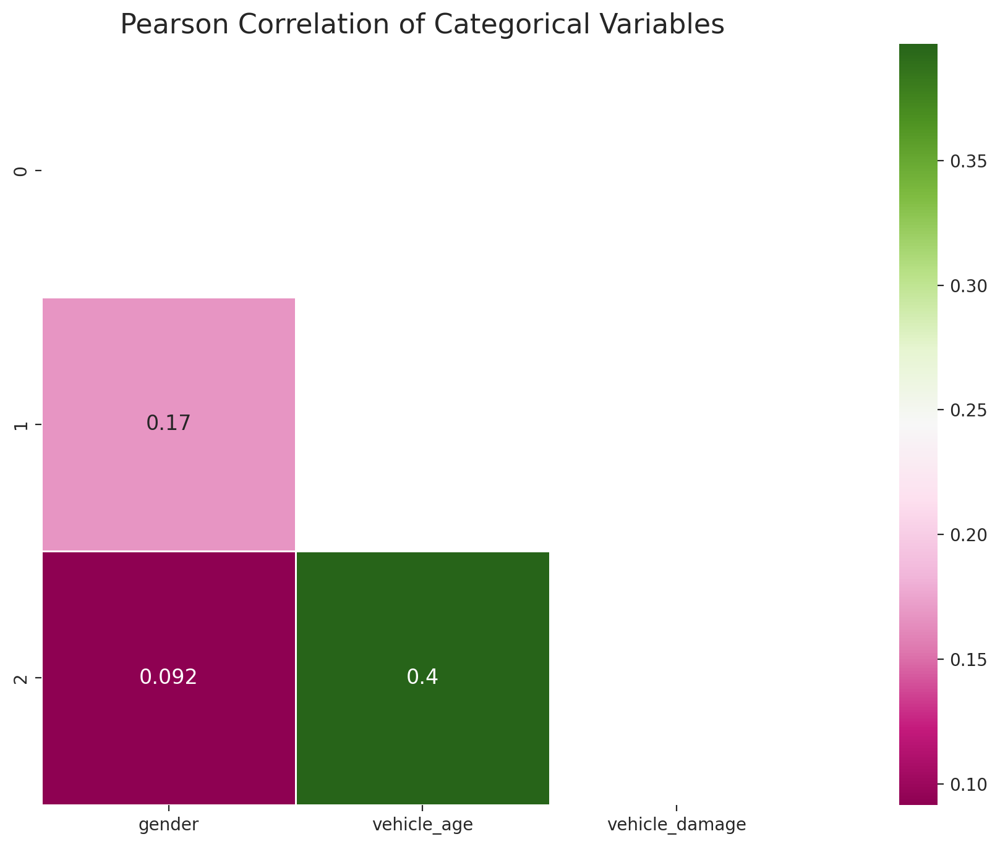

In [144]:
# correlation
corr = pd.DataFrame(corr_cramer_v(cat_attributes))

# Creating a with mask for the superior triangle
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

with sns.axes_style("ticks"):
    # Creating the chart with mask
    plt.figure(figsize(20,8))
    ax = sns.heatmap(corr, mask=mask, annot = True, linewidths=.5, square=True, cmap="PiYG")
    plt.xticks(size = 10, rotation=0)
    plt.yticks(size = 10)
    plt.title("Pearson Correlation of Categorical Variables", size=16);

## 4.4 Business Hypothesis

### 4.4.1 Hypothesis MindMap 

### 4.4.2 Hypothesis Creation

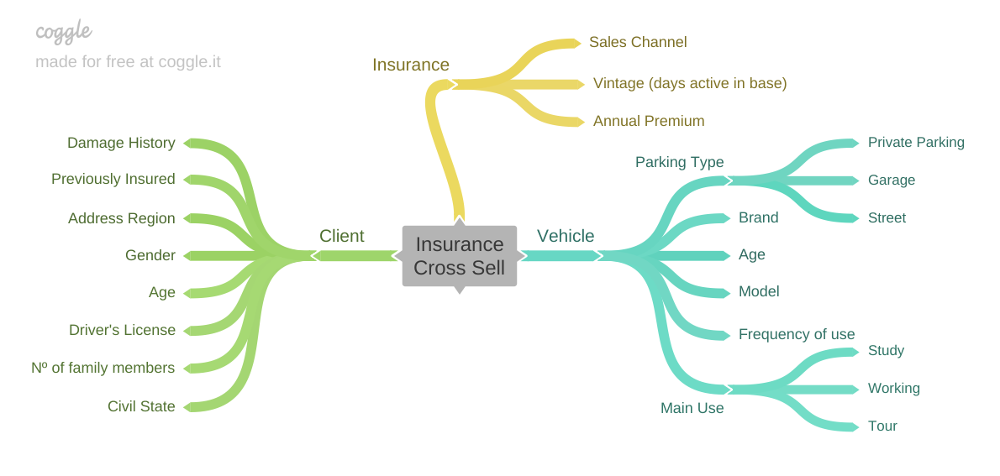

In [51]:
Image('../references/Insurance.png')

**H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.   
**H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos.  
**H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
**H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos.  
**H5** - Clientes na faixa etária de 30 a 40 anos são mais interessados em adquirir seguro de veículos.   
**H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.  
**H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.  
**H8** - Apenas 10 canais de venda concentram a maioria dos clientes que estão interessados em adquirir seguro de veículos.  
**H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.

### 4.2.3 Hypothesis Validation

#### **H1** - Homens tem mais interesse em comprar seguro de veículos do que mulheres.  
   - **Verdadeira**: Entre os interessados em adquirir o seguro de carro, mais de 60% são homens. Além disso, entre os homens o percentual de interesse é de 14%, enquanto entre as mulheres é de apenas 10%

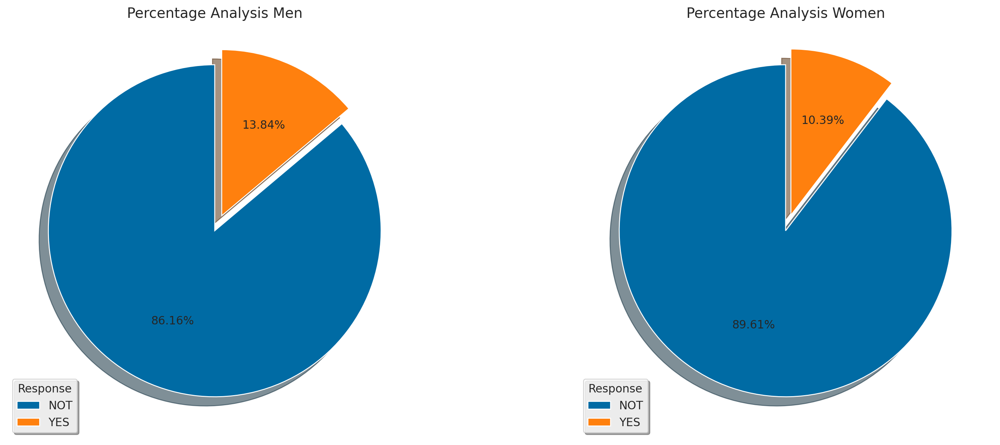

gender,Female,Male,Female,Male
response,,,,
NOT,156835,177564,0.896,0.862
YES,18185,28525,0.104,0.138


In [115]:
## gender
aux = pd.crosstab(df4['gender'], df4['response'])
aux = aux.T
aux = aux.rename(index={0: 'NOT', 1:'YES'})

aux2 = pd.crosstab(df4['gender'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)
aux2 = aux2.T
aux2 = aux2.rename(index={0: 'NOT', 1:'YES'})

plt.figure(figsize=[20,8])

# PiePlot Male
plt.subplot(1,2,1)
plt.pie(aux['Male'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Men')

# PiePlot Female
plt.subplot(1,2,2)
plt.pie(aux['Female'], labels=aux.index, startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None);
plt.legend(loc=3, title='Response');
plt.title('Percentage Analysis Women')
plt.show()

# cross tab
pd.concat([aux,aux2], axis=1)

#### **H2** - Clientes com carros novos/seminovos (menor que 2 anos), tem mais interesse em seguro de veículos. 
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, quase 75% possuem carros seminovos. Apesar disso, entre os que possuem carros mais velhos o percentual de interesse é de quase 30%, enquanto entre os que possuem carros novos e seminovos o percentual de interesse é de apenas 5% e 17%, respectivamente.

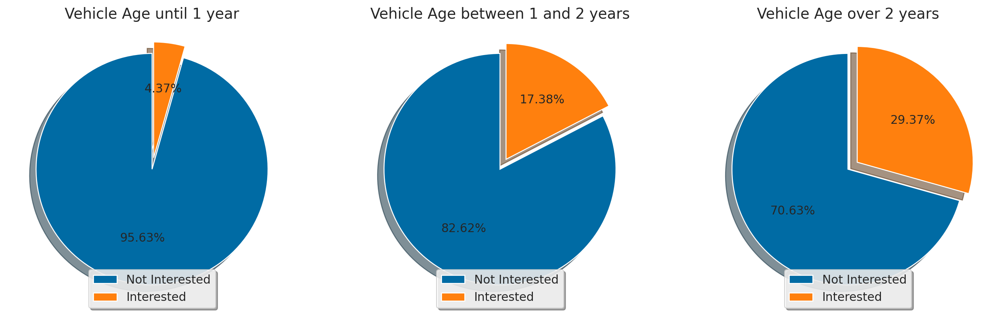

response,0,1,0,1
vehicle_age,,,,
1.000,157584,7202,0.956,0.044
1.500,165510,34806,0.826,0.174
2.000,11305,4702,0.706,0.294


In [116]:
## vehicle_age
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_age'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_age'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[18,12])

# Pieplot Vehicle Age until 1 year
plt.subplot(1,3,1)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age until 1 year')
plt.legend(loc=8);

# Pieplot Vehicle Age between 1 and 2 years
plt.subplot(1,3,2)
plt.pie(df_aux_n.loc[1.5,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age between 1 and 2 years')
plt.legend(loc=8);

# Pieplot Vehicle Age over 2 years
plt.subplot(1,3,3)
plt.pie(df_aux_n.loc[2,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Age over 2 years')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H3** - Clientes sem carteira de motorista não tem interesse algum em seguro de veículos.  
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, quase a totalidade (99,79%) possui carteira de motorista. Apesar disso, entre os que não possuem carteira, 5% deles (41 clientes) demonstraram interesse no seguro de carro.

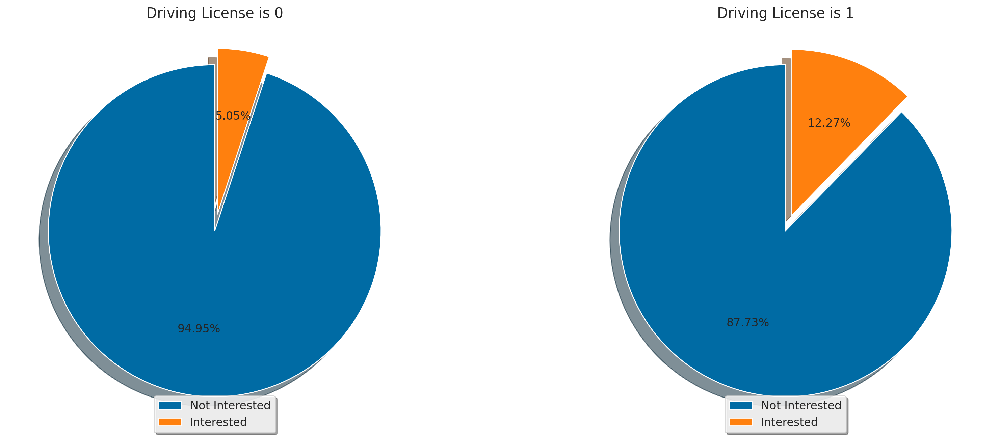

response,0,1,0,1
driving_license,,,,
0,771,41,0.950,0.050
1,333628,46669,0.877,0.123


In [117]:
## driving_license
# cross tab
df_aux_n = pd.crosstab(df4['driving_license'], df4['response'])
df_aux_p = pd.crosstab(df4['driving_license'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[20,8])

# Pieplot Driving License is 0
plt.subplot(1,2,1)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 0')
plt.legend(loc=8);

# Pieplot Driving License is 1
plt.subplot(1,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Driving License is 1')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H4** - Clientes que já sofreram algum acidente tem mais interesse em adquirir seguro de veículos. 
   - **Verdadeira**: Entre os interessados em adquirir o seguro de carro, quase a totalidade (97,90%) já teve episódio de acidente ou dano ao veículo. Além disso, cerca de 24% deles demonstraram interesse no seguro de carro, enquanto que entre os que nunca tiveram acidente/dano ao veículo este percentual é de apenas 0.5%.

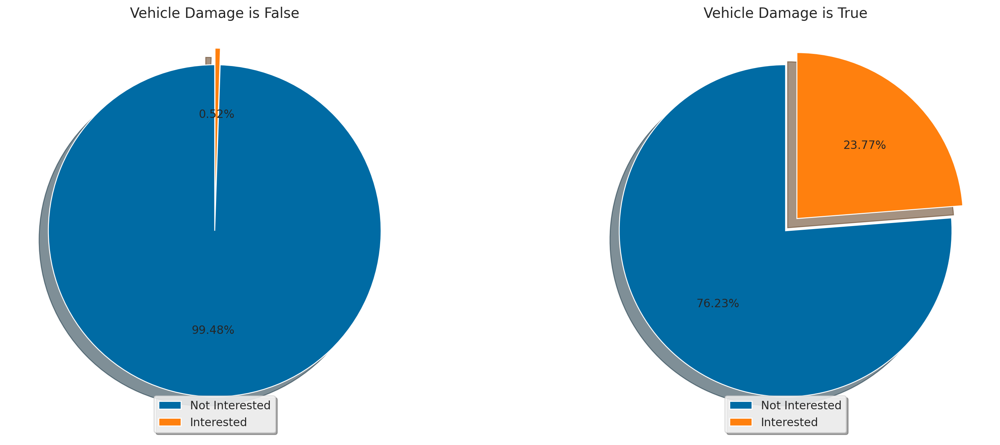

response,0,1,0,1
vehicle_damage,,,,
0,187714,982,0.995,0.005
1,146685,45728,0.762,0.238


In [118]:
# vehicle_damage
# cross tab
df_aux_n = pd.crosstab(df4['vehicle_damage'], df4['response'])
df_aux_p = pd.crosstab(df4['vehicle_damage'], df4['response']).apply(lambda x: np.round(x/x.sum(),3), axis=1)

plt.figure(figsize=[20,8])

# Pieplot Vehicle Damage is False
plt.subplot(1,2,1)
plt.pie(df_aux_n.loc[0,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is False')
plt.legend(loc=8);

# Pieplot Vehicle Damage is True
plt.subplot(1,2,2)
plt.pie(df_aux_n.loc[1,:],labels=['Not Interested','Interested'], startangle=90, autopct='%1.2f%%', shadow=True, explode=(0,0.1), labeldistance=None)
plt.title('Vehicle Damage is True')
plt.legend(loc=8);

plt.show()

# show cross tab
pd.concat([df_aux_n,df_aux_p], axis=1)

#### **H5** - Clientes na faixa etária de 30 a 40 anos são mais interessados em adquirir seguro de veículos. 
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 35% se encontram na faixa etária de 40 a 50 anos. Além disso, dentro desta faixa específica, o percentual de interesse é de 21,24%, contra os 20% de interesse na faixa de 30 a 40 anos.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
20-30,6374.000,148829.000,4.107,95.893,13.646,44.506
30-40,10856.000,43397.000,20.010,79.990,23.241,12.978
40-50,16319.000,60527.000,21.236,78.764,34.937,18.100
50-60,8497.000,39537.000,17.690,82.310,18.191,11.823
60-70,3325.000,25698.000,11.456,88.544,7.118,7.685
70-80,1339.000,16411.000,7.544,92.456,2.867,4.908


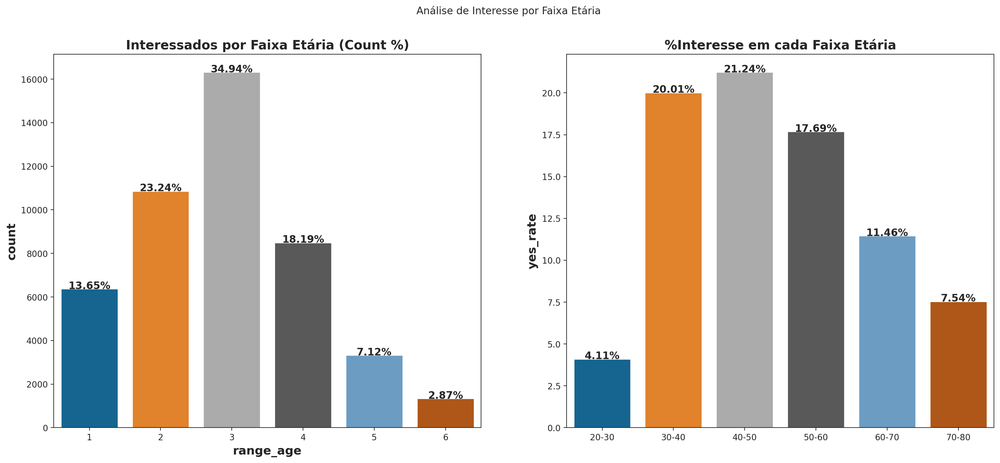

In [119]:
# range age map
df_aux = df4[['response','age']].copy()
df_aux['range_age'] = df_aux['age'].map(age_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_age']

# calculate sum by range age
yes_acc = df_aux.groupby('range_age')['response'].sum()
no_acc  = df_aux.groupby('range_age')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_age.unique()) # sort range_age
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['20-30','30-40','40-50','50-60','60-70','70-80']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Etária')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Etária (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Etária')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H6** - Clientes que pagaram entre 30000 e 40000 de seguro anual tem mais interesse em adquirir seguro de veículos.
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 32% se encontram na faixa de gasto entre 30 e 40 mil. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este o segundo pior percentual entre todos as demais faixas de gastos. Pode-se dizer que quanto maior o gasto o anual com o seguro de saúde, maior é o interesse em adquirir o  seguro de carro.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
0-20,8962.000,61722.000,12.679,87.321,19.186,18.458
20-30,9572.000,85809.000,10.036,89.964,20.492,25.661
30-40,14997.000,110050.000,11.993,88.007,32.107,32.910
40-50,8280.000,49508.000,14.328,85.672,17.726,14.805
50-60,3060.000,16989.000,15.263,84.737,6.551,5.080
60-70,1115.000,6156.000,15.335,84.665,2.387,1.841
70-80,358.000,2166.000,14.184,85.816,0.766,0.648
80-100,366.000,1999.000,15.476,84.524,0.784,0.598


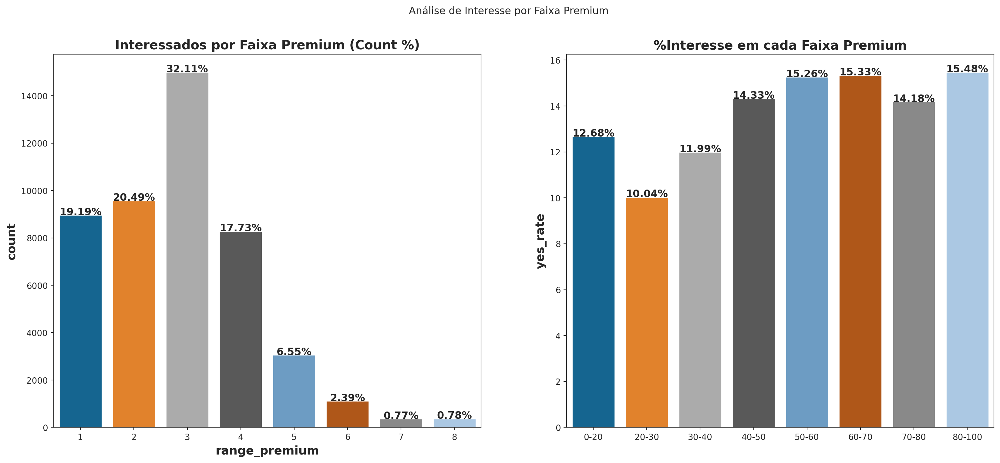

In [120]:
# range premium map
df_aux = df4[['response','annual_premium']].copy()
df_aux['range_premium'] = df_aux['annual_premium'].map(premium_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_premium']

# calculate sum by range_premium
yes_acc = df_aux.groupby('range_premium')['response'].sum()
no_acc  = df_aux.groupby('range_premium')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_premium.unique()) # sort range_premium
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['0-20','20-30','30-40','40-50','50-60','60-70','70-80','80-100']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Premium')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Premium (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Premium')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H7** - Clientes que estão há mais tempo na base demonstram mais interesse em adquirir seguro de veículos.
   - **Falsa**: Entre os interessados em adquirir o seguro de carro, 32,60% entraram na base há no máximo 2 meses. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este semelhante a todos das demais faixas de tempo. Pode-se dizer que o interesse em adquirir o seguro de carro independe de quanto tempo faz que o cliente está na base.

,yes,not,yes_rate,not_rate,yes_tot_rate,not_tot_rate
0-60,15229.000,107991.000,12.359,87.641,32.603,32.294
60-120,9506.000,69688.000,12.003,87.997,20.351,20.840
120-180,9668.000,69074.000,12.278,87.722,20.698,20.656
180-240,9762.000,68917.000,12.407,87.593,20.899,20.609
240-300,2545.000,18729.000,11.963,88.037,5.449,5.601


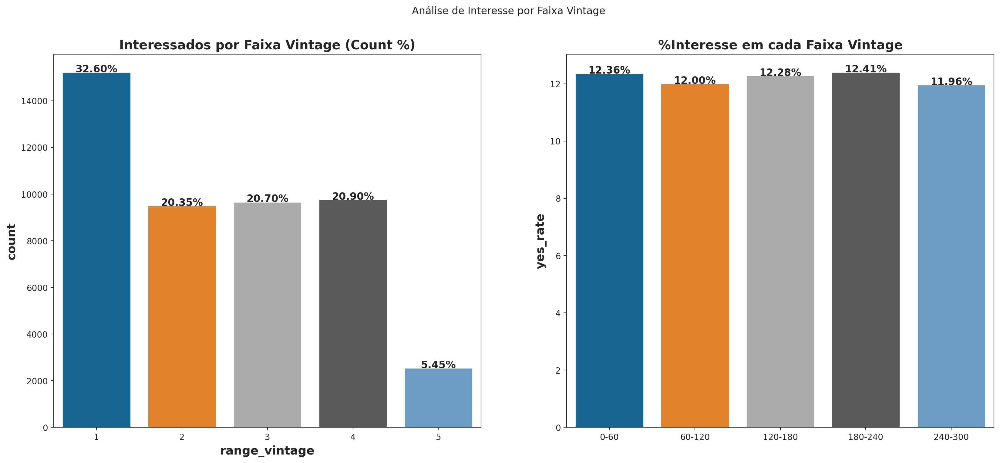

In [121]:
# range vintage map
df_aux = df4[['response','vintage']].copy()
df_aux['range_vintage'] = df_aux['vintage'].map(vintage_range_map)
df_aux_filter = df_aux.loc[df_aux['response']==1,'range_vintage']

# calculate sum by range_premium
yes_acc = df_aux.groupby('range_vintage')['response'].sum()
no_acc  = df_aux.groupby('range_vintage')['response'].count() - yes_acc

# create summary dataframe
index_range = np.sort(df_aux.range_vintage.unique()) # sort range_vintage
df_aux2 = pd.DataFrame({'yes':yes_acc,'not':no_acc}, index=index_range)
df_aux2.index = ['0-60','60-120','120-180','180-240','240-300']
range_list = df_aux2.index.tolist()

# calculate rates by response
df_aux2['yes_rate'] = 100*df_aux2['yes']/(df_aux2['yes']+df_aux2['not'])
df_aux2['not_rate'] = 100*df_aux2['not']/(df_aux2['yes']+df_aux2['not'])

df_aux2['yes_tot_rate'] = 100*df_aux2['yes']/(df_aux2['yes'].sum())
df_aux2['not_tot_rate'] = 100*df_aux2['not']/(df_aux2['not'].sum())

# plot
fig = plt.figure(figsize=(20,8))
fig.suptitle('Análise de Interesse por Faixa Vintage')

# Distribuição de Interessados por Faixa Etária
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.countplot(df_aux_filter)
total=len(df_aux_filter)
graphic_percentage(ax1,total,'Interessados por Faixa Vintage (Count %)')

# Percentual de interesse em cada faixa
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.barplot(x=df_aux2.index, y=df_aux2.yes_rate)
total=100
graphic_percentage(ax2,total,'%Interesse em cada Faixa Vintage')
#ax2.set_title('%Interesse em cada Faixa Etária')

df_aux2

#### **H8** - Apenas 10 canais de venda concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.
   - **Verdadeira**: Entre os 155 canais de venda catalogados na base, em apenas 10 deles estão concentrados 42780 clientes interessados em adquirir o seguro de carro, o que representa mais de 90% do total de clientes interessados. Além disso, há 34 canais de vendas pelos quais nenhum cliente demonstrou interesse em adquirir o novo produto.

Total de Interessados no Top-10 channels: 42780 (91.59% do Total de Interessados)
Total de Interessados: 46710
Total de Canais sem nenhum interessado: 34


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154
channel,26.000,124.000,152.000,156.000,157.000,122.000,154.000,163.000,160.000,155.000,25.000,13.000,55.000,7.000,31.000,3.000,30.000,158.000,12.000,125.000,8.000,151.000,52.000,11.000,29.000,4.000,24.000,15.000,150.000,120.000,14.000,23.000,61.000,60.000,10.000,16.000,136.000,153.000,1.000,147.000,91.000,42.000,59.000,145.000,109.000,44.000,121.000,19.000,116.000,22.000,36.000,9.000,54.000,37.000,131.000,128.000,139.000,56.000,138.000,21.000,106.000,35.000,94.000,103.000,111.000,135.000,47.000,148.000,127.000,140.000,53.000,113.000,45.000,90.000,86.000,18.000,64.000,119.000,133.000,81.000,132.000,80.000,65.000,17.000,129.000,92.000,93.000,78.000,114.000,20.000,107.000,130.000,49.000,32.000,40.000,87.000,88.000,89.000,101.000,100.000,73.000,69.000,43.000,28.000,48.000,2.000,27.000,123.000,159.000,51.000,39.000,57.000,58.000,62.000,97.000,63.000,98.000,66.000,110.000,108.000,68.000,137.000,146.000,134.000,6.000,143.000,144.000,149.000,41.000,126.000,33.000,46.000,50.000,38.000,67.000,70.000,71.000,74.000,75.000,76.000,79.000,82.000,83.000,84.000,95.000,96.000,99.000,104.000,105.000,112.000,115.000,117.000,118.000,34.000,102.000
total,15891.000,13996.000,3858.000,2297.000,1794.000,1720.000,1474.000,880.000,475.000,395.000,369.000,275.000,189.000,182.000,160.000,159.000,156.000,135.000,132.000,127.000,125.000,122.000,115.000,108.000,106.000,102.000,99.000,78.000,76.000,65.000,63.000,58.000,56.000,53.000,50.000,45.000,40.000,36.000,35.000,34.000,29.000,26.000,25.000,23.000,21.000,20.000,19.000,19.000,18.000,18.000,17.000,17.000,16.000,15.000,14.000,13.000,13.000,12.000,12.000,12.000,12.000,10.000,9.000,9.000,9.000,9.000,8.000,8.000,8.000,7.000,7.000,7.000,7.000,7.000,6.000,6.000,5.000,5.000,4.000,4.000,4.000,4.000,4.000,3.000,3.000,3.000,3.000,3.000,3.000,3.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
percentage,0.199,0.189,0.029,0.215,0.268,0.173,0.246,0.304,0.022,0.320,0.200,0.147,0.150,0.114,0.254,0.304,0.111,0.274,0.169,0.124,0.083,0.031,0.109,0.090,0.126,0.200,0.132,0.088,0.244,0.085,0.101,0.137,0.097,0.103,0.189,0.086,0.216,0.059,0.033,0.185,0.184,0.197,0.197,0.132,0.120,0.198,0.297,0.086,0.117,0.054,0.327,0.101,0.160,0.099,0.116,0.095,0.091,0.185,0.097,0.081,0.231,0.133,0.196,0.125,0.132,0.089,0.127,0.104,0.073,0.065,0.219,0.067,0.149,0.269,0.125,0.036,0.056,0.049,0.047,0.286,0.065,0.286,0.068,0.188,0.068,0.125,0.107,0.130,0.130,0.111,0.037,0.091,0.143,0.095,0.133,0.286,0.059,0.143,0.286,0.250,0.077,0.167,1.000,0.333,0.050,0.250,0.333,1.000,0.020,0.083,0.100,0.200,0.111,0.167,0.077,0.053,0.048,0.056,0.091,0.026,0.250,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


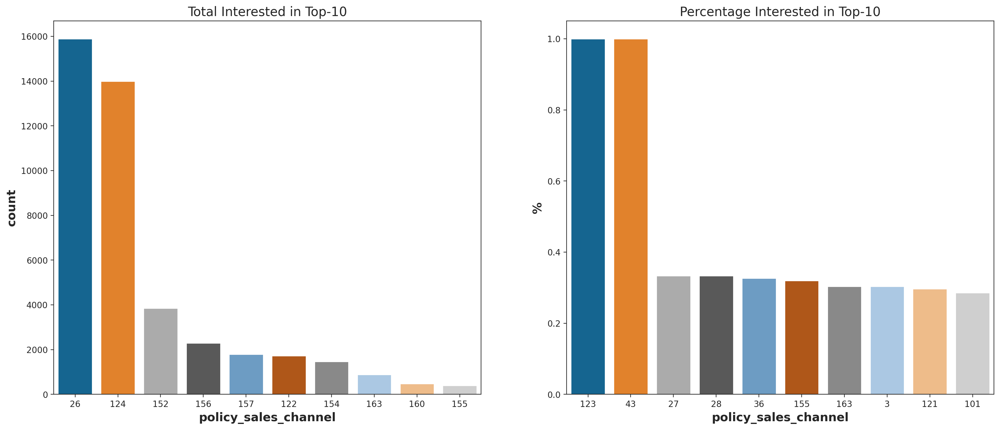

In [218]:
# top k channels
k=10

df_aux1 = df4.groupby('policy_sales_channel')['response'].sum().sort_values(ascending=False).reset_index() # total
df_aux2 = df4.groupby('policy_sales_channel')['response'].mean().sort_values(ascending=False).reset_index() # percentage
df_aux = pd.merge(df_aux1, df_aux2, on='policy_sales_channel', how='inner') # merge 
df_aux.columns = ['channel','total','percentage']

plt.figure(figsize=[20,8])

# Total Interested
plt.subplot(1,2,1)
sns.barplot(x='policy_sales_channel', y='response', data=df_aux1.head(k), order=df_aux1.policy_sales_channel.head(k));
plt.title(f'Total Interested in Top-{k}')
plt.ylabel('count')

# Percentage Interested
plt.subplot(1,2,2)
sns.barplot(x='policy_sales_channel', y='response', data=df_aux2.head(k), order=df_aux2.policy_sales_channel.head(k));
plt.title(f'Percentage Interested in Top-{k}')
plt.ylabel('%');

total_top_k = int(df_aux1.head(k).response.sum())
total_all = int(df_aux.total.sum())
percentage  = 100*total_top_k/total_all

print(f'Total de Interessados no Top-{k} channels: {total_top_k} ({np.round(percentage,2)}% do Total de Interessados)')
print(f'Total de Interessados: {total_all}')
print(f'Total de Canais sem nenhum interessado: {df_aux.total.value_counts()[0]}')
df_aux.T

#### **H9** - Apenas 10 regiões concentram mais de 80% dos clientes que estão interessados em adquirir seguro de veículos.
   - **Falsa**: Entre os 53 region_code catalogados na base, no Top-10 estão concentrados 33740 clientes interessados em adquirir o seguro de carro, o que representa cerca de 72% do total de clientes interessados. Com exceção da região de código 28, que sozinha representa quase 43% da base de interessados, nas demais regiões o percentual de interesse é mais uniforme.

Total de Interessados no Top-10 regions: 33740 (72.23% do Total de Interessados)
Total de Interessados: 46710


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52
region,28.000,8.000,41.000,46.000,29.000,3.000,11.000,15.000,30.000,35.000,33.000,36.000,18.000,47.000,50.000,45.000,39.000,48.000,6.000,37.000,7.000,14.000,38.000,13.000,24.000,12.000,21.000,23.000,2.000,4.000,10.000,9.000,19.000,43.000,32.000,20.000,27.000,31.000,26.000,17.000,0.000,40.000,5.000,49.000,16.000,34.000,1.000,25.000,22.000,42.000,44.000,52.000,51.000
total,19917.000,3257.000,2224.000,2032.000,1365.000,1181.000,1041.000,958.000,900.000,865.000,760.000,703.000,678.000,652.000,642.000,615.000,574.000,477.000,439.000,436.000,432.000,422.000,389.000,364.000,342.000,312.000,303.000,300.000,287.000,285.000,263.000,253.000,250.000,244.000,239.000,223.000,209.000,197.000,187.000,184.000,174.000,153.000,148.000,137.000,134.000,126.000,109.000,107.000,83.000,44.000,33.000,33.000,28.000
percentage,0.187,0.096,0.122,0.103,0.123,0.128,0.113,0.072,0.074,0.125,0.099,0.080,0.132,0.088,0.063,0.110,0.124,0.102,0.070,0.079,0.132,0.090,0.192,0.090,0.142,0.098,0.071,0.153,0.071,0.158,0.060,0.082,0.163,0.092,0.086,0.115,0.074,0.101,0.072,0.070,0.086,0.118,0.116,0.075,0.067,0.076,0.108,0.043,0.063,0.074,0.041,0.124,0.153


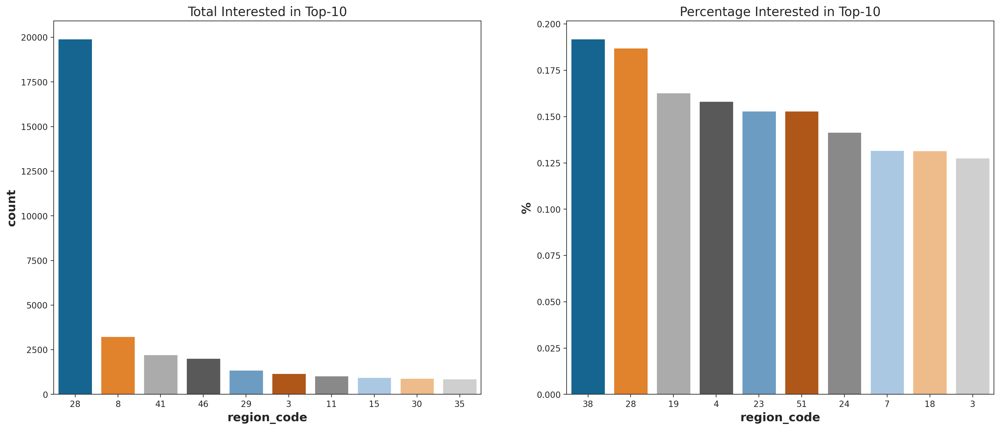

In [232]:
# top k region
k=10

df_aux1 = df4.groupby('region_code')['response'].sum().sort_values(ascending=False).reset_index() # total
df_aux2 = df4.groupby('region_code')['response'].mean().sort_values(ascending=False).reset_index() # percentage
df_aux = pd.merge(df_aux1, df_aux2, on='region_code', how='inner') # merge 
df_aux.columns = ['region','total','percentage']

plt.figure(figsize=[20,8])

# Total Interested
plt.subplot(1,2,1)
sns.barplot(x='region_code', y='response', data=df_aux1.head(k), order=df_aux1.region_code.head(k));
plt.title(f'Total Interested in Top-{k}')
plt.ylabel('count')

# Percentage Interested
plt.subplot(1,2,2)
sns.barplot(x='region_code', y='response', data=df_aux2.head(k), order=df_aux2.region_code.head(k));
plt.title(f'Percentage Interested in Top-{k}')
plt.ylabel('%');

total_top_k = int(df_aux1.head(k).response.sum())
total_all = int(df_aux.total.sum())
percentage  = 100*total_top_k/total_all

print(f'Total de Interessados no Top-{k} regions: {total_top_k} ({np.round(percentage,2)}% do Total de Interessados)')
print(f'Total de Interessados: {total_all}')
df_aux.T

### 4.2.4 Hypothesis  Summary

In [233]:
tab =[['Hipoteses', 'Conclusao', 'Relevancia'],
      ['H1', 'Verdadeira', 'Alta'],  
      ['H2', 'Falsa', 'Alta'],  
      ['H3', 'Falsa', 'Baixa'],
      ['H4', 'Verdadeira', 'Alta'],
      ['H5', 'Falsa', 'Alta'],
      ['H6', 'Falsa', 'Média'],
      ['H7', 'Falsa', 'Baixa'],
      ['H8', 'Verdadeira', 'Média'],
      ['H9', 'Falsa', 'Média']
     ]  
print( tabulate( tab, headers='firstrow' ) )

Hipoteses    Conclusao    Relevancia
-----------  -----------  ------------
H1           Verdadeira   Alta
H2           Falsa        Alta
H3           Falsa        Baixa
H4           Verdadeira   Alta
H5           Falsa        Alta
H6           Falsa        Média
H7           Falsa        Baixa
H8           Verdadeira   Média
H9           Falsa        Média


# 5.0 Data Preparation

In [30]:
#security copy
df5 = df4.copy()

In [31]:
# Split dataset Training/Validation
X = df5.drop('response', axis=1)
y = df5['response'].copy()

x_train, x_val, y_train, y_val = ms.train_test_split(X, y, test_size=0.20, random_state=42)
x_train, x_val = x_train.drop(['id'], axis=1), x_val.drop(['id'], axis=1)

df5 = pd.concat( [x_train, y_train], axis=1 )

In [32]:
print ('X-Train Dataset Number of Rows: {}'.format(df5.shape[0]))
print ('X-Train Dataset Number of Columns: {}'.format(df5.shape[1]))
print ('-----------------------------------------------')
print ('X-Validation Dataset Number of Rows: {}'.format(x_val.shape[0]))
print ('X-Validation Dataset Number of Columns: {}'.format(x_val.shape[1]+1))

X-Train Dataset Number of Rows: 304887
X-Train Dataset Number of Columns: 13
-----------------------------------------------
X-Validation Dataset Number of Rows: 76222
X-Validation Dataset Number of Columns: 13


## 5.1 Standardization

In [33]:
apremium_rs = pp.RobustScaler()
potential_rs = pp.RobustScaler()

# annual_premium
df5['annual_premium'] = apremium_rs.fit_transform( df5[['annual_premium']].values)
pkl.dump( apremium_rs, open( '../src/features/annual_premium_scaler.pkl', 'wb' ) )

# potential
df5['potential'] = potential_rs.fit_transform( df5[['potential']].values)
pkl.dump( potential_rs, open( '../src/features/potential_scaler.pkl', 'wb' ) )

## 5.2 Rescaling

In [34]:
age_mms = pp.MinMaxScaler()
vintage_mms = pp.MinMaxScaler()
historical_mms = pp.MinMaxScaler()

# age 
df5['age'] = age_mms.fit_transform( df5[['age']].values)
pkl.dump( age_mms, open( '../src/features/age_scaler.pkl', 'wb' ) )

# vintage
df5['vintage'] = vintage_mms.fit_transform( df5[['vintage']].values)
pkl.dump( vintage_mms, open( '../src/features/vintage_scaler.pkl', 'wb' ) )

# historical
df5['historical'] = historical_mms.fit_transform( df5[['historical']].values)
pkl.dump( historical_mms, open( '../src/features/historical_scaler.pkl', 'wb' ) )

## 5.3 Encoding

In [35]:
# vehicle_damage, driving_license, previously_insured - already encoded!

In [36]:
# gender - Factorize Encoding
factor_gender, unique = pd.factorize(df5['gender'], sort=True)
df5.loc[:,'gender'] = factor_gender
pkl.dump( factor_gender, open( '../src/features/gender_scaler.pkl', 'wb' ) )

# vehicle_age - Factorize Encoding
factor_vehicle_age, unique = pd.factorize(df5['vehicle_age'], sort=True)
df5.loc[:,'vehicle_age'] = factor_vehicle_age
pkl.dump( factor_vehicle_age, open( '../src/features/vehicle_age_scaler.pkl', 'wb' ) )

# region_code - Target Encoding
target_region_code = df5.groupby('region_code')['response'].mean()
df5.loc[:,'region_code'] = df5['region_code'].map(target_region_code)
pkl.dump( target_region_code, open( '../src/features/region_code_scaler.pkl', 'wb' ) )

# policy_sales_channel - Frequency Encoding
frequency_policy_sales_channel = df5.groupby('policy_sales_channel').size()/len(df5)
df5.loc[:,'policy_sales_channel'] = df5['policy_sales_channel'].map(frequency_policy_sales_channel)
pkl.dump( frequency_policy_sales_channel, open( '../src/features/policy_sales_channel_scaler.pkl', 'wb' ) )

## 5.4 Validation Preparation

In [37]:
# annual_premium - Robust Scaler
x_val.loc[:,'annual_premium'] = apremium_rs.transform( x_val[['annual_premium']].values)

# potential - Robust Scaler
x_val.loc[:,'potential'] = potential_rs.transform( x_val[['potential']].values)

# age - MinMax Scaler 
x_val.loc[:,'age'] = age_mms.transform( x_val[['age']].values)

# vintage - MinMax Scaler
x_val.loc[:,'vintage'] = vintage_mms.transform( x_val[['vintage']].values)

# historical - MinMax Scaler
x_val.loc[:,'historical'] = historical_mms.transform( x_val[['historical']].values)

# gender - Factorize Encoding
factor_gender, unique = pd.factorize(x_val.loc[:,'gender'], sort=True)
x_val.loc[:,'gender'] = factor_gender

# vehicle_age - Factorize Encoding
factor_vehicle_age, unique = pd.factorize(x_val.loc[:,'vehicle_age'], sort=True)
x_val.loc[:,'vehicle_age'] = factor_vehicle_age

# region_code - Target Encoding
x_val.loc[:,'region_code'] = x_val.loc[:,'region_code'].map(target_region_code)

# policy_sales_channel - Frequency Encoding
x_val.loc[:,'policy_sales_channel'] = x_val.loc[:,'policy_sales_channel'].map(frequency_policy_sales_channel)

# fillna
x_val = x_val.fillna(0)

## 5.5 Target Variable Resampling

In [45]:
# print('Before Resampling')
# print(y_train.value_counts())
# '''Before Resampling
# >>>0    267700
# >>>1     37187'''

# #resample
# x_train_res, y_train_res = SMOTETomek(random_state = 42).fit_resample(df5.iloc[:,:-1], y_train)

# print('After resampling')
# print(y_train_res.value_counts())
# '''After Resampling
# >>>0    262467
# >>>1    262467'''

# # save resampled data
# pkl.dump(x_train_res, open('../data/interim/x_train_res.pkl', 'wb'))
# pkl.dump(y_train_res, open('../data/interim/y_train_res.pkl', 'wb'))

In [38]:
# load resampled data
x_train_res = pkl.load( open('../data/interim/x_train_res.pkl', 'rb') )
y_train_res = pkl.load( open('../data/interim/y_train_res.pkl', 'rb') )

# 6.0 Feature Selection

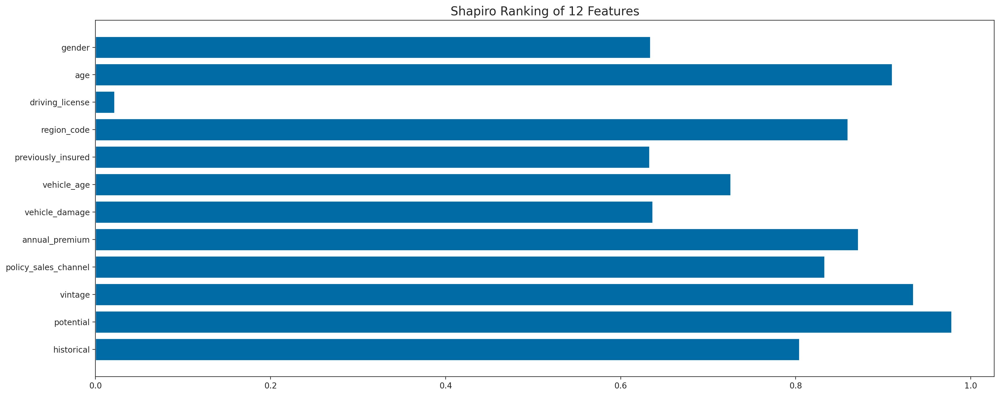

In [48]:
# before resampling 
visualizer = Rank1D(algorithm='shapiro')

visualizer.fit(df5.iloc[:,:-1], y_train)           
visualizer.transform(df5.iloc[:,:-1])
visualizer.show(); 

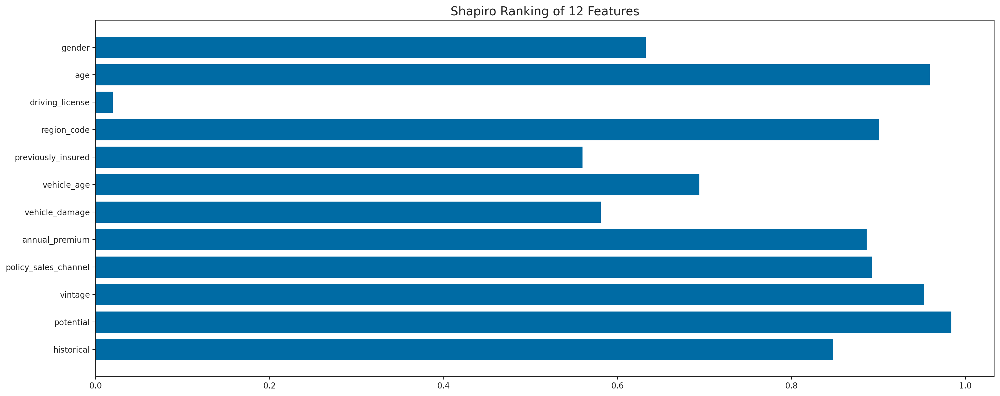

In [51]:
# after resampling
visualizer = Rank1D(algorithm='shapiro')

visualizer.fit(x_train_res, y_train_res)           
visualizer.transform(x_train_res)        
visualizer.show(); 

## 6.1 Features Importances

### 6.1.1 Features Importance (before resampling)

In [ ]:
# data preparation
x_train_n = df5.drop(['response'], axis=1)
y_train_n = y_train.values

In [64]:
# model definition
forest_model = en.ExtraTreesClassifier( n_estimators=200, random_state=42, n_jobs=-1)

# model training
forest_model.fit(x_train_n, y_train_n)

ExtraTreesClassifier(n_estimators=200, n_jobs=-1, random_state=42)

	Feature Ranking:


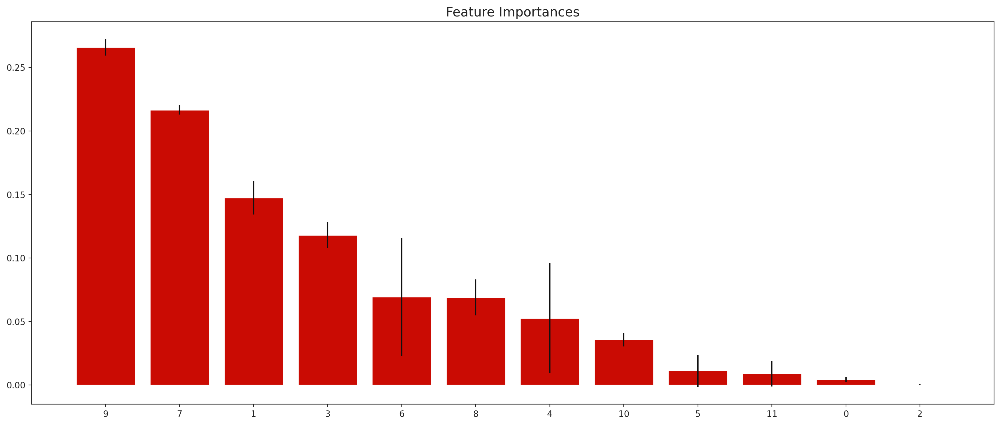

indice,9,7,1,3,6,8,4,10,5,11,0,2
Feature,vintage,annual_premium,age,region_code,vehicle_damage,policy_sales_channel,previously_insured,potential,vehicle_age,historical,gender,driving_license
Importance,0.266,0.217,0.147,0.118,0.069,0.069,0.053,0.036,0.011,0.009,0.004,0.000


In [65]:
# importances
importances = forest_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_model.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# create feature ranking
print("\tFeature Ranking:")
df = pd.DataFrame()
for i, j in zip( x_train_n, forest_model.feature_importances_ ):
    aux = pd.DataFrame( {'Feature':i, 'Importance':j}, index=[0] )
    df = pd.concat( [df, aux], axis=0 )
df = df.sort_values( 'Importance', ascending=False )
df['indice'] = indices.tolist()
df = df.set_index('indice')

# plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature Importances")
plt.bar(range(x_train_n.shape[1]), importances[indices], color='r', yerr=std[indices], align='center')
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

# print ranking
df.T

### 6.1.2 Features Importance (after resampling)

In [50]:
# data preparation
x_train_n_res = x_train_res#.drop(['id'],axis=1)
y_train_n_res = y_train_res.values

In [51]:
# model definition
forest_model = en.ExtraTreesClassifier( n_estimators=200, random_state=42, n_jobs=-1)

# model training
forest_model.fit(x_train_n_res, y_train_n_res)

ExtraTreesClassifier(n_estimators=200, n_jobs=-1, random_state=42)

	Feature Ranking:


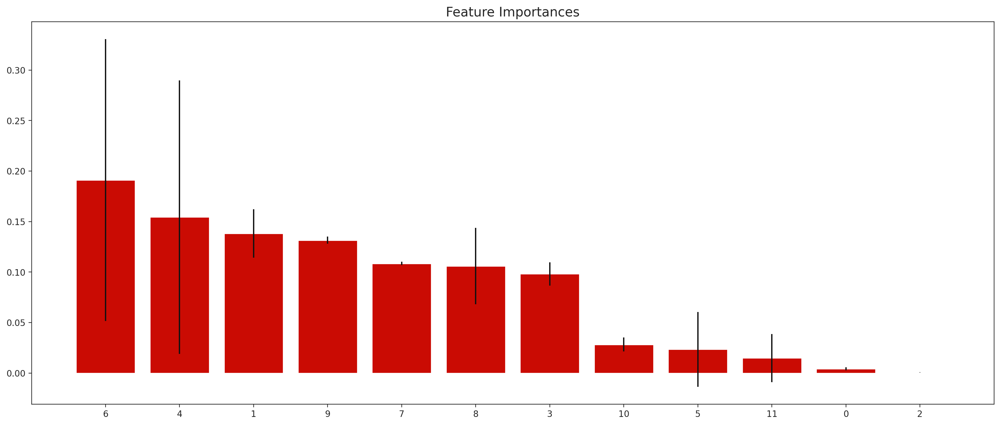

indice,6,4,1,9,7,8,3,10,5,11,0,2
Feature,vehicle_damage,previously_insured,age,vintage,annual_premium,policy_sales_channel,region_code,potential,vehicle_age,historical,gender,driving_license
Importance,0.191,0.154,0.138,0.132,0.109,0.106,0.098,0.028,0.023,0.015,0.004,0.001


In [52]:
# importances
importances = forest_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest_model.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# create feature ranking
print("\tFeature Ranking:")
df = pd.DataFrame()
for i, j in zip( x_train_n_res, forest_model.feature_importances_ ):
    aux = pd.DataFrame( {'Feature':i, 'Importance':j}, index=[0] )
    df = pd.concat( [df, aux], axis=0 )
df = df.sort_values( 'Importance', ascending=False )
df['indice'] = indices.tolist()
df = df.set_index('indice')

# plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature Importances")
plt.bar(range(x_train_n_res.shape[1]), importances[indices], color='r', yerr=std[indices], align='center')
plt.xticks(range(x_train_n_res.shape[1]), indices)
plt.xlim([-1, x_train_n_res.shape[1]])
plt.show()

# print ranking
df.T

In [65]:
df.Feature.to_list()

['vehicle_damage',
 'previously_insured',
 'age',
 'vintage',
 'annual_premium',
 'policy_sales_channel',
 'region_code',
 'potential',
 'vehicle_age',
 'historical',
 'gender',
 'driving_license']

## 6.2 Boruta Algorithm (Wrapper Method)

In [55]:
# data preparation
x_train_b_res = x_train_res.values
y_train_b_res = y_train_res.values.ravel()

# define Classifier
rf = RandomForestClassifier( n_jobs = -1 )

# fit Boruta
boruta = BorutaPy( rf, n_estimators = 'auto', verbose = 2, random_state = 42 ).fit( x_train_b_res, y_train_b_res )

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	7
Tentative: 	1
Rejected: 	4
Iteration: 	9 / 100
Confirmed: 	7
Tentative: 	1
Rejected: 	4
Iteration: 	10 / 100
Confirmed: 	7
Tentative: 	1
Rejected: 	4
Iteration: 	11 / 100
Confirmed: 	7
Tentative: 	1
Rejected: 	4
Iteration: 	12 / 100
Confirmed: 	7
Tentative: 	0
Rejected: 	5


BorutaPy finished running.

Iteration: 	13 / 100
Confirmed: 	7
Tentative: 	0
Rejected: 	5


In [61]:
# cols evaluated by Boruta
cols_evaluated = boruta.support_.tolist()

# best features
cols_selected_boruta = x_train.iloc[:, cols_evaluated].columns.to_list()

# not selected boruta
cols_not_selected_boruta = list( np.setdiff1d( x_train.columns, cols_selected_boruta ) )

In [62]:
cols_selected_boruta

['age',
 'region_code',
 'previously_insured',
 'vehicle_damage',
 'annual_premium',
 'policy_sales_channel',
 'vintage']

In [63]:
cols_not_selected_boruta

['driving_license', 'gender', 'historical', 'potential', 'vehicle_age']

# 7.0 Machine Learning Modeling

In [39]:
seed = 42
k = 20000

In [40]:
# selected features by tree importances
cols_selected_fi_after_res = ['vehicle_damage','previously_insured','age','vintage','annual_premium',
                              'policy_sales_channel','region_code','potential','vehicle_age']

# selected features by Boruta
cols_selected_boruta = ['age','region_code','previously_insured','vehicle_damage',
                        'annual_premium','policy_sales_channel','vintage']

# choose selection method
cols_selected = cols_selected_boruta

In [41]:
# before resampling
x_train = df5[cols_selected]
x_validation = x_val[cols_selected]
y_validation = y_val.copy()

In [42]:
# after resampling
x_train = x_train_res[cols_selected]
y_train = y_train_res.copy()
x_validation = x_val[cols_selected]
y_validation = y_val.copy()

In [54]:
# copy data
df7 = x_validation.copy()
df7['response'] = y_validation.copy()

## 7.1 KNN (K-Nearest Neighbors)

In [45]:
# model definition
knn_model = nb.KNeighborsClassifier(n_neighbors=10)

# model training
knn_model.fit(x_train, y_train)

# model prediction - generalization
yhat_knn = knn_model.predict_proba(x_validation)
yhat1_knn = knn_model.predict(x_validation)

In [46]:
# print scores
print_predict_scores(y_validation,yhat1_knn)

Precision Score: 28.95%
Recall Score: 71.5%
Accuracy Score: 74.52%
Balanced Accuracy Score: 73.22%


In [50]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_knn, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_knn, k)

print(f'For KNN model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For KNN model:
Precision at K(20000) = 29.55%
Recall at K(20000) = 62.06%



In [55]:
# # save model, yhat_model (after resample)
# pkl.dump(knn_model, open('../src/models/knn_model_res.pkl', 'wb'))
# pkl.dump(yhat_knn, open('../src/models/yhat_knn_res.pkl', 'wb'))
# pkl.dump(yhat1_knn, open('../src/models/yhat1_knn_res.pkl', 'wb'))

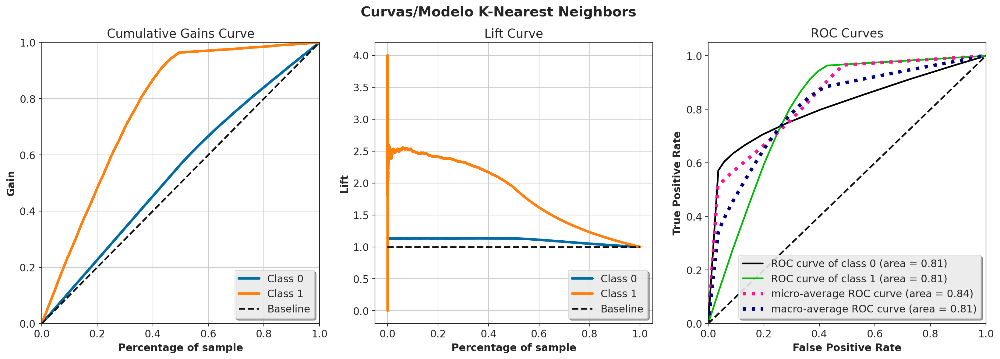

In [56]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_knn, 'K-Nearest Neighbors')

## 7.2 Logistic Regression

In [58]:
# model definition
lr_model = lm.LogisticRegression(random_state=seed)

# model training
lr_model.fit(x_train, y_train)

# model prediction - generalization
yhat_lr = lr_model.predict_proba(x_validation)
yhat1_lr = lr_model.predict(x_validation)

In [59]:
# print scores
print_predict_scores(y_validation,yhat1_lr)

Precision Score: 25.490000000000002%
Recall Score: 97.68%
Accuracy Score: 64.05%
Balanced Accuracy Score: 78.46%


In [61]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_lr, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_lr, k)

print(f'For Logistic Regression model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Logistic Regression model:
Precision at K(20000) = 28.86%
Recall at K(20000) = 60.61%



In [62]:
# # save model, yhat_model (after resample)
# pkl.dump(lr_model, open('../src/models/lr_model_res.pkl', 'wb'))
# pkl.dump(yhat_lr, open('../src/models/yhat_lr_res.pkl', 'wb'))
# pkl.dump(yhat1_lr, open('../src/models/yhat1_lr_res.pkl', 'wb'))

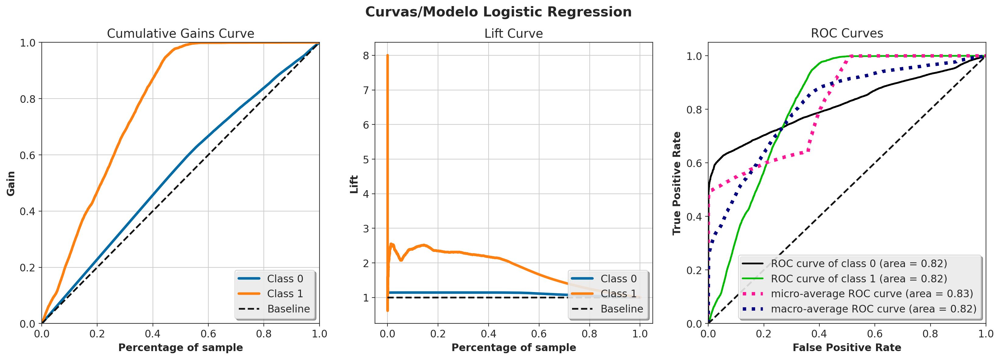

In [63]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_lr, 'Logistic Regression')

## 7.3 Extra Trees

In [80]:
# model definition
et_model = en.ExtraTreesClassifier(n_jobs=-1,                          
                                   n_estimators = 100,
                                   random_state=seed,
                                   max_depth = 5)

# model training
et_model.fit(x_train, y_train)

# model prediction - generalization
yhat_et = et_model.predict_proba(x_validation)
yhat1_et = et_model.predict(x_validation)

In [81]:
# print scores
print_predict_scores(y_validation,yhat1_et)

Precision Score: 25.569999999999997%
Recall Score: 97.6%
Accuracy Score: 64.2%
Balanced Accuracy Score: 78.52%


In [82]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_et, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_et, k)

print(f'For Extra Trees model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Extra Trees model:
Precision at K(20000) = 32.44%
Recall at K(20000) = 68.12%



In [132]:
# save model, yhat_model (after resample)
pkl.dump(et_model, open('../src/models/et_model_res.pkl', 'wb'))
pkl.dump(yhat_et, open('../src/models/yhat_et_res.pkl', 'wb'))
pkl.dump(yhat1_et, open('../src/models/yhat1_et_res.pkl', 'wb'))

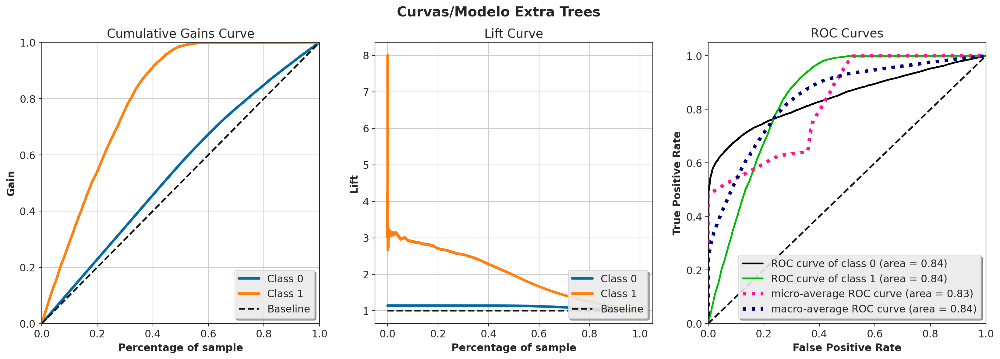

In [131]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_et, 'Extra Trees')

## 7.4 Random Forest

In [241]:
# model definition
rf_model = en.RandomForestClassifier( n_jobs=-1,                          
                                   n_estimators = 100,
                                   random_state=seed,
                                   max_depth = 5 )

# model training
rf_model.fit(x_train, y_train)

# model prediction - generalization
yhat_rf = rf_model.predict_proba(x_validation)
yhat1_rf = rf_model.predict(x_validation)

In [75]:
# print scores
print_predict_scores(y_validation,yhat1_rf)

Precision Score: 27.88%
Recall Score: 93.64%
Accuracy Score: 68.95%
Balanced Accuracy Score: 79.53%


In [76]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_rf, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_rf, k)

print(f'For Random Forest model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Random Forest model:
Precision at K(20000) = 32.34%
Recall at K(20000) = 67.92%



In [77]:
# # save model, yhat_model (after resample)
# pkl.dump(rf_model, open('../src/models/rf_model_res.pkl', 'wb'))
# pkl.dump(yhat_rf, open('../src/models/yhat_rf_res.pkl', 'wb'))
# pkl.dump(yhat1_rf, open('../src/models/yhat1_rf_res.pkl', 'wb'))

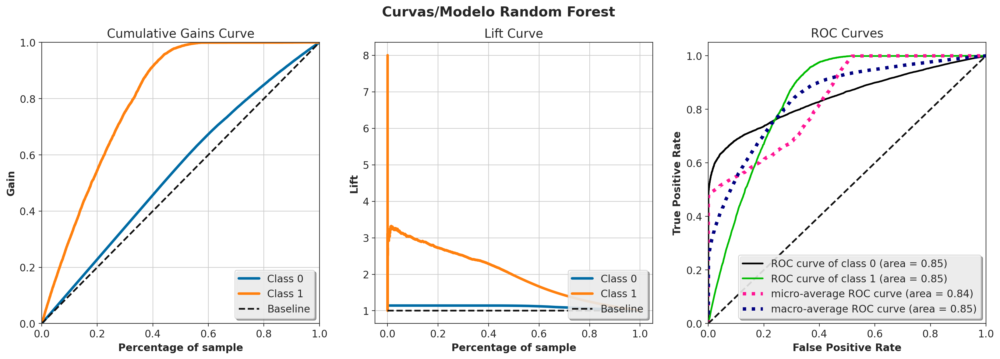

In [78]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_rf, 'Random Forest')

## 7.5 Naive Bayes

In [64]:
# model definition
nb_model = GaussianNB()

# model training
nb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_nb = nb_model.predict_proba(x_validation)
yhat1_nb = nb_model.predict(x_validation)

In [65]:
# print scores
print_predict_scores(y_validation,yhat1_nb)

Precision Score: 25.490000000000002%
Recall Score: 97.68%
Accuracy Score: 64.05%
Balanced Accuracy Score: 78.46%


In [66]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_nb, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_nb, k)

print(f'For Naive Bayes model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Naive Bayes model:
Precision at K(20000) = 30.20%
Recall at K(20000) = 63.41%



In [67]:
# # save model, yhat_model (after resample)
# pkl.dump(nb_model, open('../src/models/nb_model_res.pkl', 'wb'))
# pkl.dump(yhat_nb, open('../src/models/yhat_nb_res.pkl', 'wb'))
# pkl.dump(yhat1_nb, open('../src/models/yhat1_nb_res.pkl', 'wb'))

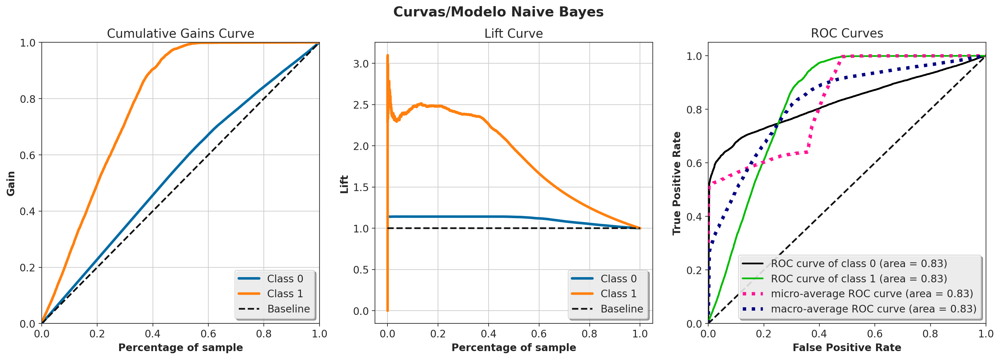

In [68]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_nb, 'Naive Bayes')

## 7.6 XGBoost

In [69]:
# model definition
xgb_model = XGBClassifier(n_estimators = 100,
                          random_state=seed,
                          eta = 0.01, 
                          max_depth = 5, 
                          subsample = 0.7,
                          use_label_encoder = False,
                          eval_metric = 'error',
                          colsample_bytree = 0.9)

# model training
xgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_xgb = xgb_model.predict_proba(x_validation)
yhat1_xgb = xgb_model.predict(x_validation)

In [70]:
# print scores
print_predict_scores(y_validation,yhat1_xgb)

Precision Score: 28.38%
Recall Score: 91.96%
Accuracy Score: 70.0%
Balanced Accuracy Score: 79.41%


In [71]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_xgb, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_xgb, k)

print(f'For XGBoost model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For XGBoost model:
Precision at K(20000) = 32.44%
Recall at K(20000) = 68.12%



In [79]:
# # save model, yhat_model
# pkl.dump(xgb_model, open('../src/models/xgb_model_res.pkl', 'wb'))
# pkl.dump(yhat_xgb, open('../src/models/yhat_xgb_res.pkl', 'wb'))
# pkl.dump(yhat1_xgb, open('../src/models/yhat1_xgb_res.pkl', 'wb'))

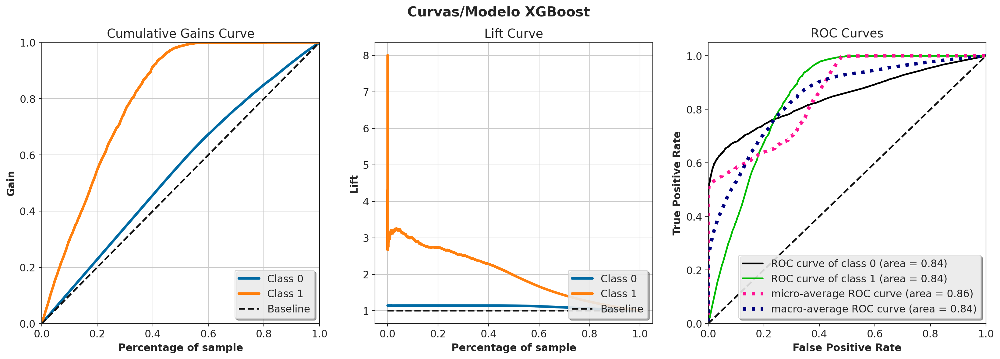

In [73]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_xgb, 'XGBoost')

## 7.7 Light Gradient Boosted Machine

In [83]:
# model definition
lgbm_model = LGBMClassifier( random_state=seed, n_jobs=-1 )

# model training
lgbm_model.fit(x_train, y_train)

# model prediction - generalization
yhat_lgbm = lgbm_model.predict_proba(x_validation)
yhat1_lgbm = lgbm_model.predict(x_validation)

In [84]:
# print scores
print_predict_scores(y_validation,yhat1_lgbm)

Precision Score: 38.32%
Recall Score: 34.67%
Accuracy Score: 84.86%
Balanced Accuracy Score: 63.349999999999994%


In [85]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_lgbm, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_lgbm, k)

print(f'For Light Gradient Boosted Machine model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Light Gradient Boosted Machine model:
Precision at K(20000) = 33.20%
Recall at K(20000) = 69.72%



In [86]:
# # save model, yhat_model
# pkl.dump(lgbm_model, open('../src/models/lgbm_model_res.pkl', 'wb'))
# pkl.dump(yhat_lgbm, open('../src/models/yhat_lgbm_res.pkl', 'wb'))
# pkl.dump(yhat1_lgbm, open('../src/models/yhat1_lgbm_res.pkl', 'wb'))

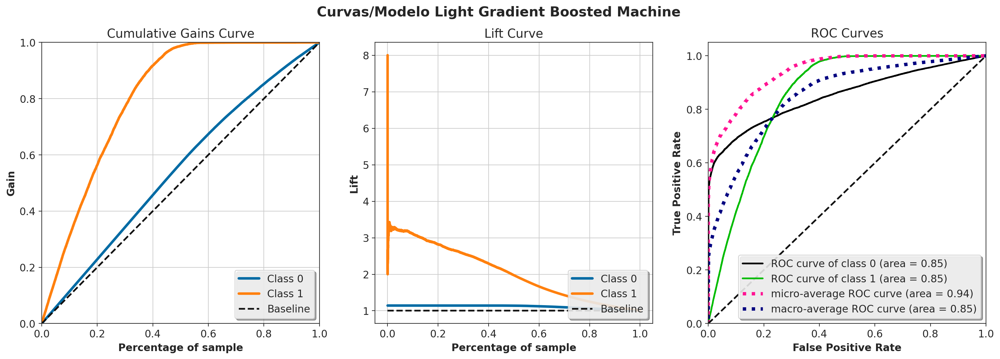

In [87]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_lgbm, 'Light Gradient Boosted Machine')

## 7.8 Histogram-Based Gradient Boosting

In [88]:
# model definition
hgb_model = en.HistGradientBoostingClassifier( random_state=seed )

# model training
hgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_hgb = hgb_model.predict_proba(x_validation)
yhat1_hgb = hgb_model.predict(x_validation)

In [89]:
# print scores
print_predict_scores(y_validation,yhat1_hgb)

Precision Score: 34.599999999999994%
Recall Score: 50.519999999999996%
Accuracy Score: 81.89%
Balanced Accuracy Score: 68.44%


In [90]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_hgb, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_hgb, k)

print(f'For Histogram-Based Gradient Boosting model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Histogram-Based Gradient Boosting model:
Precision at K(20000) = 32.36%
Recall at K(20000) = 67.95%



In [91]:
# # save model, yhat_model
# pkl.dump(hgb_model, open('../src/models/hgb_model_res.pkl', 'wb'))
# pkl.dump(yhat_hgb, open('../src/models/yhat_hgb_res.pkl', 'wb'))
# pkl.dump(yhat1_hgb, open('../src/models/yhat1_hgb_res.pkl', 'wb'))

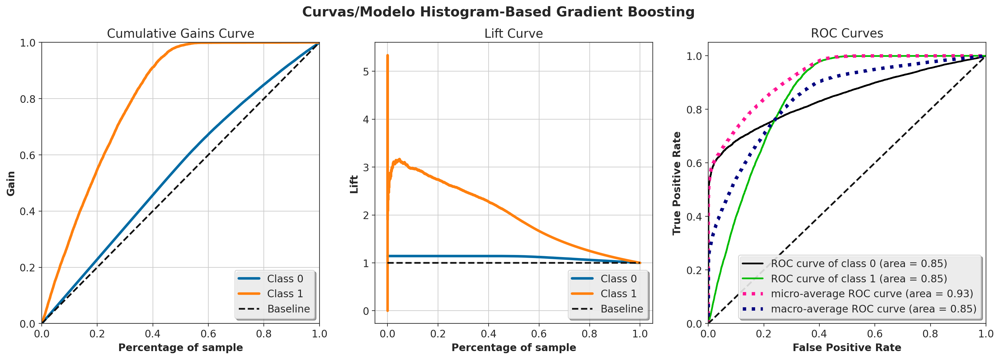

In [149]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_hgb, 'Histogram-Based Gradient Boosting')

## 7.9 Gradient Boosting Classifier

In [92]:
# model definition
gbc_model = en.GradientBoostingClassifier( random_state=seed )

# model training
gbc_model.fit(x_train, y_train)

# model prediction - generalization
yhat_gbc = gbc_model.predict_proba(x_validation)
yhat1_gbc = gbc_model.predict(x_validation)

In [93]:
# print scores
print_predict_scores(y_validation,yhat1_gbc)

Precision Score: 30.34%
Recall Score: 80.89%
Accuracy Score: 74.41%
Balanced Accuracy Score: 77.18%


In [94]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df7, yhat_gbc, k)

# compute recall at k
recall = recall_at_k_model(df7, yhat_gbc, k)

print(f'For Gradient Boosting Classifier model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Gradient Boosting Classifier model:
Precision at K(20000) = 32.19%
Recall at K(20000) = 67.60%



In [95]:
# # save model, yhat_model
# pkl.dump(gbc_model, open('../src/models/gbc_model_res.pkl', 'wb'))
# pkl.dump(yhat_gbc, open('../src/models/yhat_gbc_res.pkl', 'wb'))
# pkl.dump(yhat1_gbc, open('../src/models/yhat1_gbc_res.pkl', 'wb'))

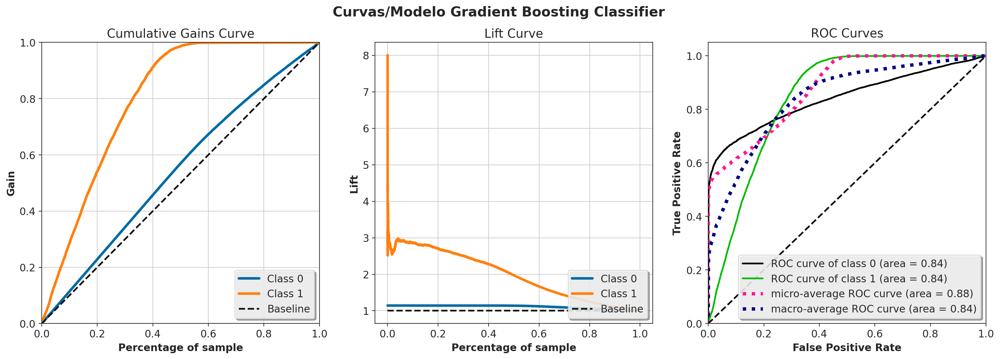

In [96]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_gbc, 'Gradient Boosting Classifier')

## 7.10 Calibrated Classifier

In [181]:
# model definition
base_model = [et_model, rf_model, xgb_model, lgbm_model, hgb_model]
clb_models = []
yhat_clb_list = [] 
yhat1_clb_list = []

for i, m in enumerate(base_model):
    # select base model
    clb_model = CalibratedClassifierCV(base_estimator=base_model[i], cv=5)

    # model training
    clb_model.fit(x_train, y_train)

    # model prediction - generalization
    yhat_clb = clb_model.predict_proba(x_validation)
    yhat1_clb = clb_model.predict(x_validation)
    
    # populate lists
    clb_models.append(clb_model)
    yhat_clb_list.append(yhat_clb)
    yhat1_clb_list.append(yhat1_clb)

In [182]:
# print scores
for i, y in enumerate(yhat1_list):
    name = re.search('(\w+)', str(clb_models[i].base_estimator)).group(0)
    print(f'Base Model={name}:')
    print_predict_scores(y_validation,yhat1_clb_list[i])
    print('***************************************')

Base Model=ExtraTreesClassifier:
Precision Score: 28.21%
Recall Score: 91.97%
Accuracy Score: 69.76%
Balanced Accuracy Score: 79.28%
***************************************
Base Model=RandomForestClassifier:
Precision Score: 28.999999999999996%
Recall Score: 90.28%
Accuracy Score: 71.17999999999999%
Balanced Accuracy Score: 79.36%
***************************************
Base Model=XGBClassifier:
Precision Score: 30.130000000000003%
Recall Score: 82.86%
Accuracy Score: 73.86%
Balanced Accuracy Score: 77.72%
***************************************
Base Model=LGBMClassifier:
Precision Score: 39.86%
Recall Score: 23.27%
Accuracy Score: 86.03%
Balanced Accuracy Score: 59.13%
***************************************
Base Model=HistGradientBoostingClassifier:
Precision Score: 36.74%
Recall Score: 38.96%
Accuracy Score: 83.99%
Balanced Accuracy Score: 64.69%
***************************************


In [183]:
# Metrics at k
for i, y in enumerate(yhat_clb_list):
    # compute precision at k
    precision = precision_at_k_model(df7, yhat_clb_list[i], k)

    # compute recall at k
    recall = recall_at_k_model(df7, yhat_clb_list[i], k)
    
    name = re.search('(\w+)', str(clb_models[i].base_estimator)).group(0)
    print(f'For {name} model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For ExtraTreesClassifier model:
Precision at K(20000) = 32.31%
Recall at K(20000) = 67.87%

For RandomForestClassifier model:
Precision at K(20000) = 32.29%
Recall at K(20000) = 67.80%

For XGBClassifier model:
Precision at K(20000) = 32.34%
Recall at K(20000) = 67.91%

For LGBMClassifier model:
Precision at K(20000) = 32.48%
Recall at K(20000) = 68.20%

For HistGradientBoostingClassifier model:
Precision at K(20000) = 32.34%
Recall at K(20000) = 67.93%



In [184]:
# # save model, yhat_model
# i=3
# pkl.dump(clb_models[i], open('../src/models/clb_model_res.pkl', 'wb'))
# pkl.dump(yhat_clb_list[i], open('../src/models/yhat_clb_res.pkl', 'wb'))
# pkl.dump(yhat1_clb_list[i], open('../src/models/yhat1_clb_res.pkl', 'wb'))

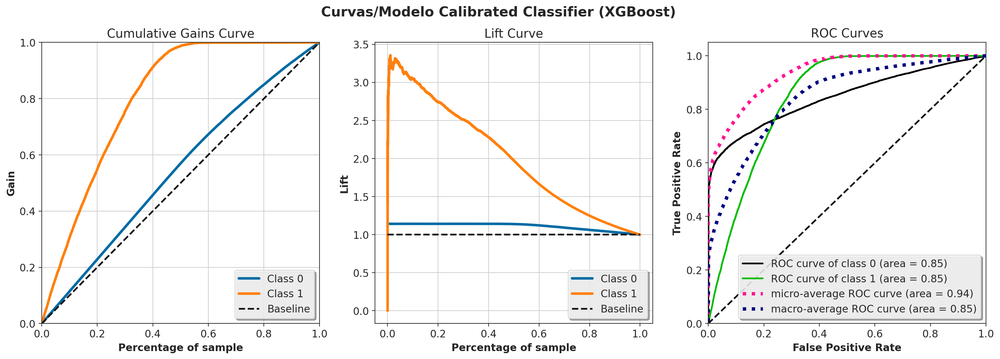

In [172]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_clb_list[3], 'Calibrated Classifier (XGBoost)')

## 7.11 Bagging Classifier

In [173]:
# model definition
base_model = [et_model, rf_model, xgb_model, lgbm_model, hgb_model]
bag_models = []
yhat_bag_list = [] 
yhat1_bag_list = []

for i, m in enumerate(base_model):
    # select base model
    bag_model = en.BaggingClassifier( base_estimator=base_model[i], random_state=seed )

    # model training
    bag_model.fit(x_train, y_train)

    # model prediction - generalization
    yhat_bag = bag_model.predict_proba(x_validation)
    yhat1_bag = bag_model.predict(x_validation)
    
    # populate lists
    bag_models.append(bag_model)
    yhat_bag_list.append(yhat_bag)
    yhat1_bag_list.append(yhat1_bag)

In [174]:
# print scores
for i, y in enumerate(yhat1_list):
    name = re.search('(\w+)', str(bag_models[i].base_estimator)).group(0)
    print(f'Base Model={name}:')
    print_predict_scores(y_validation,yhat1_bag_list[i])
    print('***************************************')

Base Model=ExtraTreesClassifier:
Precision Score: 25.540000000000003%
Recall Score: 97.63%
Accuracy Score: 64.14%
Balanced Accuracy Score: 78.49000000000001%
***************************************
Base Model=RandomForestClassifier:
Precision Score: 27.76%
Recall Score: 93.93%
Accuracy Score: 68.71000000000001%
Balanced Accuracy Score: 79.52%
***************************************
Base Model=XGBClassifier:
Precision Score: 28.32%
Recall Score: 92.07%
Accuracy Score: 69.89%
Balanced Accuracy Score: 79.4%
***************************************
Base Model=LGBMClassifier:
Precision Score: 38.24%
Recall Score: 35.36%
Accuracy Score: 84.78999999999999%
Balanced Accuracy Score: 63.6%
***************************************
Base Model=HistGradientBoostingClassifier:
Precision Score: 34.949999999999996%
Recall Score: 50.28%
Accuracy Score: 82.09%
Balanced Accuracy Score: 68.46%
***************************************


In [178]:
# Metrics at k
for i, y in enumerate(yhat_bag_list):
    # compute precision at k
    precision = precision_at_k_model(df7, yhat_bag_list[i], k)

    # compute recall at k
    recall = recall_at_k_model(df7, yhat_bag_list[i], k)
    
    name = re.search('(\w+)', str(bag_models[i].base_estimator)).group(0)
    print(f'For {name} base model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For ExtraTreesClassifier base model:
Precision at K(20000) = 32.48%
Recall at K(20000) = 68.21%

For RandomForestClassifier base model:
Precision at K(20000) = 32.15%
Recall at K(20000) = 67.51%

For XGBClassifier base model:
Precision at K(20000) = 32.33%
Recall at K(20000) = 67.90%

For LGBMClassifier base model:
Precision at K(20000) = 33.20%
Recall at K(20000) = 69.73%

For HistGradientBoostingClassifier base model:
Precision at K(20000) = 32.49%
Recall at K(20000) = 68.23%



In [176]:
# # save model, yhat_model
# i = 3
# pkl.dump(bag_models[i], open('../src/models/bag_model_res.pkl', 'wb'))
# pkl.dump(yhat_bag_list[i], open('../src/models/yhat_bag_res.pkl', 'wb'))
# pkl.dump(yhat1_bag_list[i], open('../src/models/yhat1_bag_res.pkl', 'wb'))

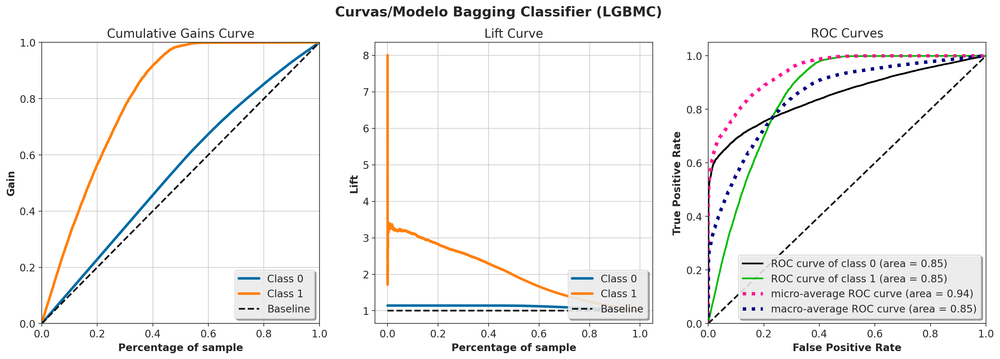

In [177]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_bag_list[3], 'Bagging Classifier (LGBMC)')

# 8.0 Models Performance

## Cross Validation (Balanced Dataset)

In [129]:
k=20000

In [190]:
# # compute cross validation metrics for all models
# knn_cv_results = cross_validation(knn_model, x_train, y_train, 5, df5, k=k)
# lr_cv_results = cross_validation(lr_model, x_train, y_train, 5, df5, k=k)
# et_cv_results = cross_validation(et_model, x_train, y_train, 5, df5, k=k)
# rf_cv_results = cross_validation(rf_model, x_train, y_train, 5, df5, k=k)
# nb_cv_results = cross_validation(nb_model, x_train, y_train, 5, df5, k=k)
# xgb_cv_results = cross_validation(xgb_model, x_train, y_train, 5, df5, k=k)
# lgbm_cv_results = cross_validation(lgbm_model, x_train, y_train, 5, df5, k=k)
# hgb_cv_results = cross_validation(hgb_model, x_train, y_train, 5, df5, k=k)
# gbc_cv_results = cross_validation(gbc_model, x_train, y_train, 5, df5, k=k)
# clb_cv_results = cross_validation(clb_models[3], x_train, y_train, 5, df5, k=k)
# bag_cv_results = cross_validation(bag_models[3], x_train, y_train, 5, df5, k=k)

In [187]:
# # save cv results for all models
# pkl.dump(knn_cv_results, open('../src/models/knn_cv_results_res.pkl', 'wb'))
# pkl.dump(lr_cv_results, open('../src/models/lr_cv_results_res.pkl', 'wb'))
# pkl.dump(et_cv_results, open('../src/models/et_cv_results_res.pkl', 'wb'))
# pkl.dump(rf_cv_results, open('../src/models/rf_cv_results_res.pkl', 'wb'))
# pkl.dump(nb_cv_results, open('../src/models/nb_cv_results_res.pkl', 'wb'))
# pkl.dump(xgb_cv_results, open('../src/models/xgb_cv_results_res.pkl', 'wb'))
# pkl.dump(lgbm_cv_results, open('../src/models/lgbm_cv_results_res.pkl', 'wb'))
# pkl.dump(hgb_cv_results, open('../src/models/hgb_cv_results_res.pkl', 'wb'))
# pkl.dump(gbc_cv_results, open('../src/models/gbc_cv_results_res.pkl', 'wb'))
# pkl.dump(clb_cv_results, open('../src/models/clb_cv_results_res.pkl', 'wb'))
# pkl.dump(bag_cv_results, open('../src/models/bag_cv_results_res.pkl', 'wb'))

In [44]:
# load cv results for all models
# knn_cv_results = pkl.load( open('../src/models/knn_cv_results_res.pkl', 'rb') )
# lr_cv_results = pkl.load( open('../src/models/lr_cv_results_res.pkl', 'rb') ) 
# et_cv_results = pkl.load( open('../src/models/et_cv_results_res.pkl', 'rb') ) 
# rf_cv_results = pkl.load( open('../src/models/rf_cv_results_res.pkl', 'rb') ) 
# nb_cv_results = pkl.load( open('../src/models/nb_cv_results_res.pkl', 'rb') ) 
# xgb_cv_results = pkl.load( open('../src/models/xgb_cv_results_res.pkl', 'rb') )
# lgbm_cv_results = pkl.load( open('../src/models/lgbm_cv_results_res.pkl', 'rb') )
# hgb_cv_results = pkl.load( open('../src/models/hgb_cv_results_res.pkl', 'rb') )
# gbc_cv_results = pkl.load( open('../src/models/gbc_cv_results_res.pkl', 'rb') )
# clb_cv_results = pkl.load( open('../src/models/clb_cv_results_res.pkl', 'rb') )
# bag_cv_results = pkl.load( open('../src/models/bag_cv_results_res.pkl', 'rb') )

In [191]:
# concat all results
# all_cv_results = pd.concat([knn_cv_results, lr_cv_results, et_cv_results, rf_cv_results, nb_cv_results, xgb_cv_results,
#                            lgbm_cv_results, hgb_cv_results, gbc_cv_results, clb_cv_results, bag_cv_results],axis=0)
# pkl.dump(all_cv_results, open('../src/models/all_cv_results_res.pkl', 'wb'))

In [193]:
cv_results = pkl.load(open('../src/models/all_cv_results_res.pkl', 'rb'))
cv_results[['Model Name', 'Recall Mean', 'Recall STD','Balanced Accuracy Mean',
       'Precision@K Mean', 'Precision@K STD', 'Recall@K Mean', 'Recall@K STD']]

,Model Name,Recall Mean,Recall STD,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,KNeighborsClassifier,0.936,0.002,0.844,0.913,0.004,0.348,0.002
0,LogisticRegression,0.979,0.001,0.790,0.752,0.002,0.287,0.001
0,ExtraTreesClassifier,0.979,0.001,0.790,0.821,0.003,0.313,0.001
0,RandomForestClassifier,0.959,0.001,0.809,0.883,0.005,0.337,0.002
0,GaussianNB,0.979,0.001,0.790,0.764,0.001,0.291,0.001
0,XGBClassifier,0.968,0.001,0.821,0.959,0.006,0.365,0.002
0,LGBMClassifier,0.887,0.002,0.905,1.000,0.000,0.381,0.000
0,HistGradientBoostingClassifier,0.884,0.003,0.879,1.000,0.000,0.381,0.000
0,GradientBoostingClassifier,0.946,0.001,0.842,0.994,0.001,0.379,0.001
0,CalibratedClassifierCV,0.865,0.002,0.908,1.000,0.000,0.381,0.000


# 9.0 Hyperparameter Fine Tuning with Optuna
https://optuna.readthedocs.io/en/stable/tutorial/20_recipes/008_specify_params.html

In [198]:
# copy data
df9 = x_validation.copy()
df9['response'] = y_validation.copy()

# metrics at k
k=20000

## Choosen Model 1: LGBMClassifier
https://github.com/microsoft/LightGBM/blob/master/docs/Parameters.rst

In [214]:
# Função Objetivo do Estudo: 
# Maximizar a métrica Precision at K Score (minimizar os Falsos Positivos: descartar os desinteressados)
# Maximizar a métrica Recall at K Score (minimizar os Falsos Negativos: interessados que foram descartados)

def objective(trial):
    
    # trial parameters
    num_leaves = trial.suggest_int("num_leaves", 10, 100)
    max_depth = trial.suggest_int("max_depth", 5, 15)
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    min_split_gain = trial.suggest_float("min_split_gain", 0, 0.5)
    min_child_weight = trial.suggest_float("min_child_weight", 1e-3, 1)
    min_child_samples = trial.suggest_int("min_child_samples", 10, 50)
    random_state = 42
    n_jobs = -1
    importance_type = trial.suggest_categorical("importance_type", ("split", "gain"))
    
    # model definition
    lgbm_classifier = LGBMClassifier(num_leaves = num_leaves,
                                    max_depth = max_depth,
                                    n_estimators = n_estimators,
                                    min_split_gain = min_split_gain,
                                    min_child_weight = min_child_weight,
                                    min_child_samples = min_child_samples,
                                    random_state = random_state,
                                    n_jobs = n_jobs,
                                    importance_type = importance_type )
    
    # model training
    lgbm_classifier.fit(x_train, y_train)

    # model prediction - generalization
    yhat_lgbm = lgbm_classifier.predict_proba(x_validation)
    
    # precision_at_k
    pk_score = precision_at_k_model(df9, yhat_lgbm, k)
    
    # recall_at_k
    rk_score = recall_at_k_model(df9, yhat_lgbm, k)
    
    return pk_score, rk_score

In [253]:
# Criação do objeto de estudo
study = optuna.create_study(directions=["maximize", "maximize"], pruner=optuna.pruners.MedianPruner())

# otimização da função objective
study.optimize(objective, n_trials = 50)

# seleção da tentativa de melhor resultado
trial = study.best_trials

In [278]:
optuna.visualization.plot_param_importances(study, target=lambda t: t.values[1], target_name="rk_score")

In [277]:
optuna.visualization.plot_pareto_front(study, target_names=["pk_score", "rk_score"])

Trial 34 finished with values: [0.3357, 0.7050299275438412] and parameters: {'num_leaves': 76, 'max_depth': 13, 'n_estimators': 128, 'min_split_gain': 0.3462618994731453, 'min_child_weight': 0.4006493984166301, 'min_child_samples': 37, 'importance_type': 'gain'}. 

In [194]:
# Fit Model with Best hyperparameters
# model definition
lgbm_model = LGBMClassifier(num_leaves = 76,#31,
                            max_depth = 13,#5,
                            n_estimators = 128,#50,
                            min_split_gain = 0.3462,#0.2448,
                            min_child_weight = 0.4006,#0.9320,
                            min_child_samples = 37,#22,
                            random_state = 42,
                            n_jobs = -1,
                            importance_type = 'gain')

# model training
lgbm_model.fit(x_train, y_train)

# model prediction - generalization
yhat_lgbm = lgbm_model.predict_proba(x_validation)
yhat1_lgbm = lgbm_model.predict(x_validation)

In [195]:
# print scores
print_predict_scores(y_validation,yhat1_lgbm)

Precision Score: 39.56%
Recall Score: 23.77%
Accuracy Score: 85.94000000000001%
Balanced Accuracy Score: 59.29%


In [199]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df9, yhat_lgbm, k)

# compute recall at k
recall = recall_at_k_model(df9, yhat_lgbm, k)

print(f'For Light Gradient Boosted Machine model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Light Gradient Boosted Machine model:
Precision at K(20000) = 33.57%
Recall at K(20000) = 70.50%



In [200]:
# cross validation results
lgbm_tunned_result_cv = cross_validation(lgbm_model, x_train, y_train, 5, df5, k=20000)
pkl.dump(lgbm_tunned_result_cv, open('../models/lgbm_tunned_result_cv.pkl','wb'))
lgbm_tunned_result_cv

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,LGBMClassifier,0.946,0.002,0.875,0.002,0.912,0.912,1.000,0.000,0.381,0.000


In [201]:
# # save model, yhat_model
# pkl.dump(lgbm_model, open('../models/lgbm_model.pkl', 'wb'))
# pkl.dump(yhat_lgbm, open('../models/yhat_lgbm.pkl', 'wb'))
# pkl.dump(yhat1_lgbm, open('../models/yhat1_lgbm.pkl', 'wb'))

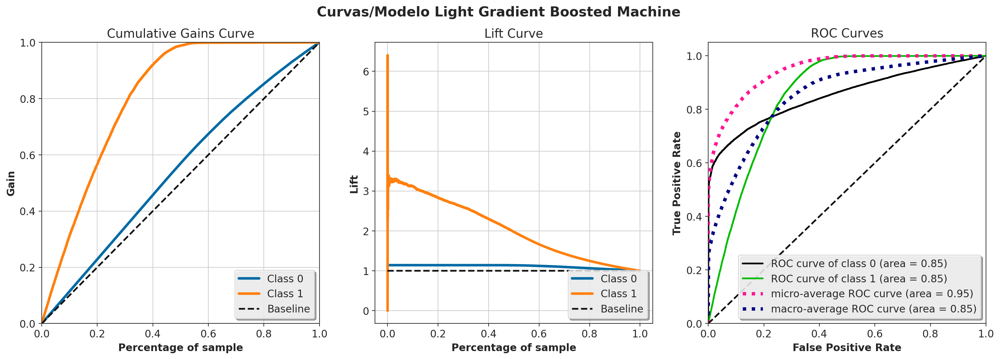

In [202]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_lgbm, 'Light Gradient Boosted Machine')

## Choosen Model 2: HistogramGB
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.HistGradientBoostingClassifier.html

In [288]:
# Função Objetivo do Estudo: 
# Maximizar a métrica Precision at K Score (minimizar os Falsos Positivos: descartar os desinteressados)
# Maximizar a métrica Recall at K Score (minimizar os Falsos Negativos: interessados que foram descartados)

# Define the objective function.
def objective(trial):
    
    # trial parameters  
    learning_rate = trial.suggest_float("learning_rate", 0, 1)
    max_iter = trial.suggest_int("max_iter", 50, 200)
    max_leaf_nodes = trial.suggest_int("max_leaf_nodes", 10, 100)
    max_depth = trial.suggest_int("max_depth", 5, 15)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 5, 50)
    max_bins = trial.suggest_int("max_bins", 5, 255)
    random_state = 42
    
    # model definition
    hgb_classifier = en.HistGradientBoostingClassifier( learning_rate = learning_rate, 
                                                        max_iter = max_iter, 
                                                        max_leaf_nodes = max_leaf_nodes, 
                                                        max_depth = max_depth, 
                                                        min_samples_leaf = min_samples_leaf, 
                                                        max_bins = max_bins, 
                                                        random_state = random_state )
    
    # model training
    hgb_classifier.fit(x_train, y_train)

    # model prediction - generalization
    yhat_hgb = hgb_classifier.predict_proba(x_validation)

    # precision_at_k
    pk_score = precision_at_k_model(df9, yhat_hgb, k)
    
    # recall_at_k
    rk_score = recall_at_k_model(df9, yhat_hgb, k)
    
    return pk_score, rk_score

In [292]:
# Criação do objeto de estudo
study = optuna.create_study(directions=["maximize", "maximize"], pruner=optuna.pruners.MedianPruner())

# otimização da função objective
study.optimize(objective, n_trials = 50)

# seleção da tentativa de melhor resultado
trial = study.best_trials

In [290]:
optuna.visualization.plot_param_importances(study, target=lambda t: t.values[1], target_name="rk_score")

In [291]:
optuna.visualization.plot_pareto_front(study, target_names=["pk_score", "rk_score"])

Trial 23 finished with values: [0.32595, 0.6845531870208967] and parameters: {'learning_rate': 0.11497636965931757, 'max_iter': 188, 'max_leaf_nodes': 74, 'max_depth': 11, 'min_samples_leaf': 26, 'max_bins': 250}. 

In [203]:
# Fit Model with Best hyperparameters
# model definition
hgb_model = en.HistGradientBoostingClassifier( learning_rate = 0.1149,#0.0088, 
                                               max_iter = 188,#129, 
                                               max_leaf_nodes = 74,#68, 
                                               max_depth = 11,#5, 
                                               min_samples_leaf = 26,#32, 
                                               max_bins = 250,#168, 
                                               random_state = 42 )

# model training
hgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_hgb = hgb_model.predict_proba(x_validation)
yhat1_hgb = hgb_model.predict(x_validation)

In [204]:
# print scores
print_predict_scores(y_validation,yhat1_hgb)

Precision Score: 36.84%
Recall Score: 35.17%
Accuracy Score: 84.37%
Balanced Accuracy Score: 63.28%


In [205]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df9, yhat_hgb, k)

# compute recall at k
recall = recall_at_k_model(df9, yhat_hgb, k)

print(f'For Histogram-Based Gradient Boosting model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For Histogram-Based Gradient Boosting model:
Precision at K(20000) = 32.54%
Recall at K(20000) = 68.34%



In [207]:
# cross validation results
hgb_tunned_result_cv = cross_validation(hgb_model, x_train, y_train, 5, df5, k=20000)
pkl.dump(hgb_tunned_result_cv, open('../models/hgb_tunned_result_cv.pkl','wb'))
hgb_tunned_result_cv

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,HistGradientBoostingClassifier,0.911,0.003,0.868,0.002,0.891,0.891,1.000,0.000,0.381,0.000


In [208]:
# # save model, yhat_model
# pkl.dump(lgbm_model, open('../models/hgb_model.pkl', 'wb'))
# pkl.dump(yhat_hgb, open('../models/yhat_hgb.pkl', 'wb'))
# pkl.dump(yhat1_hgb, open('../models/yhat1_hgb.pkl', 'wb'))

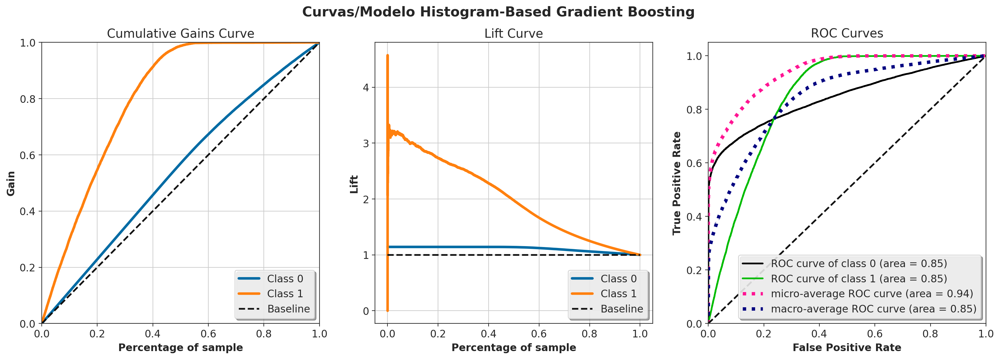

In [209]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_hgb, 'Histogram-Based Gradient Boosting')

## Choosen Model 3: XGBoost
https://xgboost.readthedocs.io/en/stable/parameter.html

In [297]:
# Função Objetivo do Estudo: 
# Maximizar a métrica Precision at K Score (minimizar os Falsos Positivos: descartar os desinteressados)
# Maximizar a métrica Recall at K Score (minimizar os Falsos Negativos: interessados que foram descartados)

def objective(trial):
    
    # trial parameters
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    random_state = 42
    eta = trial.suggest_float("eta", 0, 1)
    gamma = trial.suggest_float("gamma", 0, 10)
    max_depth = trial.suggest_int("max_depth", 5, 15)
    min_child_weight = trial.suggest_float("min_child_weight", 1e-3, 1)
    subsample = trial.suggest_float("subsample", 0, 1)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0, 1)
    eval_metric = trial.suggest_categorical("eval_metric", ("error", "logloss"))
    
    # model definition
    xgb_classifier = XGBClassifier(n_estimators = n_estimators,
                                   random_state = random_state,
                                   eta = eta,
                                   gamma = gamma,
                                   max_depth = max_depth,
                                   min_child_weight = min_child_weight,
                                   subsample = subsample,
                                   colsample_bytree = colsample_bytree,
                                   eval_metric = eval_metric)
    # model training
    xgb_classifier.fit(x_train, y_train)

    # model prediction - generalization
    yhat_xgb = xgb_classifier.predict_proba(x_validation)

    # precision_at_k
    pk_score = precision_at_k_model(df9, yhat_xgb, k)
    
    # recall_at_k
    rk_score = recall_at_k_model(df9, yhat_xgb, k)
    
    return pk_score, rk_score

In [316]:
# Criação do objeto de estudo
study = optuna.create_study(directions=["maximize", "maximize"], pruner=optuna.pruners.MedianPruner())

# otimização da função objective
study.optimize(objective, n_trials = 50)

# seleção da tentativa de melhor resultado
trial = study.best_trials

In [299]:
optuna.visualization.plot_param_importances(study, target=lambda t: t.values[1], target_name="rk_score")

In [300]:
optuna.visualization.plot_pareto_front(study, target_names=["pk_score", "rk_score"])

- Trial 22 finished with values: [0.33745, 0.7087052399453954] and parameters: {'n_estimators': 120, 'eta': 0.14917376051767528, 'gamma': 9.493990013218953, 'max_depth': 11, 'min_child_weight': 0.9838210761084735, 'subsample': 0.7826897109978379, 'colsample_bytree': 0.9072515525604128, 'eval_metric': 'logloss'}.

In [210]:
# Fit Model with Best hyperparameters
# model definition
xgb_model = XGBClassifier(n_estimators = 120,#77,#161,
                          random_state = 42,
                          eta = 0.1491,#0.0121,#0.01,
                          gamma = 9.4939,#3.5823,#2.2376,
                          max_depth = 11,#7,#5,
                          min_child_weight = 0.9838,#0.7722,#0.7837,
                          subsample = 0.7826,#0.0191,#0.5908,
                          colsample_bytree = 0.9072,#0.1987,#0.5,
                          eval_metric = 'logloss')#'error' )

# model training
xgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_xgb = xgb_model.predict_proba(x_validation)
yhat1_xgb = xgb_model.predict(x_validation)

In [211]:
# print scores
print_predict_scores(y_validation,yhat1_xgb)

Precision Score: 40.99%
Recall Score: 18.25%
Accuracy Score: 86.5%
Balanced Accuracy Score: 57.25%


In [212]:
# Metrics at k
# compute precision at k
precision = precision_at_k_model(df9, yhat_xgb, k)

# compute recall at k
recall = recall_at_k_model(df9, yhat_xgb, k)

print(f'For XGBoost model:\nPrecision at K({k}) = {100*precision:.2f}%\nRecall at K({k}) = {100*recall:.2f}%\n')

For XGBoost model:
Precision at K(20000) = 33.80%
Recall at K(20000) = 71.00%



In [213]:
# cross validation results
xgb_tunned_result_cv = cross_validation(xgb_model, x_train, y_train, 5, df5, k=20000)
pkl.dump(xgb_tunned_result_cv, open('../models/xgb_tunned_result_cv.pkl','wb'))
xgb_tunned_result_cv

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,XGBClassifier,0.957,0.001,0.877,0.001,0.919,0.919,1.000,0.000,0.381,0.000


In [214]:
# # save model, yhat_model
# pkl.dump(xgb_model, open('../models/xgb_model.pkl', 'wb'))
# pkl.dump(yhat_xgb, open('../models/yhat_xgb.pkl', 'wb'))
# pkl.dump(yhat1_xgb, open('../models/yhat1_xgb.pkl', 'wb'))

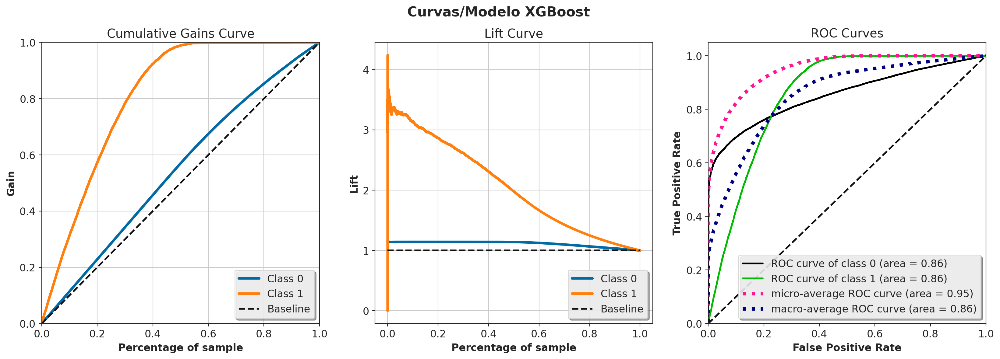

In [215]:
# After Resample
# Acumulative Gain | Lift Curve | ROC Curves 
plot_gain_lift_roc(y_validation, yhat_xgb, 'XGBoost')

## Resume

In [216]:
# concat tunned result_cv
lgbm_tunned_result_cv = pkl.load(open('../models/lgbm_tunned_result_cv.pkl', 'rb'))
hgb_tunned_result_cv = pkl.load(open('../models/hgb_tunned_result_cv.pkl', 'rb'))
xgb_tunned_result_cv = pkl.load(open('../models/xgb_tunned_result_cv.pkl', 'rb'))
pd.concat([lgbm_tunned_result_cv,hgb_tunned_result_cv,xgb_tunned_result_cv],axis=0)

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,LGBMClassifier,0.946,0.002,0.875,0.002,0.912,0.912,1.000,0.000,0.381,0.000
0,HistGradientBoostingClassifier,0.911,0.003,0.868,0.002,0.891,0.891,1.000,0.000,0.381,0.000
0,XGBClassifier,0.957,0.001,0.877,0.001,0.919,0.919,1.000,0.000,0.381,0.000


## Final Model
- XGBoost  
- Calibration
https://scikit-learn.org/stable/modules/generated/sklearn.calibration.CalibratedClassifierCV.html

In [237]:
# Calibration

# load pickle model
base_model = pkl.load(open('../models/xgb_model.pkl', 'rb'))

# model definition
clb_xgb_model = CalibratedClassifierCV(base_estimator=base_model, cv='prefit', n_jobs=-1)

# model training
clb_xgb_model.fit(x_train, y_train)

# model prediction - generalization
yhat_clb_xgb = clb_xgb_model.predict_proba(x_validation)
yhat1_clb_xgb = clb_xgb_model.predict(x_validation)

In [238]:
# print scores prefit
print_predict_scores(y_validation,yhat1_clb_xgb)

Precision Score: 39.48%
Recall Score: 28.46%
Accuracy Score: 85.61%
Balanced Accuracy Score: 61.11%


In [239]:
# Metrics at k = 20000 prefit
# compute precision at k
precision = precision_at_k_model(df9, yhat_clb_xgb, k)

# compute recall at k
recall = recall_at_k_model(df9, yhat_clb_xgb, k)

print(f'{type(clb_model).__name__}')
print(f'For XGBoost base model:\nPrecision at K({k}) = {100*precision:.2f}%\n   Recall at K({k}) = {100*recall:.2f}%\n')

CalibratedClassifierCV
For XGBoost base model:
Precision at K(20000) = 33.72%
   Recall at K(20000) = 70.82%



In [240]:
# cross validation results prefit
clb_xgb_result_cv = cross_validation(clb_xgb_model, x_train, y_train, 5, df5, k=20000)
pkl.dump(clb_xgb_result_cv, open('../models/clb_xgb_result_cv.pkl','wb'))
clb_xgb_result_cv

,Model Name,Precision Mean,Precision STD,Recall Mean,Recall STD,Accuracy Mean,Balanced Accuracy Mean,Precision@K Mean,Precision@K STD,Recall@K Mean,Recall@K STD
0,CalibratedClassifierCV,0.939,0.002,0.895,0.002,0.918,0.918,1.000,0.000,0.381,0.000


# 10. Business Performance

In [245]:
# load pickle model and yhat
final_model = pkl.load(open('../models/xgb_model.pkl', 'rb'))
yhat_xgb = pkl.load(open('../models/yhat_xgb.pkl', 'rb'))

In [246]:
# copy data
df10 = x_validation.copy()
df10['response'] = y_validation.copy()

## Business Problem: Answers

### ***1. Principais Insights sobre os atributos mais relevantes de clientes interessados em adquirir um seguro de automóvel.***

**Entre os interessados em adquirir o seguro de carro:**  

**Vehicle Age**:
- Quase 75% possuem carros seminovos. Apesar disso, entre os que possuem carros mais velhos o percentual de interesse é de quase 30%, enquanto entre os que possuem carros novos e seminovos o percentual de interesse é de apenas 5% e 17%, respectivamente.

**Previously Insured**:
- Quase a totalidade (97,90%) já teve episódio de acidente ou dano ao veículo. Além disso, cerca de 24% deles demonstraram interesse no seguro de carro, enquanto que entre os que nunca tiveram acidente/dano ao veículo este percentual é de apenas 0.5%.

**Age**:
- Cerca de 35% se encontram na faixa etária de 40 a 50 anos. Além disso, dentro desta faixa específica, o percentual de interesse é de 21,24%, contra os 20% de interesse na faixa de 30 a 40 anos.

**Annual Premium**: 
- Cerca de 32% se encontram na faixa de gasto anual entre 30 e 40 mil. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este o segundo pior percentual entre todos as demais faixas de gastos. Pode-se dizer que quanto maior o gasto o anual com o seguro de saúde, maior é o interesse em adquirir o  seguro de carro.

**Vintage**: 
- Cerca de 32,60% entraram na base há no máximo 2 meses. Contudo, dentro desta faixa específica, o percentual de interesse é de 12%, sendo este semelhante a todos das demais faixas de tempo. Pode-se dizer que o interesse em adquirir o seguro de carro independe de quanto tempo faz que o cliente está na base.

**Policy Sales Channel**: 
- 42780 clientes estão concentrados em apenas 10 dos 155 canais de venda catalogados na base, o que representa mais de 90% do total de clientes interessados. Além disso, há 34 canais de vendas pelos quais nenhum cliente demonstrou interesse em adquirir o novo produto.

**Region Code** 
- 33740 clientes estão concentrados em apenas 10 dos 53 region_code catalogados na base, o que representa cerca de 72% do total de clientes interessados. Com exceção da região de código 28, que sozinha representa quase 43% da base de interessados, nas demais regiões o percentual de interesse é mais uniforme.

### ***2. Qual a porcentagem de clientes interessados no novo produto que o time de vendas conseguirá contatar fazendo 20.000 ligações?***

k=20000 representa 26.24% da base de clientes
Com esta quantidade de ligações é possível atingir cerca de 71.00% dos interessados


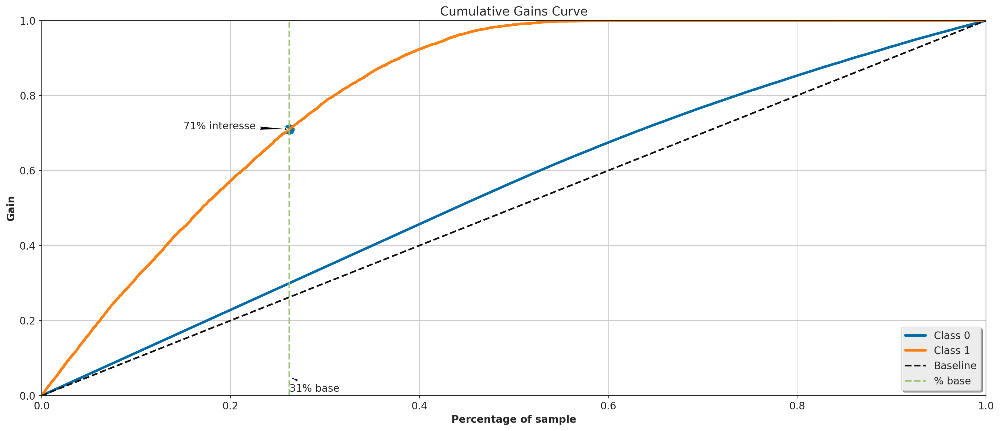

In [433]:
# calculo de percentagem da base
k = 20000
perc_of_dataset_20k = k / len(df10)

# compute recall at k
recall_at_20k = recall_at_k_model(df10, yhat_xgb, k)

print(f'k={k} representa {100*perc_of_dataset_20k:.2f}% da base de clientes')
print(f'Com esta quantidade de ligações é possível atingir cerca de {100*recall_at_20k:.2f}% dos interessados')

# plot graphics
skplt.metrics.plot_cumulative_gain(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_20k, recall_at_20k, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_20k, 0, 1, color='g', ls='--', lw=2, label='% base')
#plt.axhline(recall_at_k, 0, 1, color='r', ls='--', lw=2, label='% interesse')

plt.annotate(f'{100*perc_of_dataset:.0f}% base', xy=(perc_of_dataset_20k,0.05), xytext=(perc_of_dataset_20k, 0.01), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))

plt.annotate(f'{100*recall_at_20k:.0f}% interesse', xy=(perc_of_dataset_20k, recall_at_20k), xytext=(0.15, recall_at_20k), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

**Com as primeiras 20 mil ligações propostas pelo modelo, o time de marketing terá um desempenho aproximadamente 2.7 vezes maior do que a escolha aleatória.** 

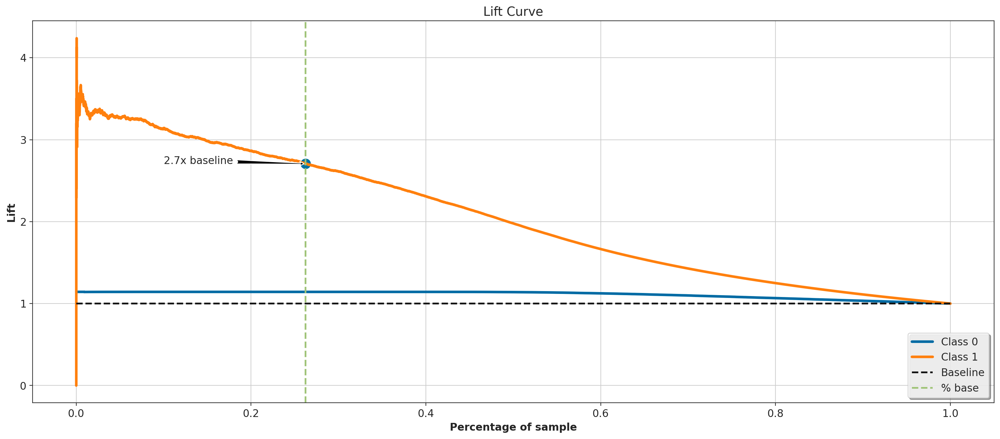

In [435]:
# plot graphics
better = recall_at_20k/perc_of_dataset_20k
skplt.metrics.plot_lift_curve(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_20k, better, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_20k, 0, 1, color='g', ls='--', lw=2, label='% base')
plt.annotate(f'{better:.1f}x baseline', xy=(perc_of_dataset_20k, better), xytext=(0.1, better), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

### ***3. E se a capacidade do time de vendas aumentar para 40.000 ligações, qual a porcentagem de clientes interessados o time de vendas conseguirá contatar?***

k=40000 representa 52.48% da base de clientes
Com esta quantidade de ligações é possível atingir cerca de 99.44% dos interessados


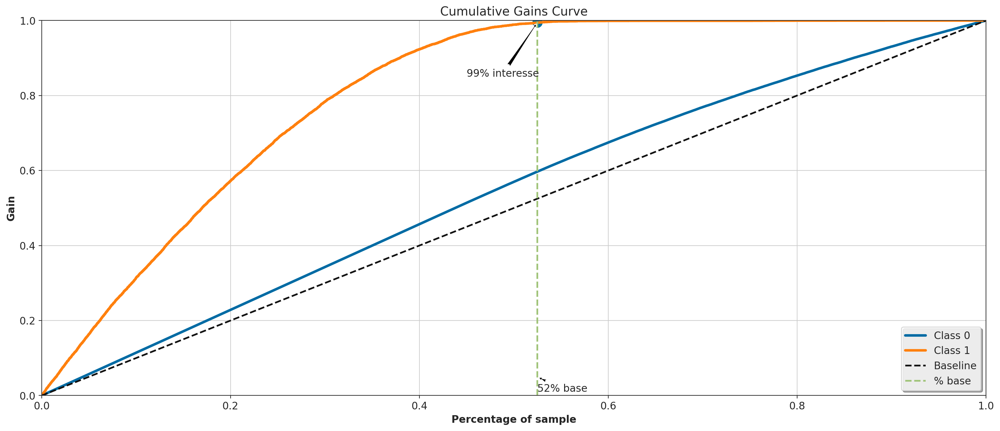

In [437]:
# calculo de percentagem da base
k = 40000
perc_of_dataset_40k = k / len(df10)

# compute recall at k
recall_at_40k = recall_at_k_model(df10, yhat_xgb, k)

print(f'k={k} representa {100*perc_of_dataset_40k:.2f}% da base de clientes')
print(f'Com esta quantidade de ligações é possível atingir cerca de {100*recall_at_40k:.2f}% dos interessados')

# plot graphics
skplt.metrics.plot_cumulative_gain(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_40k, recall_at_40k, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_40k, 0, 1, color='g', ls='--', lw=2, label='% base')
#plt.axhline(recall_at_k, 0, 1, color='r', ls='--', lw=2, label='% interesse')

plt.annotate(f'{100*perc_of_dataset_40k:.0f}% base', xy=(perc_of_dataset_40k,0.05), xytext=(perc_of_dataset_40k, 0.01), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))

plt.annotate(f'{100*recall_at_40k:.0f}% interesse', xy=(perc_of_dataset_40k, recall_at_40k), xytext=(0.45, 0.85), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

**Com as primeiras 40 mil ligações propostas pelo modelo, o time de marketing terá um desempenho aproximadamente 1.9 vezes maior do que a escolha aleatória.** 

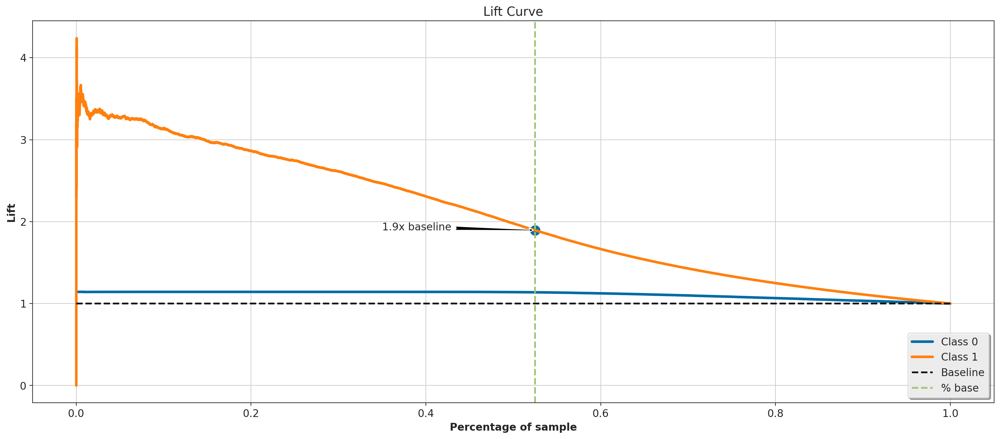

In [438]:
# plot graphics
better = recall_at_40k/perc_of_dataset_40k
skplt.metrics.plot_lift_curve(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_40k, better, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_40k, 0, 1, color='g', ls='--', lw=2, label='% base')
plt.annotate(f'{better:.1f}x baseline', xy=(perc_of_dataset_40k, better), xytext=(0.35, better), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

### ***4. Quantas ligações o time de vendas precisa fazer para contatar 80% dos clientes interessados no novo produto?***

k=23601 representa 30.96% da base de clientes
Com esta quantidade de ligações é possível atingir cerca de 80.00% dos interessados


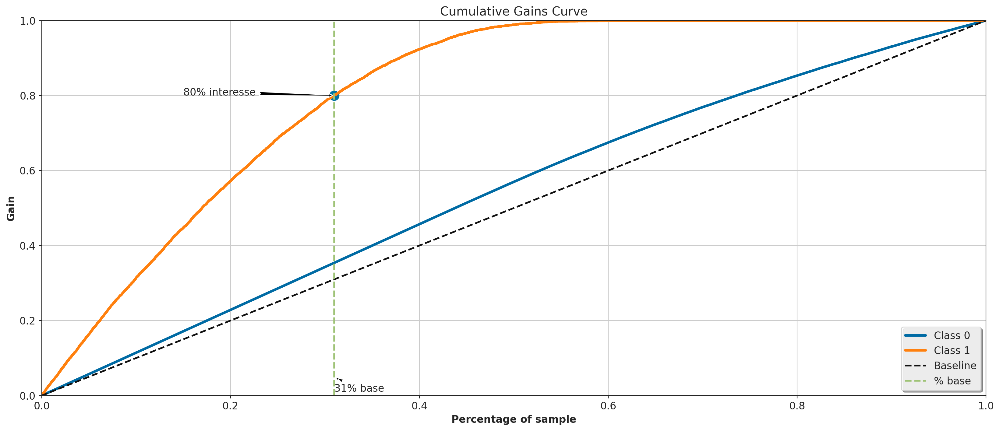

In [439]:
# calculo de percentagem da base
k = 23601
perc_of_dataset_23k = k / len(df10)

# compute recall at k
recall_at_23k = recall_at_k_model(df10, yhat_xgb, k)

print(f'k={k} representa {100*perc_of_dataset_23k:.2f}% da base de clientes')
print(f'Com esta quantidade de ligações é possível atingir cerca de {100*recall_at_23k:.2f}% dos interessados')

# plot graphics
skplt.metrics.plot_cumulative_gain(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_23k, recall_at_23k, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_23k, 0, 1, color='g', ls='--', lw=2, label='% base')
#plt.axhline(recall_at_k, 0, 1, color='r', ls='--', lw=2, label='% interesse')

plt.annotate(f'{100*perc_of_dataset_23k:.0f}% base', xy=(perc_of_dataset_23k,0.05), xytext=(perc_of_dataset_23k, 0.01), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))

plt.annotate(f'{100*recall_at_23k:.0f}% interesse', xy=(perc_of_dataset_23k, recall_at_23k), xytext=(0.15, 0.8), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

**Com as primeiras 23,6 mil ligações propostas pelo modelo, o time de marketing terá um desempenho aproximadamente 2.6 vezes maior do que a escolha aleatória.** 

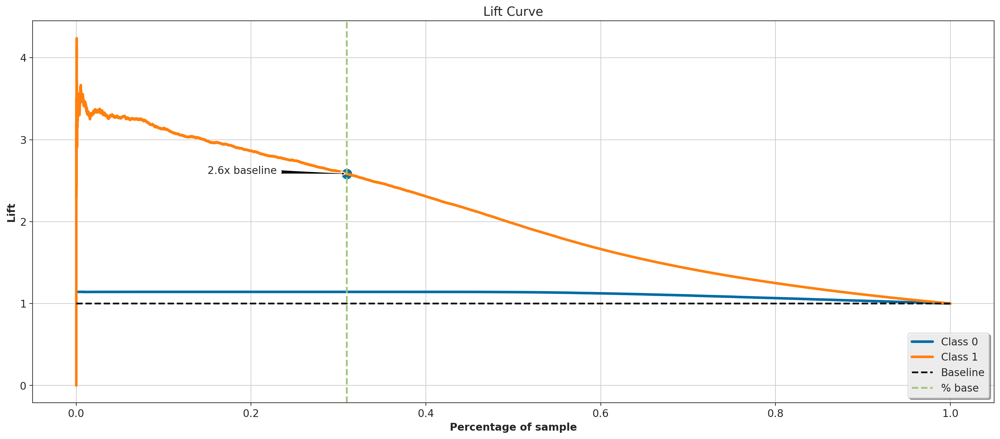

In [440]:
# plot graphics
better = recall_at_23k/perc_of_dataset_23k
skplt.metrics.plot_lift_curve(y_validation, yhat_xgb)
plt.scatter(perc_of_dataset_23k, better, marker="o", color='b', linewidths=5, s=50)
plt.axvline(perc_of_dataset_23k, 0, 1, color='g', ls='--', lw=2, label='% base')
plt.annotate(f'{better:.1f}x baseline', xy=(perc_of_dataset_23k, better), xytext=(0.15, better), 
             arrowprops=dict(facecolor='black', shrinkA=2, arrowstyle='fancy'))
plt.legend(loc=4)
plt.show(); 

### Comparativo entre a escolha aleatória e o modelo treinado

In [527]:
# valor estipulado para um seguro de carro = $1000
insurance = 1000.0

# tamanho da base
len_base = len(df10)

df=pd.DataFrame({'k':[20000,23601,40000],
                 'perc_base':[perc_of_dataset_20k,perc_of_dataset_23k,perc_of_dataset_40k],
                 'recal@k':[recall_at_20k,recall_at_23k,recall_at_40k]})
df['random'] = df['perc_base'].apply(lambda x: int(x*len(df10)*insurance))
df['model'] = df['recal@k'].apply(lambda x: int(x*len(df10)*insurance))
df['gain'] = df['model'] - df['random']
df['better'] = df['recal@k']/df['perc_base']
df

,k,perc_base,recal@k,random,model,gain,better
0,20000,0.262,0.710,20000000,54114978,34114978,2.706
1,23601,0.310,0.800,23601000,60974398,37373398,2.584
2,40000,0.525,0.994,40000000,75797788,35797788,1.895


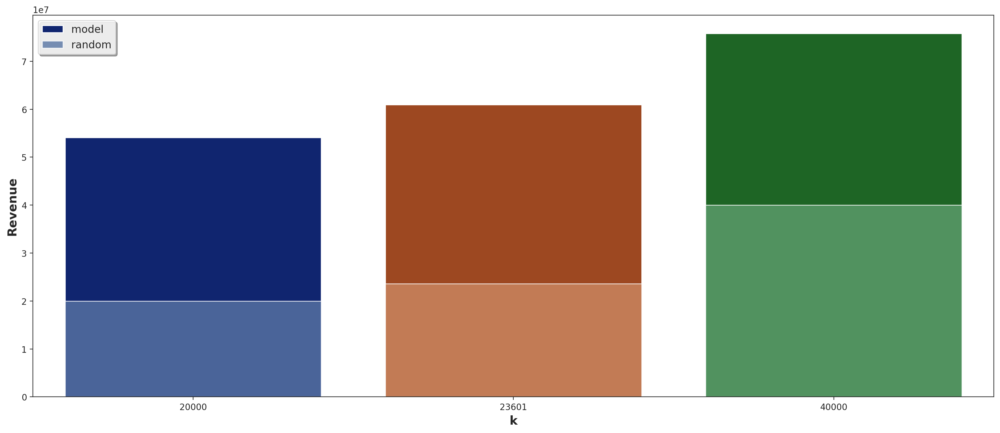

In [529]:
# plot comparison
plt.figure(figsize=[20,8])
sns.barplot(x='k', y='model', data=df,palette="dark", alpha=1, label='model')
sns.barplot(x='k', y='random', data=df,palette="deep", alpha=.8, label='random')
plt.legend()
plt.ylabel('Revenue');

# 11. Deploy to Production

## 11.1. Health Insurance Class

In [43]:
import pickle
import numpy  as np
import pandas as pd

class HealthInsurance:
    
    def __init__( self ):
        self.home_path             = '/home/geordano/repos/Health_Insurance/health_insurance_cross_sell/'
        self.age_scaler            = pickle.load( open( self.home_path + 'src/features/age_scaler.pkl','rb' ) ) 
        self.annual_premium_scaler = pickle.load( open( self.home_path + 'src/features/annual_premium_scaler.pkl','rb' ) )
        self.gender_scaler         = pickle.load( open( self.home_path + 'src/features/gender_scaler.pkl','rb' ) )
        self.historical_scaler     = pickle.load( open( self.home_path + 'src/features/historical_scaler.pkl','rb' ) )
        self.potential_scaler      = pickle.load( open( self.home_path + 'src/features/potential_scaler.pkl','rb' ) )
        self.region_code_scaler    = pickle.load( open( self.home_path + 'src/features/region_code_scaler.pkl','rb' ) )
        self.p_s_channel_scaler    = pickle.load( open( self.home_path + 'src/features/policy_sales_channel_scaler.pkl','rb' ) )
        self.vehicle_age_scaler    = pickle.load( open( self.home_path + 'src/features/vehicle_age_scaler.pkl','rb' ) )
        self.vintage_scaler        = pickle.load( open( self.home_path + 'src/features/vintage_scaler.pkl','rb' ) )
    
    # ======== defines map functions ========== #
    def vehicle_age_map(self, vehicle_age):
        if vehicle_age == '< 1 Year':
            return 1
        elif vehicle_age == '1-2 Year':
            return 1.5
        else:
            return 2


    def damage_map(self, damage):
        if damage == 'Yes':
            return 1
        else:
            return 0
    
    
    def gender_weight_map(self, gender):
        if gender == 'Male':
            return 0.6
        else:
            return 0.4
        
    
    def premium_weight_map(self, premium):
        if premium < 20000:
            return 0.5
        if 20000 <= premium <= 30000:
            return 2.5
        elif 30000 < premium <= 40000:
            return 3
        elif 40000 < premium <= 50000:
            return 2 
        elif 50000 < premium <= 60000:
            return 1.5
        elif 60000 < premium <= 70000:
            return 1 
        elif 70000 < premium:
            return 0.5

        return 0
    
    
    def age_weight_map(self, age):
        if 20 <= age < 30:
            return 2
        elif 30 <= age < 40:
            return 3
        elif 40 <= age < 50:
            return 4
        elif 50 <= age < 60:
            return 3
        elif 60 <= age < 70:
            return 2
        elif 70 <= age:
            return 1

        return 0
    
      
    def data_cleaning( self, data ):
        # Rename Columns
        data.columns = data.columns.str.lower()
        
        # Change Data Types
        data['id']                   = data['id'].astype( 'int32' )
        data['age']                  = data['age'].astype( 'int16' )
        data['driving_license']      = data['driving_license'].astype( 'uint8' )
        data['region_code']          = data['region_code'].astype( 'int16' )
        data['previously_insured']   = data['previously_insured'].astype( 'uint8' )
        data['policy_sales_channel'] = data['policy_sales_channel'].astype( 'int16' )
        data['vintage']              = data['vintage'].astype( 'uint8' )
        data['response']             = data['response'].astype( 'uint8' )
        
        return data 

    
    def feature_engineering( self, data ):
        # Feature Engineering
        # vehicle_age
        data['vehicle_age'] = data['vehicle_age'].map(self.vehicle_age_map)
        #data['vehicle_age'] = data['vehicle_age'].apply( lambda x: 2 if x == '> 2 Years' else 1.5 if x == '1-2 Year' else 1 )


        # vehicle_damage
        data['vehicle_damage'] = data['vehicle_damage'].map(self.damage_map).astype( 'uint8' ) 
        #data['vehicle_damage'] = data['vehicle_damage'].apply( lambda x: 1 if x == 'Yes' else 0 ).astype( 'uint8' ) 

        # potential
        # Calculus
        #potential =  (data['gender'].map(self.gender_weight_map) + data['annual_premium'].apply(self.premium_weight_map) + 
        #             data['age'].apply(self.age_weight_map) + data['driving_license']) 
        # insert column
        #data.insert(loc=len(data.columns)-1, column='potential', value=potential)

        # historical
        # Calculus
        #historical = (data['vehicle_age']**2 + data['vehicle_damage'] + data['previously_insured'])
        # insert column
        #data.insert(loc=len(data.columns)-1, column='historical', value=historical)
        
        return data
    
    
    def data_preparation( self, data ):
        # age - MinMax Scaler 
        data.loc[:,'age'] = self.age_scaler.transform( data[['age']].values)
        
        # annual_premium - Robust Scaler
        data.loc[:,'annual_premium'] = self.annual_premium_scaler.transform( data[['annual_premium']].values)

        # gender - Factorize Encoding
        factor_gender, unique = pd.factorize(data.loc[:,'gender'], sort=True)
        data.loc[:,'gender'] = factor_gender
        #data.loc[:, 'gender'] = data['gender'].map(self.gender_scaler )
        
        # historical - MinMax Scaler
        data.loc[:,'historical'] = self.historical_scaler.transform( data[['historical']].values)
        
        # potential - Robust Scaler
        data.loc[:,'potential'] = self.potential_scaler.transform( data[['potential']].values)

        # region_code - Target Encoding
        data.loc[:,'region_code'] = data.loc[:,'region_code'].map(self.region_code_scaler)

        # policy_sales_channel - Frequency Encoding
        data.loc[:,'policy_sales_channel'] = data.loc[:,'policy_sales_channel'].map(self.p_s_channel_scaler)

        # vehicle_age - Factorize Encoding
        factor_vehicle_age, unique = pd.factorize(data.loc[:,'vehicle_age'], sort=True)
        data.loc[:,'vehicle_age'] = factor_vehicle_age
        #data.loc[:, 'vehicle_age'] = data['vehicle_age'].map( self.vehicle_age_scaler )        
        
        # vintage - MinMax Scaler
        data.loc[:,'vintage'] = self.vintage_scaler.transform( data[['vintage']].values)

        # fillna
        data = data.fillna(0)

        # Feature Selection by Boruta
        cols_selected = ['age','annual_premium','region_code','policy_sales_channel',
                         'previously_insured','vehicle_damage','vintage']
        
        return data[ cols_selected ]
    
    
    def get_prediction( self, model, original_data, test_data ):
        # model prediction
        pred = model.predict_proba( test_data )
        
        # join prediction into original data
        original_data.loc[:,'score'] = pred[:,1].tolist()
        
        return original_data.to_json( orient='records', date_format='iso' )

## 11.2. API Handler

In [204]:
import pickle
import pandas as pd
from flask import Flask, request, Response
from healthinsurance.HealthInsurance import HealthInsurance

# loading model
path = '/home/geordano/repos/Health_Insurance/health_insurance_cross_sell/'
model = pickle.load( open( path + 'models/xgb_model.pkl', 'rb'))

# initialize API
app = Flask( __name__ )

#@app.route( '/healthinsurance/predict', methods=['POST'] )
@app.route( '/predict', methods=['POST'] )
def health_insurance_predict():
    test_json = request.get_json()
    
    if test_json: # there is data
        if isinstance( test_json, dict ): # unique example
            test_raw = pd.DataFrame( test_json, index=[0] )
            
        else: # multiple example
            test_raw = pd.DataFrame( test_json, columns=test_json[0].keys() )
            
        # Instantiate HealthInsurance class
        pipeline = HealthInsurance()
        
        # data cleaning
        df1 = pipeline.data_cleaning( test_raw )
        
        # feature engineering
        df2 = pipeline.feature_engineering( df1 )
        
        # data preparation
        df3 = pipeline.data_preparation( df2 )
        
        # prediction
        df_response = pipeline.get_prediction( model, test_raw, df3 )
        
        return df_response
    
    else:
        return Response( '{}', status=200, mimetype='application/json' )
    
if __name__ == '__main__':
    app.run( '0.0.0.0', debug=True, port=5000)

ModuleNotFoundError: No module named 'healthinsurance'

## 11.3. API Tester

### TEST DATASET on HEROKU

In [21]:
# load test dataset
df_test = pd.read_csv('../data/raw/test.csv')

print(f'Tamanho do dataset: {df_test.shape[0]} linhas')

df_test.head()

Tamanho do dataset: 127037 linhas


,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage
0,381110,Male,25,1,11.0,1,< 1 Year,No,35786.0,152.0,53
1,381111,Male,40,1,28.0,0,1-2 Year,Yes,33762.0,7.0,111
2,381112,Male,47,1,28.0,0,1-2 Year,Yes,40050.0,124.0,199
3,381113,Male,24,1,27.0,1,< 1 Year,Yes,37356.0,152.0,187
4,381114,Male,27,1,28.0,1,< 1 Year,No,59097.0,152.0,297


In [22]:
# convert dataframe to json
data = json.dumps( df_test.to_dict( orient='records' ) )

# API Call
# url = 'http://0.0.0.0:5000/predict' # local
url = 'https://insurance-gds.herokuapp.com/predict'
header = {'Content-type': 'application/json' }

r = requests.post( url, data=data, headers=header )
print( f'Status Code {r.status_code}' )

Status Code 200


In [121]:
# Get predictions
df_score = pd.DataFrame( r.json(), columns=r.json()[0].keys() )

# merge predictions on test dataset
final_result = pd.merge(df_test, df_score[['id','score']], how='left', on='id')
final_result = final_result.sort_values( 'score', ascending=False ).reset_index(drop=True)

# ranking
# Calculus
ranking =  np.arange(1,len(final_result)+1,1) 

# insert column
final_result.insert(loc=0, column='ranking', value=ranking)
final_result.head()

,ranking,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,score
0,1,499810,Male,25,1,34.0,0,< 1 Year,Yes,34321.0,152.0,231,0.986982
1,2,449051,Male,25,1,28.0,0,1-2 Year,Yes,34407.0,154.0,186,0.986281
2,3,504774,Female,25,1,39.0,0,< 1 Year,Yes,34296.0,160.0,181,0.986281
3,4,485728,Female,25,1,15.0,0,< 1 Year,Yes,34331.0,152.0,164,0.985952
4,5,482350,Male,25,1,15.0,0,< 1 Year,Yes,34298.0,152.0,103,0.985871


In [120]:
# save ranked list to report csv
filename = '../data/processed/ranked_list.csv'
final_result.to_csv(filename, encoding='utf-8',index=False)